## The Lifecycle In A Data Science Projects


### 1. Data Gathering
1. Problem Identification/problem understanding
2.	Data collection
3.	Train Val Test split
4.	Just look at the data/try to get a sense of the data/Understand the data
5.	Data cleaning

### 2.EDA

6.	Univariate Analysis
7.	Bi-variate Analysis
8.	Explore Numerical features
9.	Explore Categorical features

### 3.Feature Engineering

10.	Handing Missing values
11.	Handling Outliers
12. Feature transformation
13. Categorical Feature Encoding
14.	Feature scaling
15.	Imbalanced dataset

### 4.Model building

### 5.Feature Selection
16.	Feature Importance
17.	Feature Selection

### 6.Model Evaluation

### 7.Model Saving

### 8.Model Deployment

### 1.Problem Identification/problem understanding

#### Here the problem/challenge is to predict whether a person have the diabeties or not given the relevent parameters

### 2.Data collection
https://www.kaggle.com/datasets/uciml/pima-indians-diabetes-database


### About Dataset
#### Context
This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases. The objective of the dataset is to diagnostically predict whether or not a patient has diabetes, based on certain diagnostic measurements included in the dataset. Several constraints were placed on the selection of these instances from a larger database. In particular, all patients here are females at least 21 years old of Pima Indian heritage.

#### Content
The datasets consists of several medical predictor variables and one target variable, Outcome. Predictor variables includes the number of pregnancies the patient has had, their BMI, insulin level, age, and so on.

#### Acknowledgements
Smith, J.W., Everhart, J.E., Dickson, W.C., Knowler, W.C., & Johannes, R.S. (1988). Using the ADAP learning algorithm to forecast the onset of diabetes mellitus. In Proceedings of the Symposium on Computer Applications and Medical Care (pp. 261--265). IEEE Computer Society Press.

#### Inspiration - Task
Can you build a machine learning model to accurately predict whether or not the patients in the dataset have diabetes or not?

#### The dataset is taken from Kaggle 


In [1]:
## Importing the required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.utils import shuffle

# to ignore warnings
import warnings
warnings.filterwarnings('ignore')

# setting the plot style 
# plt.style.use('ggplot')
sns.set_style('darkgrid')

# To display all the columns of the dataframe
pd.pandas.set_option('display.max_columns',None)

### 3.Train Test split

#### It's a very good practice to split the data into train and test sets as soon as you get the data to avoid overfitting of the model and data leakage.

In [12]:
# Load the data

df = pd.read_csv('../Data/Diabetics/diabetes.csv')

In [13]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [14]:
df.shape

(768, 9)

In [15]:
# Renaming the 'Outcome' feature to 'target' for the ease of analysis

df.rename(columns = {'Outcome':'target'}, inplace = True)

In [16]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [17]:
# sampling 100 instances from the original dataset for each testing, validation sets and the rest will be traing set

test_df = df.sample(n=100,random_state=5)
new_df = df.drop(test_df.index)
val_df = new_df.sample(n=100,random_state=5)
train_df = new_df.drop(val_df.index)

In [18]:
# resetting the index of train, val and test datasets

train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

In [19]:
train_df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
563,1,106,76,0,0,37.5,0.197,26,0
564,6,190,92,0,0,35.5,0.278,66,1
565,10,101,76,48,180,32.9,0.171,63,0
566,2,122,70,27,0,36.8,0.340,27,0


In [20]:
val_df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,0,146,82,0,0,40.5,1.781,44,0
1,13,153,88,37,140,40.6,1.174,39,0
2,4,154,62,31,284,32.8,0.237,23,0
3,2,101,58,35,90,21.8,0.155,22,0
4,3,148,66,25,0,32.5,0.256,22,0
...,...,...,...,...,...,...,...,...,...
95,3,83,58,31,18,34.3,0.336,25,0
96,7,136,90,0,0,29.9,0.210,50,0
97,5,147,75,0,0,29.9,0.434,28,0
98,1,153,82,42,485,40.6,0.687,23,0


In [21]:
test_df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,6,92,62,32,126,32.0,0.085,46,0
1,5,132,80,0,0,26.8,0.186,69,0
2,3,106,72,0,0,25.8,0.207,27,0
3,4,99,68,38,0,32.8,0.145,33,0
4,4,96,56,17,49,20.8,0.340,26,0
...,...,...,...,...,...,...,...,...,...
95,0,167,0,0,0,32.3,0.839,30,1
96,4,183,0,0,0,28.4,0.212,36,1
97,2,155,74,17,96,26.6,0.433,27,1
98,6,85,78,0,0,31.2,0.382,42,0


### 4.Explore the data/try to get a sense of the data

In [22]:
# head() - prints the first 5 rows/records

train_df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [23]:
# prints the shape of the dataframe (rows, columns)

train_df.shape

(568, 9)

In [24]:
# Prints the no.of rows, no.of colunmns, and each columns datatype and the no.of non-null values in each column

train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568 entries, 0 to 567
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               568 non-null    int64  
 1   Glucose                   568 non-null    int64  
 2   BloodPressure             568 non-null    int64  
 3   SkinThickness             568 non-null    int64  
 4   Insulin                   568 non-null    int64  
 5   BMI                       568 non-null    float64
 6   DiabetesPedigreeFunction  568 non-null    float64
 7   Age                       568 non-null    int64  
 8   target                    568 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 40.1 KB


#### Note : Its a very good practice to understand what each column represents / means by reading documents provided my subject matter expert or discusing with the domain expert if not do some reaserch. So that we can have an idea of how important each column/feature is and how to deal with thosemoving forward

#### -- Here we don't have much info from kaggle. we just have to understand by observing each columns data

1. num_preg - Number of times pregnant
2. glucose_conc - Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. diastolic_bp - Diastolic blood pressure (mm Hg)
4. thickness - Triceps skin fold thickness (mm)
5. insulin - 2-Hour serum insulin (mu U/ml)
6. bmi - Body mass index (weight in kg/(height in m)^2)
7. diab_pred - Diabetes pedigree function - this is just an indicator that gives the how likely the person will get diabetics based on family history
8. age - Age (years)
9. target - class

#### -- And this data set is having 9 no.of features (including "target" ) and we must try to understand what each feature means so that it will be helpfull for us to do the better feature selection

In [25]:
# prints the list of collumns, yes its not exactly a list but Index type

train_df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'target'],
      dtype='object')

In [26]:
train_df.isnull().sum()

# see no null values. less work

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
target                      0
dtype: int64

In [27]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

total = train_df.isnull().sum().sort_values(ascending=False)
percent = np.round_(((train_df.isnull().sum()/train_df.isnull().count())*100),decimals=1).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

,Total,Percent
Pregnancies,0,0.0
Glucose,0,0.0
BloodPressure,0,0.0
SkinThickness,0,0.0
Insulin,0,0.0
BMI,0,0.0
DiabetesPedigreeFunction,0,0.0
Age,0,0.0
target,0,0.0


In [28]:
# prints the no.of unique values in each column

train_df.nunique().sort_values(ascending=False)

DiabetesPedigreeFunction    411
BMI                         221
Insulin                     153
Glucose                     130
SkinThickness                50
Age                          48
BloodPressure                46
Pregnancies                  16
target                        2
dtype: int64

In [29]:
# prints the count of category frequency of the target column

train_df['target'].value_counts(normalize=True)

0    0.633803
1    0.366197
Name: target, dtype: float64

### Observations :

1. From above we can see that the data types are represented properly and also no null values 
2. Its small dataset (768), we took 100 for each val,test set.
3. dataset is a bit imbalanced.
4. all are numeric features.

## EDA Exploratory Data Analysis

1. EDA can be leveraged to check for outliers, patterns, and trends in the given data.
2. EDA helps to find meaningful patterns in data.
3. EDA provides in-depth insights into the data sets to solve our business problems.
4. EDA gives a clue to impute missing values in the dataset 

In [30]:
# Extracting numerical column names

numerical_features = train_df.select_dtypes(include=np.number).columns
print(numerical_features)
print(len(numerical_features))

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'target'],
      dtype='object')
9


In [31]:
# Extracting categorical features

categorical_features = train_df.select_dtypes(include='object').columns
print(categorical_features)
print(len(categorical_features))

Index([], dtype='object')
0


In [32]:
# prints the no.of zero's in each feature
# prints the % of zero's values in each feature

zeros_count = {}

for col in train_df.columns:
    if col == 'target':
        continue
    count = (train_df[col] == 0).sum()
    zeros_count[col]=count
df_zeros = pd.DataFrame.from_dict(zeros_count,orient='index',columns=['zeros'])
df_zeros['Percent'] = (df_zeros['zeros']/len(train_df))*100
df_zeros.sort_values(by=['zeros'],ascending=False)

# See there are 'Zeros' in 'Experience' and 'CURRENT_JOB_YRS' faetures

,zeros,Percent
Insulin,272,47.887324
SkinThickness,168,29.577465
Pregnancies,86,15.140845
BloodPressure,26,4.577465
BMI,11,1.936620
Glucose,3,0.528169
DiabetesPedigreeFunction,0,0.000000
Age,0,0.000000


In [33]:
# Insulin - can be zero in diabetic people
# SkinThickness - cannot be zero - may be we dont have the value of it so replaced with zero
# Pregnancies - can be negative
# BloodPressure - cannot be negative
# BMI - cannot be negative
# Glucose - cannot be negative
# DiabetesPedigreeFunction - may be negative
# Age - cannot be negative

In [34]:
## from above i think null values were replaced with zeros. becoz few columns cannot be negative those were must be replaced with zero.

### Statistics summary
#### Statistical summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In [35]:
numerical_features

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'target'],
      dtype='object')

In [36]:
# statistical summary of the data (only for Numerical features)

train_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']].describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,568.0,3.867958,3.446005,0.000,1.00000,3.0000,6.000,15.000
Glucose,568.0,120.693662,31.601651,0.000,100.00000,117.0000,138.000,199.000
BloodPressure,568.0,69.147887,19.655659,0.000,62.00000,72.0000,80.000,122.000
SkinThickness,568.0,20.366197,15.931723,0.000,0.00000,23.0000,32.000,99.000
Insulin,568.0,78.695423,110.752328,0.000,0.00000,39.0000,130.000,846.000
BMI,568.0,31.707923,8.165214,0.000,27.07500,31.9500,36.425,67.100
DiabetesPedigreeFunction,568.0,0.457167,0.309617,0.078,0.24475,0.3595,0.605,2.329
Age,568.0,32.948944,11.418565,21.000,24.00000,29.0000,40.000,81.000


### Observations :

These are very high level and approx observations. we must do further analysis.

1. Mean Pregnency value is 3.8 and max is 15 with a std of ~3.4 seems right skewed and 75% of females have 6 or less pregnencies. seems there are few outliers.
2. Mean 'Glucose' value is ~120 with std of 31 with a max value of 199 and min of 0
3. Mean 'BloodPressure' is ~69 with std of 19 and max value is 122.
4. Mean 'SkinThickness' is 20mm with a std of 15 and the max value is 99 (looks like an outlier) seems right skewed. and 75% females having 'SkinThickness' less than or equal to 32
5. Insulin having the mean value 80 with std of 112 and max 846 (outlier). seems right skewed. and 75% females having 'Insulin' less than or equal to 130
6. BMI having the mean value 31 with std 8 and max value is 67. seems right skewed and have outliers. and and 75% females having 'BMI' less than or equal to 36
7. DiabetesPedigreeFunction having the mean value 0.46 with std 0.31 and max value is 2.3. seems right skewed and have outliers. and and 75% females having 'DiabetesPedigreeFunction' less than or equal to 0.61
8. Age having the mean value 33 with std 11 and max value is 81. seems right skewed and have outliers. and  75% females having 'Age' less than or equal to 40

In [37]:
train_df['target'].value_counts(normalize=True)

# See the dataset is imbalanced (we have only 35% of the diabetics data and rest 65% is non-diabetics data)
# the model will be baised to non-diabetics category if we feed this data directly to model. we need to handle this imbalanced data.

0    0.633803
1    0.366197
Name: target, dtype: float64

In [38]:
fig = px.bar(x=train_df['target'].value_counts().index, y=train_df['target'].value_counts().values,
             text = train_df['target'].value_counts(),color=['blue', 'red'],opacity=0.8)
fig.show()

fig = px.pie(train_df, values=train_df['target'].value_counts().values, names=['No diabetic','diabetic'], title='target',opacity=0.8)
fig.show()

### Univariate Analysis of Numerical_features

In [39]:
train_df[numerical_features].nunique().sort_values(ascending=False)

DiabetesPedigreeFunction    411
BMI                         221
Insulin                     153
Glucose                     130
SkinThickness                50
Age                          48
BloodPressure                46
Pregnancies                  16
target                        2
dtype: int64

In [40]:
## Numerical variables are usually of 2 type
## 1. Continous variable and Discrete Variables

discrete_features = [feature for feature in numerical_features if len(train_df[feature].unique())<25]
print("Discrete Variables Count: {}".format(len(discrete_features)))

Discrete Variables Count: 2


In [41]:
discrete_features

['Pregnancies', 'target']

In [42]:
train_df[discrete_features].head()

,Pregnancies,target
0,6,1
1,1,0
2,8,1
3,1,0
4,0,1


In [43]:
continuous_features=[feature for feature in numerical_features if feature not in discrete_features]
print("Continuous feature Count {}".format(len(continuous_features)))

Continuous feature Count 7


In [44]:
train_df[continuous_features].head()

,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,148,72,35,0,33.6,0.627,50
1,85,66,29,0,26.6,0.351,31
2,183,64,0,0,23.3,0.672,32
3,89,66,23,94,28.1,0.167,21
4,137,40,35,168,43.1,2.288,33


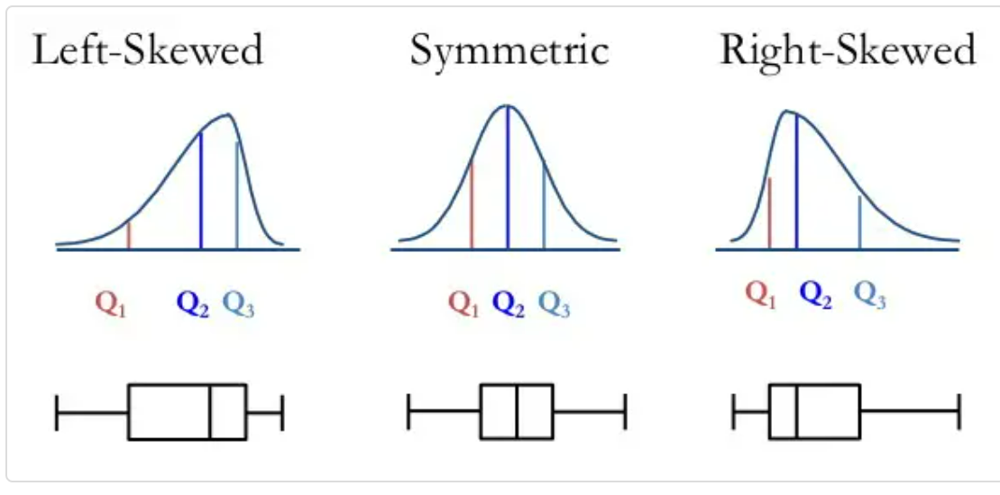

Box plots visually show the distribution of numerical data and skewness through displaying the data quartiles (or percentiles) and averages.

1. When the median is closer to the bottom of the box, and if the whisker is shorter on the lower end of the box, then the distribution is positively skewed (skewed right).

2. When the median is closer to the top of the box, and if the whisker is shorter on the upper end of the box, then the distribution is negatively skewed (skewed left).

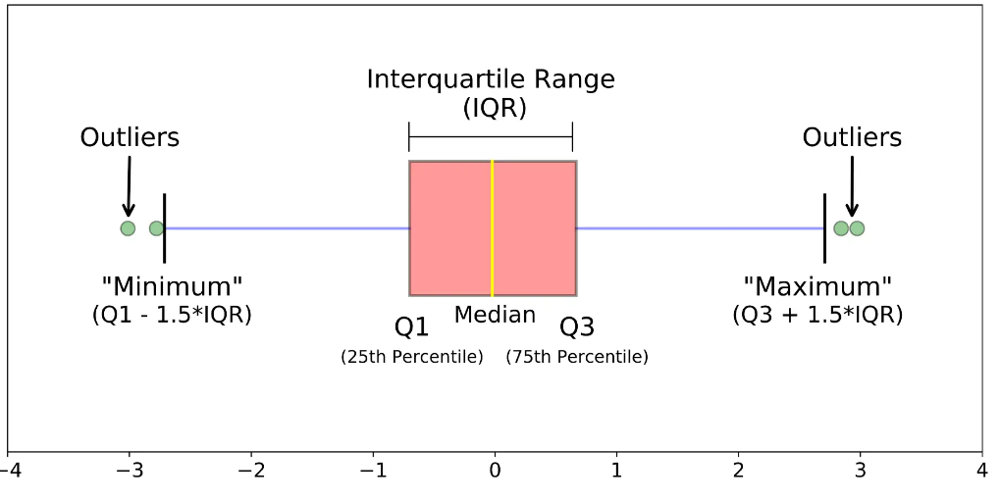

1. If the skewness is between -0.5 and 0.5, the data is fairly symmetrical. If the skewness is between -1 and – 0.5 or between 0.5 and 1, the data are moderately skewed. If the skewness is less than -1 or greater than 1, the data are highly skewed.

2. When the value of the skewness is negative, the tail of the distribution is longer towards the left hand side of the curve. and vice-versa

### Univariate/Bivariate distributions

In [45]:
def plot_comparison(data, col, title):
    fig, ax = plt.subplots(3, 1, sharex=True, figsize=[18,18])
    sns.histplot(data=train_df, x=col, kde=True, ax=ax[0], color = 'cornflowerblue')
    ax[0].set_title('Histogram + KDE')
    sns.boxenplot(x=col, ax=ax[1], color = 'cornflowerblue')
    ax[1].set_title('Boxplot')
    sns.violinplot(x=col, saturation=1, ax=ax[2], color = 'cornflowerblue', bw=.15, cut=0)
    ax[2].set_title('Violin plot')
    fig.suptitle(title, fontsize=16)
    plt.show()

Glucose
Skew : 0.27
no.of zeros : 3
% of zeros : 0.53
no.of nulls : 0
% of nulls : 0.0


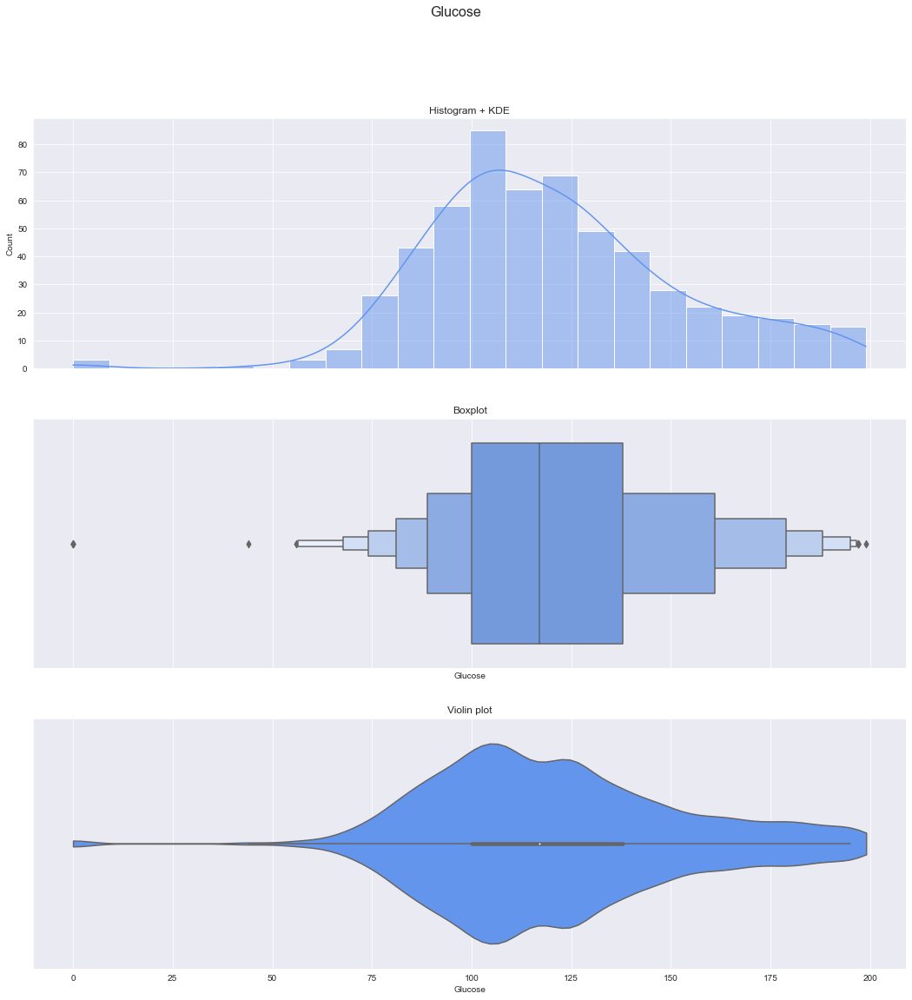

BloodPressure
Skew : -1.77
no.of zeros : 26
% of zeros : 4.58
no.of nulls : 0
% of nulls : 0.0


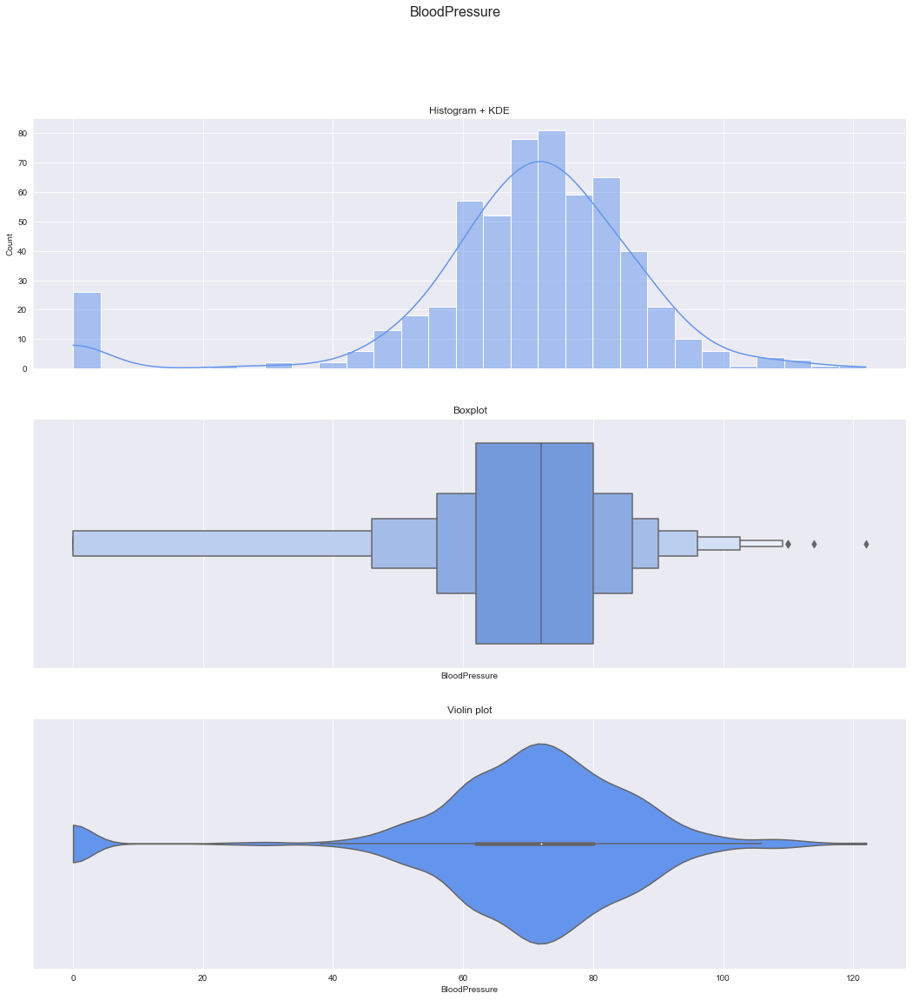

SkinThickness
Skew : 0.17
no.of zeros : 168
% of zeros : 29.58
no.of nulls : 0
% of nulls : 0.0


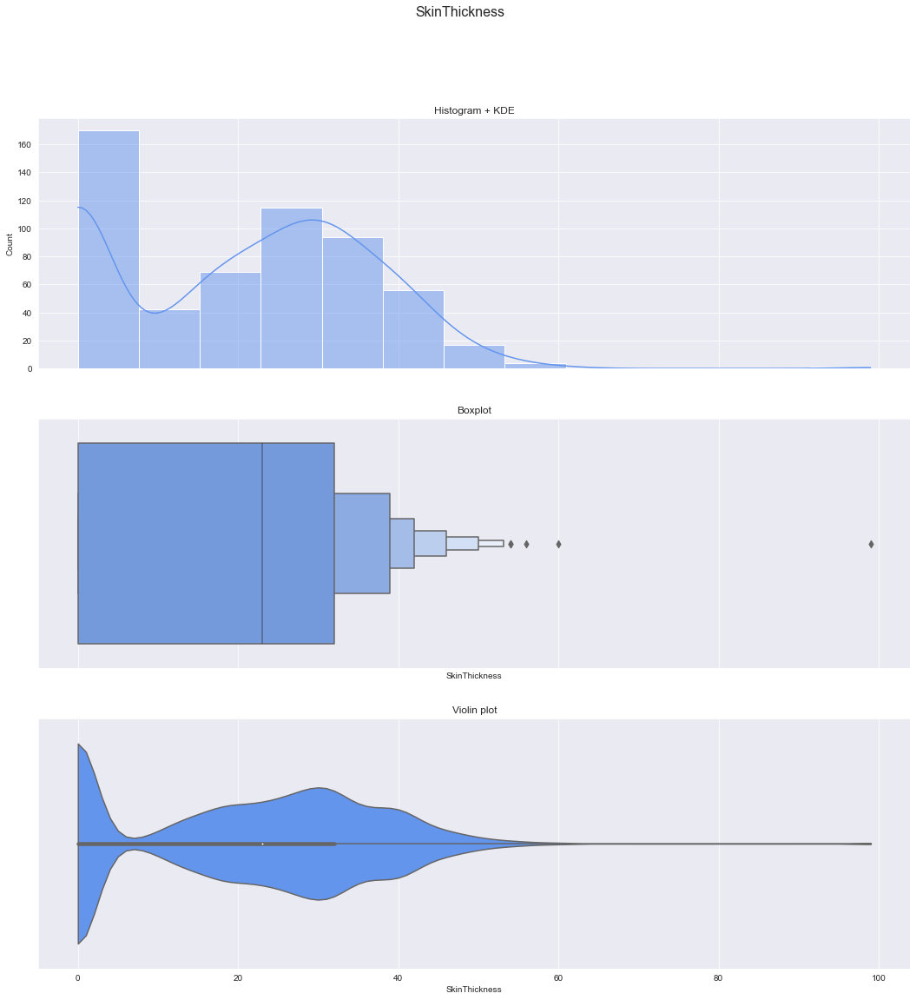

Insulin
Skew : 2.33
no.of zeros : 272
% of zeros : 47.89
no.of nulls : 0
% of nulls : 0.0


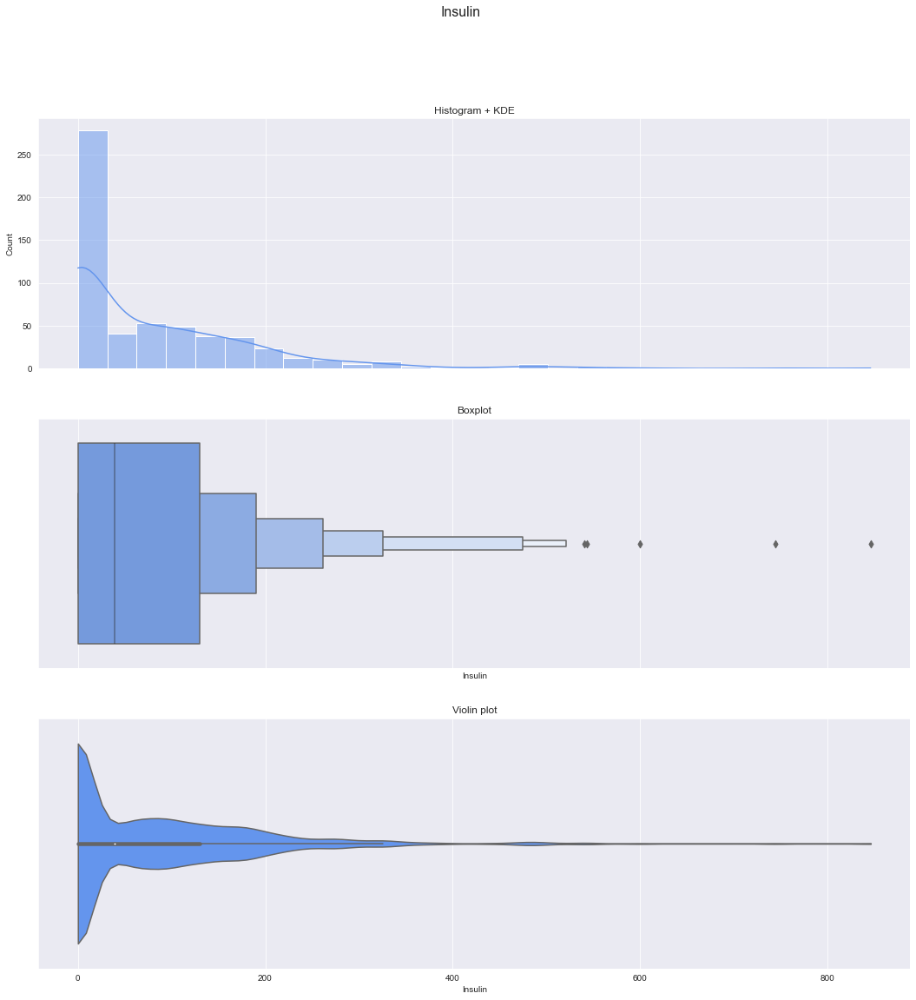

BMI
Skew : -0.6
no.of zeros : 11
% of zeros : 1.94
no.of nulls : 0
% of nulls : 0.0


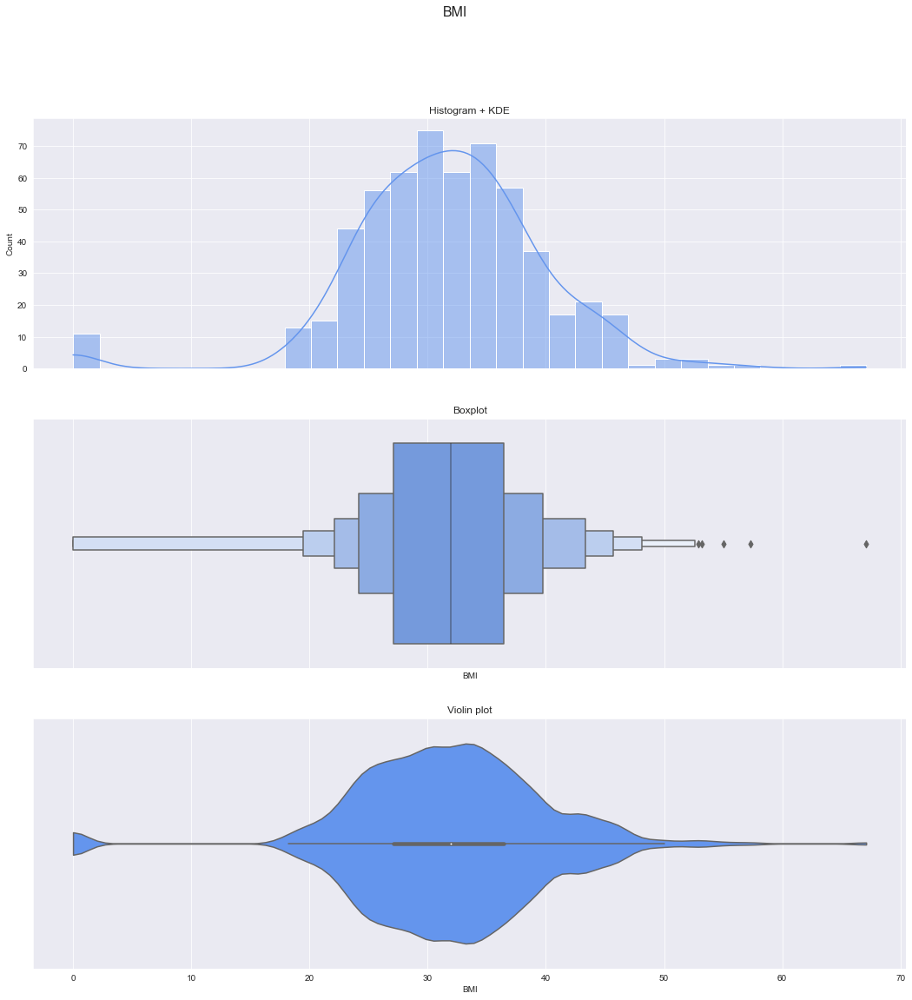

DiabetesPedigreeFunction
Skew : 1.8
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


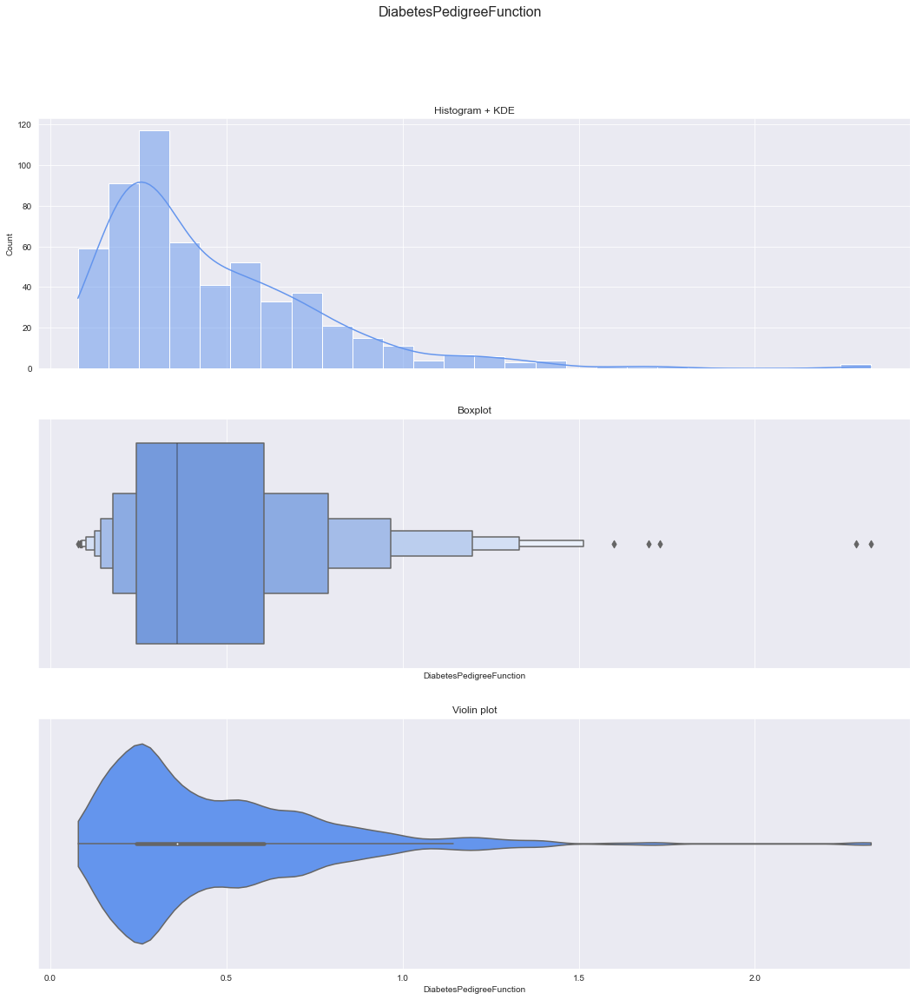

Age
Skew : 1.12
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


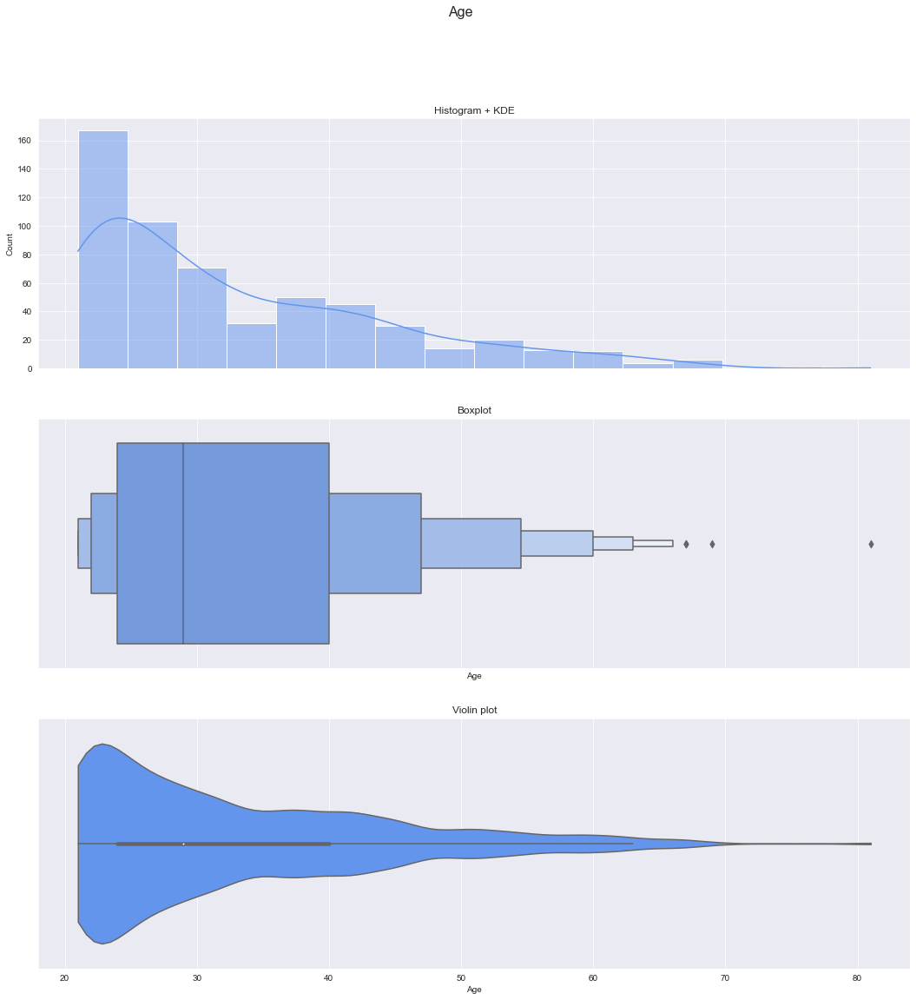

In [46]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    print('no.of zeros :',(train_df[col]==0).sum())
    print('% of zeros :',np.round_((train_df[col]==0).sum()/len(train_df)*100,decimals=2))
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_comparison(train_df, train_df[col], col)

Glucose
no.of nulls : 0
% of nulls : 0.0
Skew : 0.27


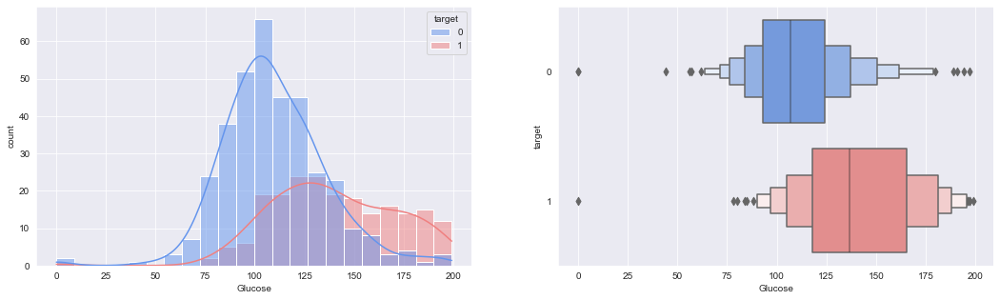

BloodPressure
no.of nulls : 0
% of nulls : 0.0
Skew : -1.77


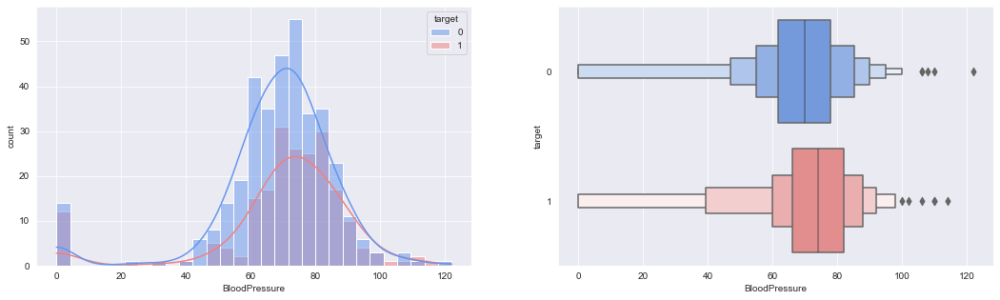

SkinThickness
no.of nulls : 0
% of nulls : 0.0
Skew : 0.17


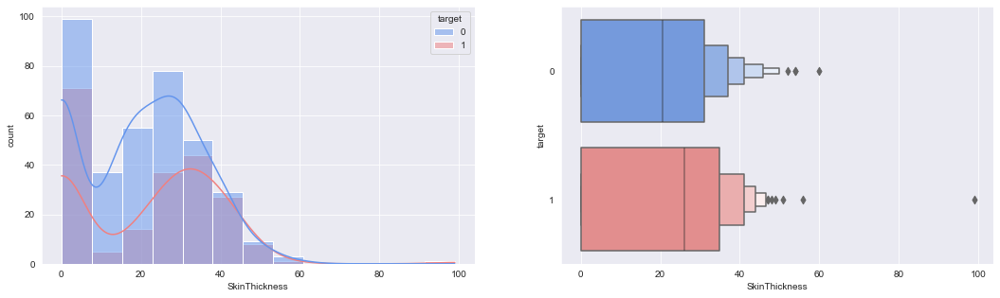

Insulin
no.of nulls : 0
% of nulls : 0.0
Skew : 2.33


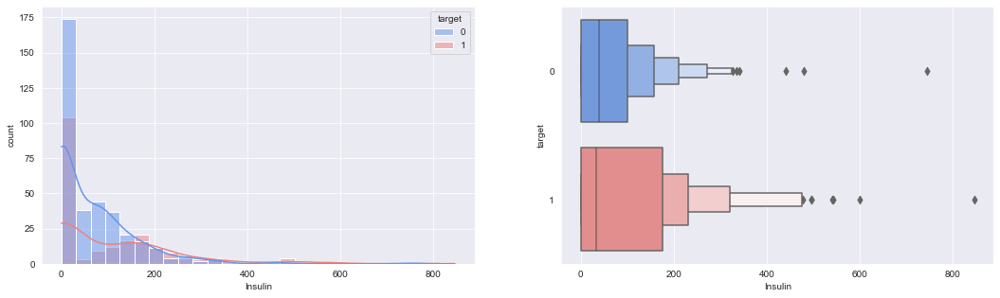

BMI
no.of nulls : 0
% of nulls : 0.0
Skew : -0.6


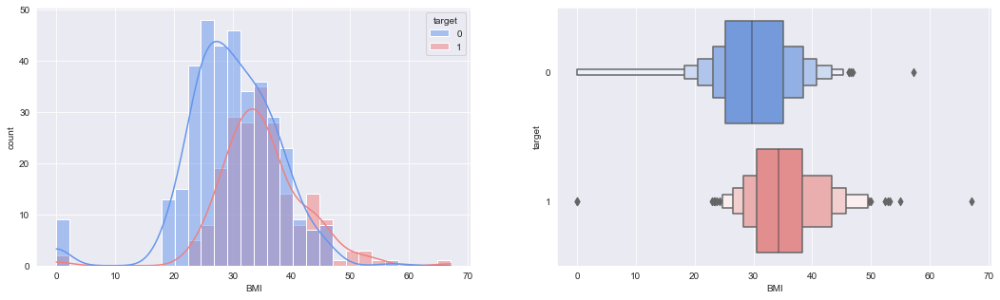

DiabetesPedigreeFunction
no.of nulls : 0
% of nulls : 0.0
Skew : 1.8


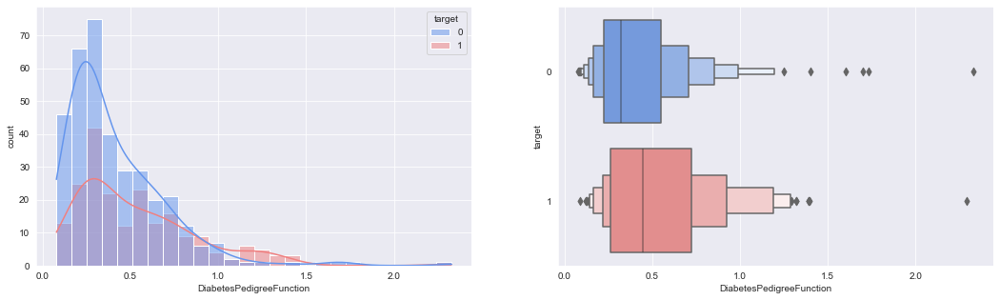

Age
no.of nulls : 0
% of nulls : 0.0
Skew : 1.12


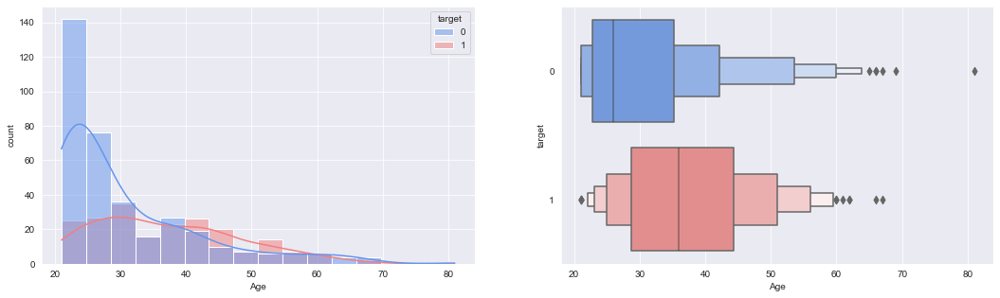

In [47]:
for col in continuous_features:
    print(col)
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True,hue='target',palette=['cornflowerblue','lightcoral'])
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxenplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['cornflowerblue','lightcoral'])
    plt.show()

Glucose
Skew : 0.27


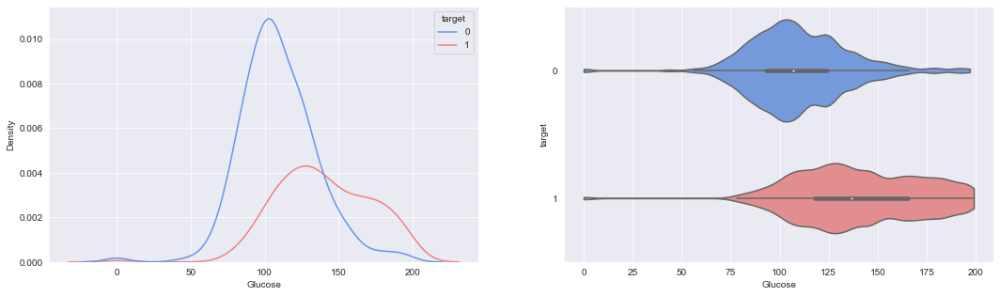

BloodPressure
Skew : -1.77


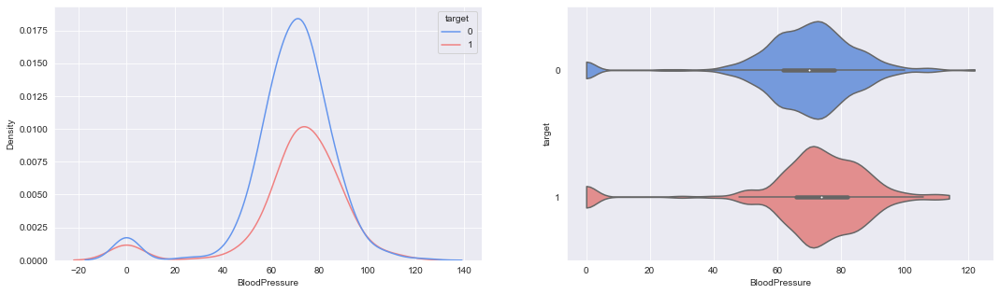

SkinThickness
Skew : 0.17


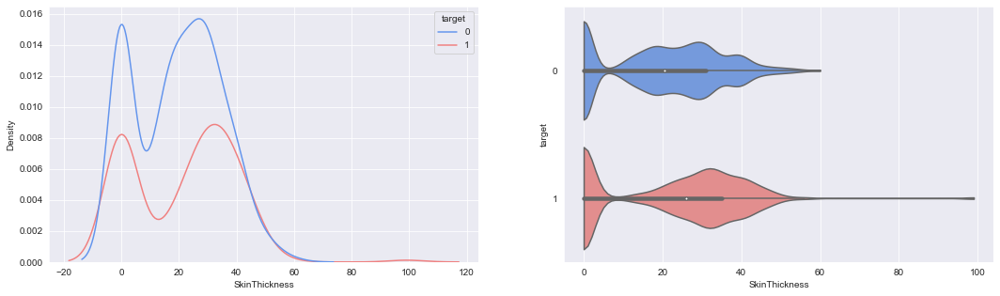

Insulin
Skew : 2.33


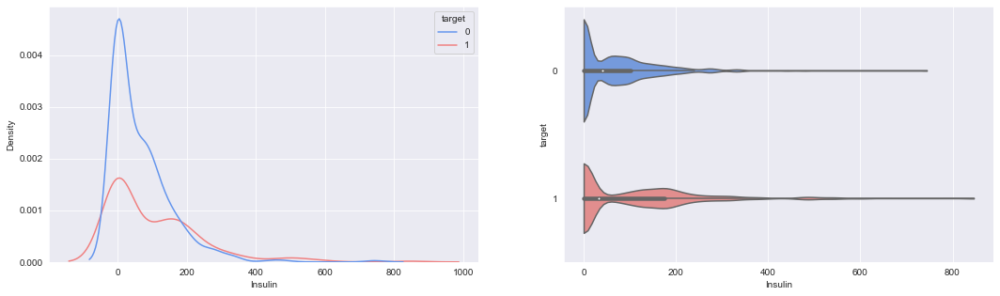

BMI
Skew : -0.6


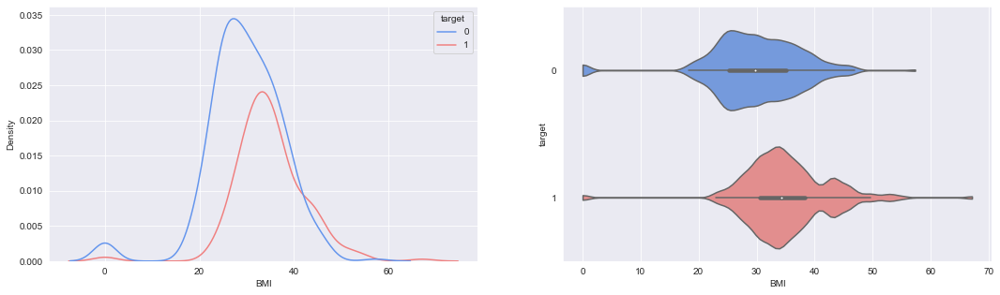

DiabetesPedigreeFunction
Skew : 1.8


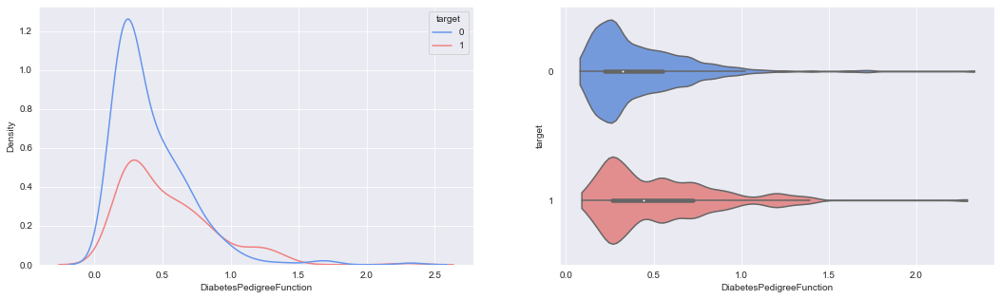

Age
Skew : 1.12


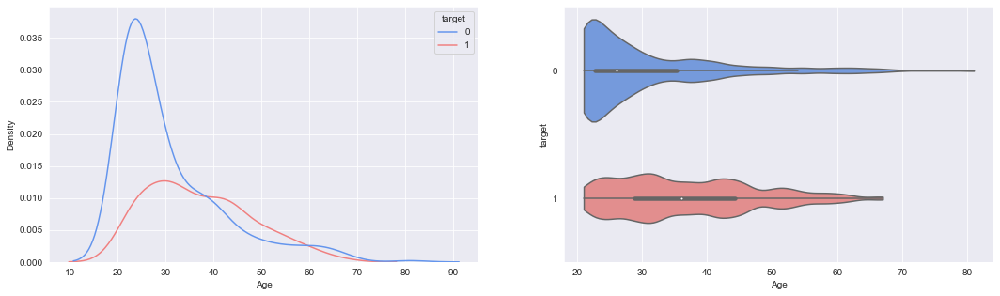

In [48]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.kdeplot(data=train_df, x=col,hue='target',palette=['cornflowerblue','lightcoral'])
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.subplot(1, 2, 2)
    #sns.violinplot(x=train_df[col],saturation=1)
    sns.violinplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['cornflowerblue','lightcoral'], bw=.15,cut=0)
    plt.show()

#### If you want to check whether feature is guassian or normal distributed
#### Q-Q plot

In [49]:
import scipy.stats as stat
import pylab 

Glucose
Skew : 0.27
0.0016432783596666994


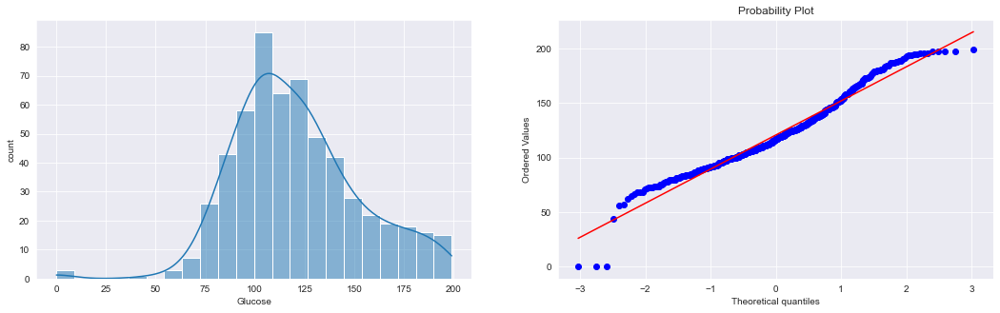

BloodPressure
Skew : -1.77
3.840084675705917e-48


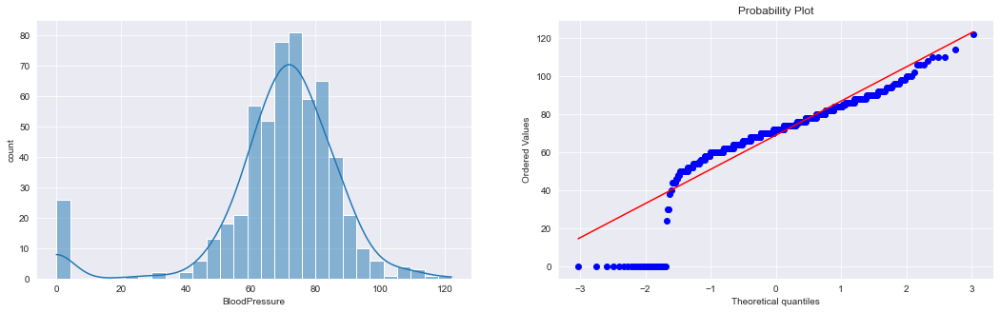

SkinThickness
Skew : 0.17
0.081916922282333


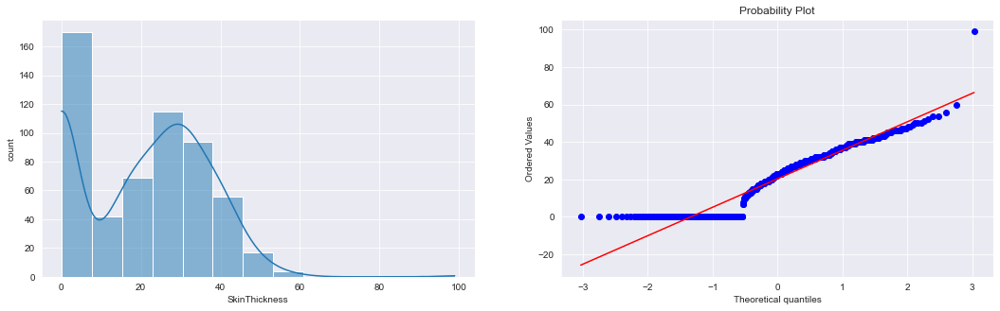

Insulin
Skew : 2.33
3.4445974979389476e-67


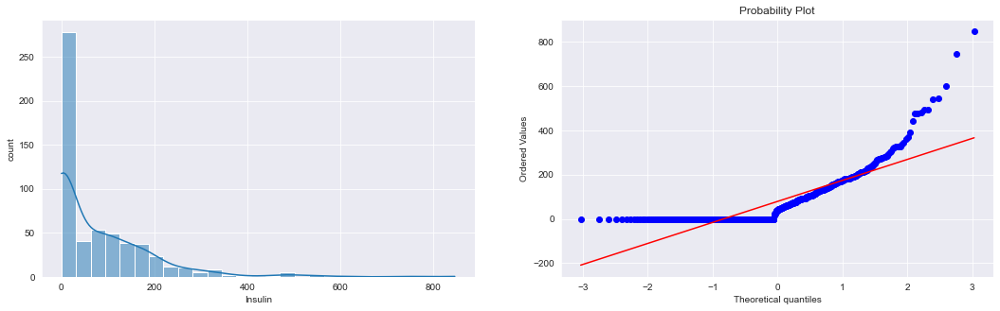

BMI
Skew : -0.6
7.6147919546712325e-19


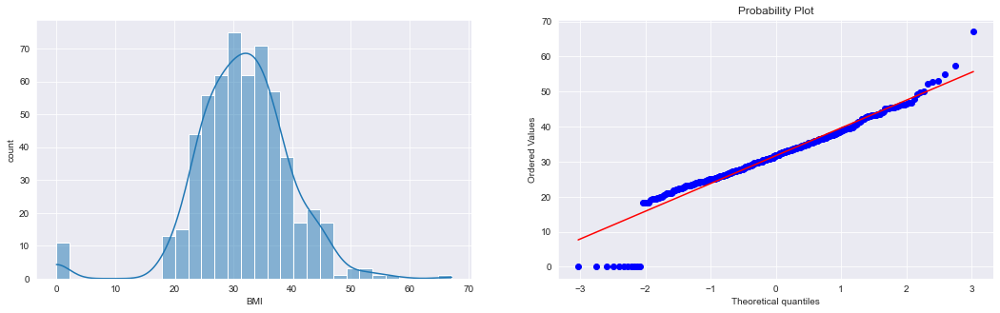

DiabetesPedigreeFunction
Skew : 1.8
9.291536738170926e-50


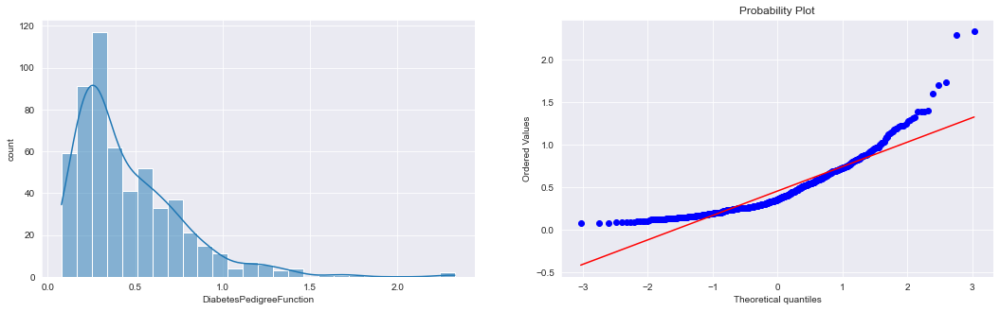

Age
Skew : 1.12
3.797470512570568e-20


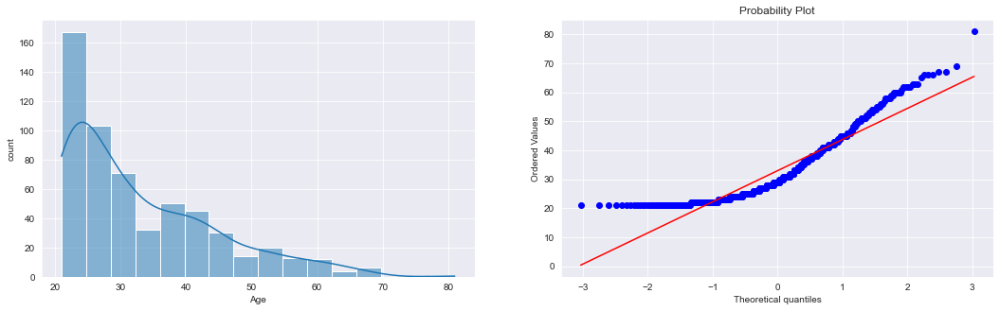

In [50]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    _, p = stat.normaltest(train_df[col].to_numpy())
    print(p)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True)
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    stat.probplot(train_df[col],dist='norm',plot=pylab)
    plt.show()

1. A normal fasting blood glucose level is lower than 95 mg/dL (5.3 mmol/L). One hour after drinking the glucose solution, a normal blood glucose level is lower than 180 mg/dL (10 mmol/L). Two hours after drinking the glucose solution, a normal blood glucose level is lower than 155 mg/dL (8.6 mmol/L).
2. Insulin allows the cells in the muscles, fat and liver to absorb glucose that is in the blood. The glucose serves as energy to these cells, or it can be converted into fat when needed

### Observations :

1. From above we can see that 'Glucose' is close to normal distribution with slightly right skewed.
   And it seems we got the Glucose values measured after taking the meal(assuming) and we can observe that Healthy peoples        Glucose values concentrated around 90-130 while the Diabetic people values spread across 120-190. and we can observe that there are outliers Healthy people Glucsoe values dist (despite the abnormal values people are healthy)
2. 'BloodPressure' is also very close to normal dist (ignoring the zeros). and we can't really observe any difference between Healthy and Diabetic peoples BloodPressure values both are concentrated around 70-90 with few outliers. we cannot really call them as ouliers except the lower end values because the highest value is little over 120 which is normal.
3. 'SkinThickness' seems a bit right skewed but if you ignore that one upper outlier its close to normal dist. Even though both the Healthy and Diabetic peoples dist. overlaping mojorly but we can see that the Diabetic peoples mean SkinThickness is more compared to Healthy people.
4. 'Insulin' is heavily right skewed and have quite no.of outliers. and we can observe that the concentration of Insulin values of Diabetic people are slightly higher than the Healthy people
5. 'BMI' is close to normal dist.ignoring the zeros. and we can observe that the concentration of BMI values of Diabetic people(around 30-40) are higher than the Healthy people(around 25-35)
6. 'DiabetesPedigreeFunction' is right skewed and have few outliers. and we can observe that even though the concentration of DiabetesPedigreeFunction values of Diabetic and Healthy people overlap but the dist. of Diabetic people is more right skewed with more higher values.
7. 'Age' is right skewed and we can observe that even though the concentration of Age values of Diabetic and Healthy people overlap majorly but the dist. of Diabetic peoples Age is more right skewed with more higher values.

In [51]:
train_df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'target'],
      dtype='object')

### Visualizing bivariate/multivariate distributions

Text(0, 0.5, 'No.of diabetic people')

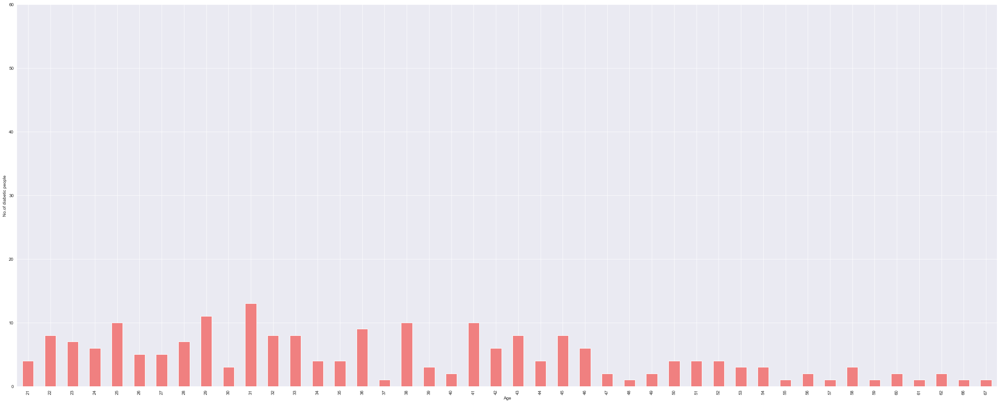

In [52]:
plt.figure(figsize = (40,16))
train_df.loc[train_df['target']==1]['Age'].value_counts().sort_index().plot.bar(color = 'lightcoral')

plt.ylim(0, 60)

plt.xlabel('Age')
plt.ylabel('No.of diabetic people')

# Double click on the plot/graph to zoom in/zoom out

Text(0, 0.5, 'No.of Healthy people')

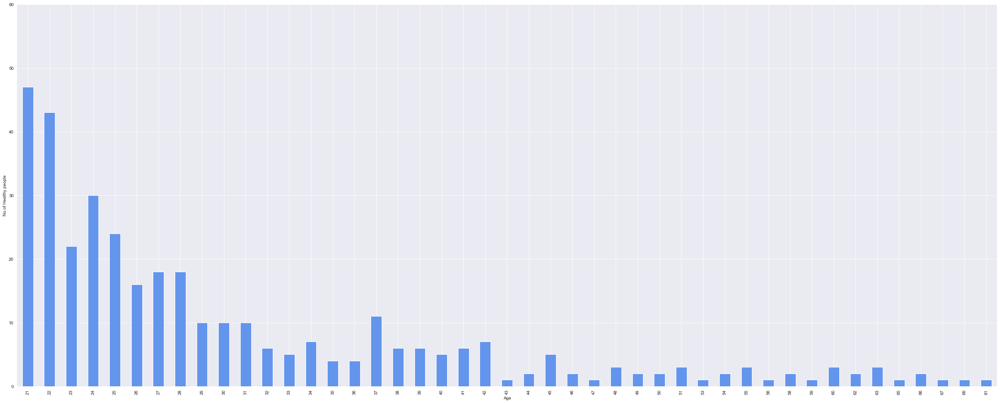

In [53]:
plt.figure(figsize = (40,16))
train_df.loc[train_df['target']==0]['Age'].value_counts().sort_index().plot.bar(color = 'cornflowerblue')

plt.ylim(0, 60)

plt.xlabel('Age')
plt.ylabel('No.of Healthy people')

# Double click on the plot/graph to zoom in

In [54]:
# From above we cannot clearly find any patterns with Age vs target 
# but one thing is clear that there are less old (above age 50) Diabetic people compared to young (below age 50) Diabetic people
# And people between 20-28 are less prone to Diabetic

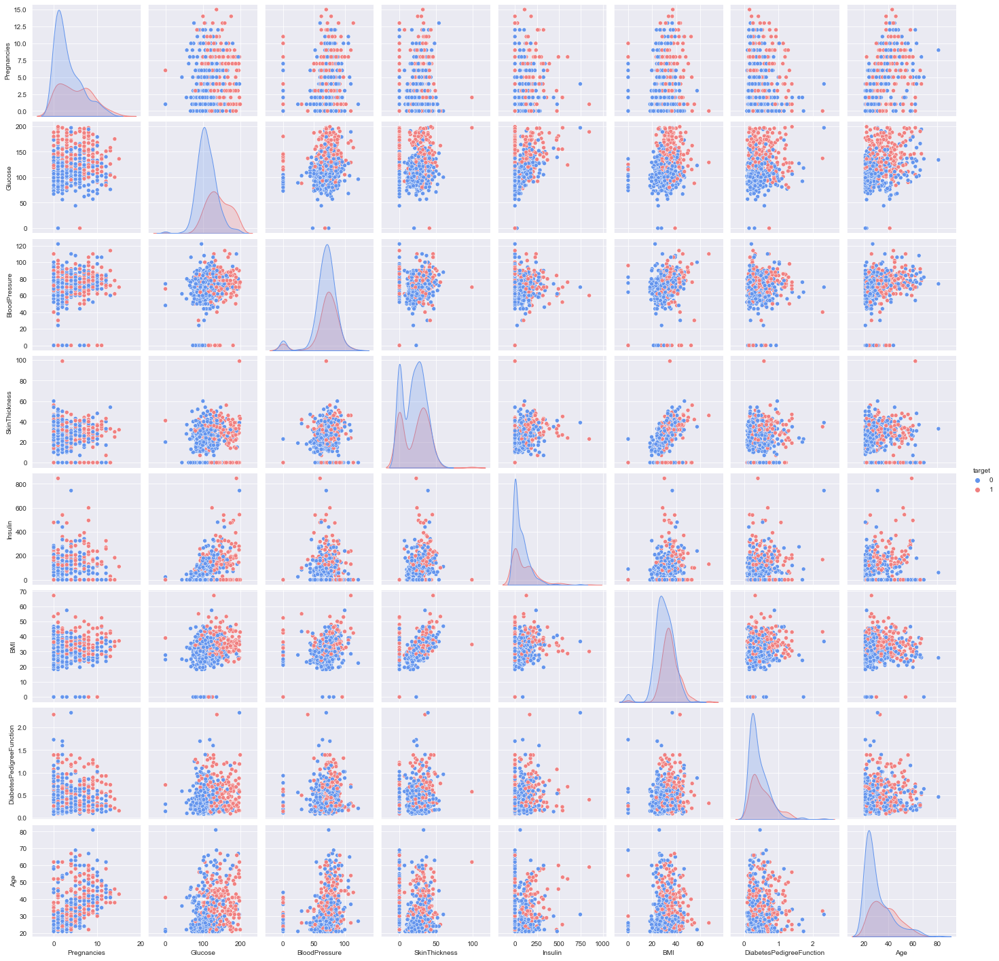

In [55]:
sns.pairplot(train_df, hue='target',palette=['cornflowerblue','lightcoral'])

# Its not clear to observe graphs closely we will plot indvidual plots for some features

In [56]:
train_df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'target'],
      dtype='object')

Glucose


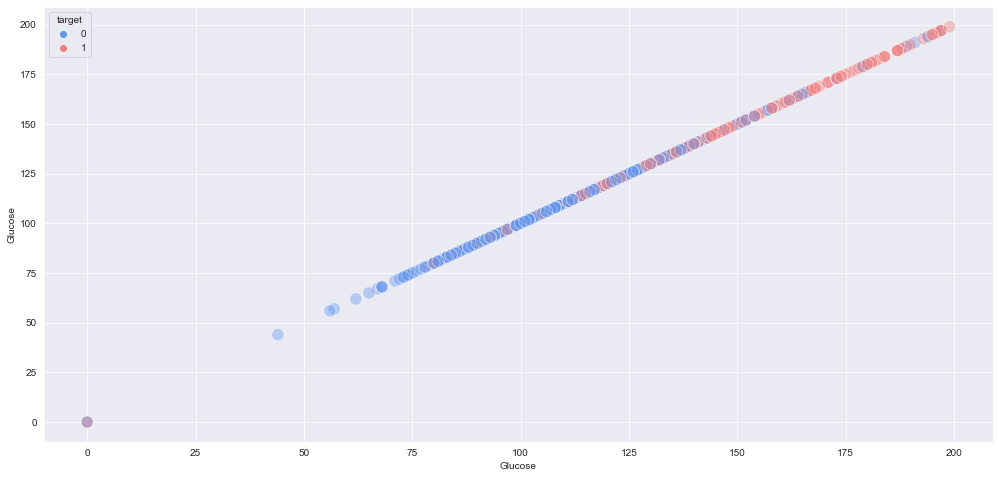

BloodPressure


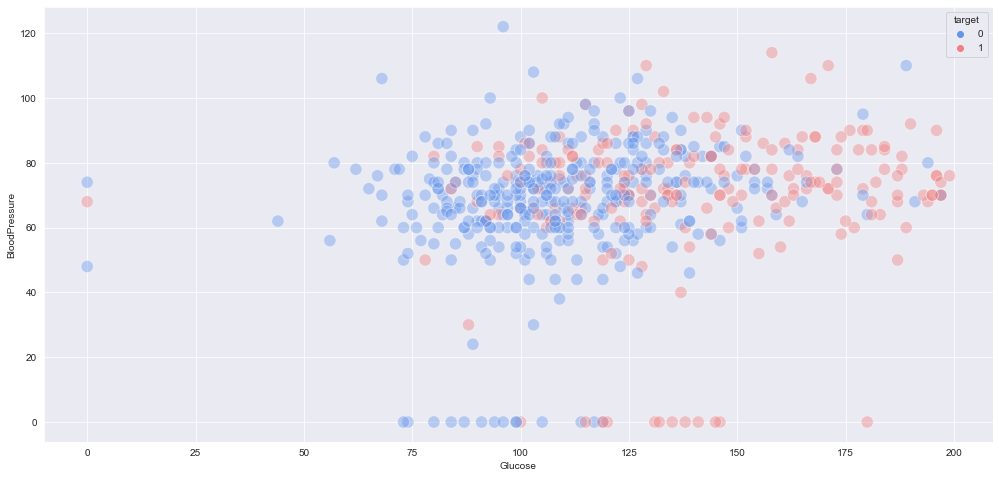

SkinThickness


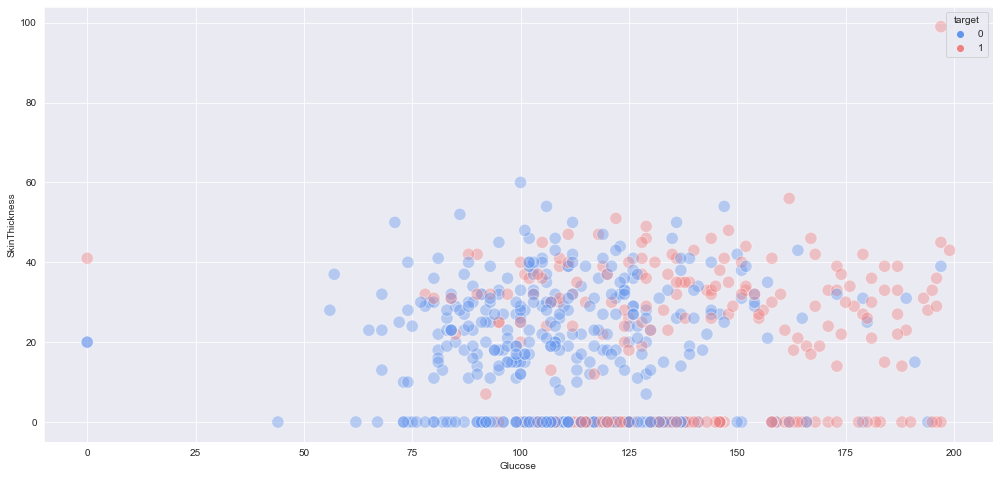

Insulin


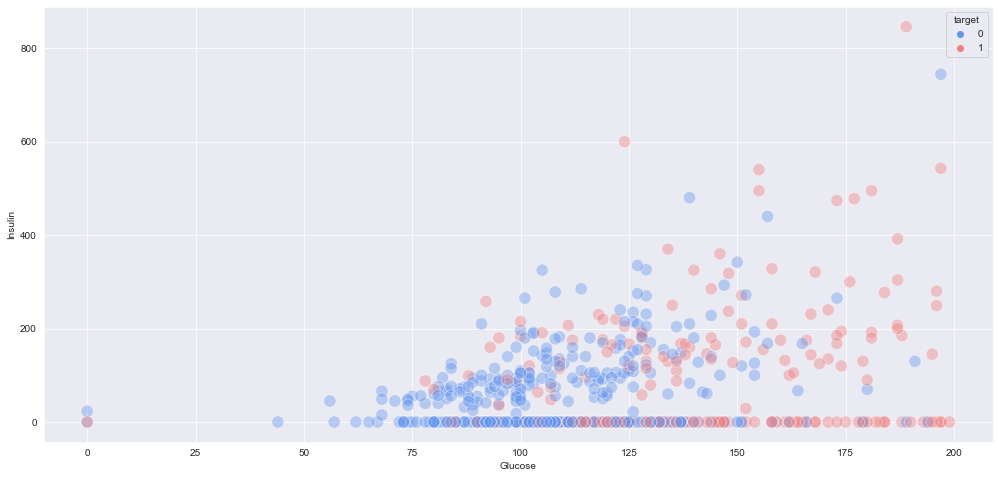

BMI


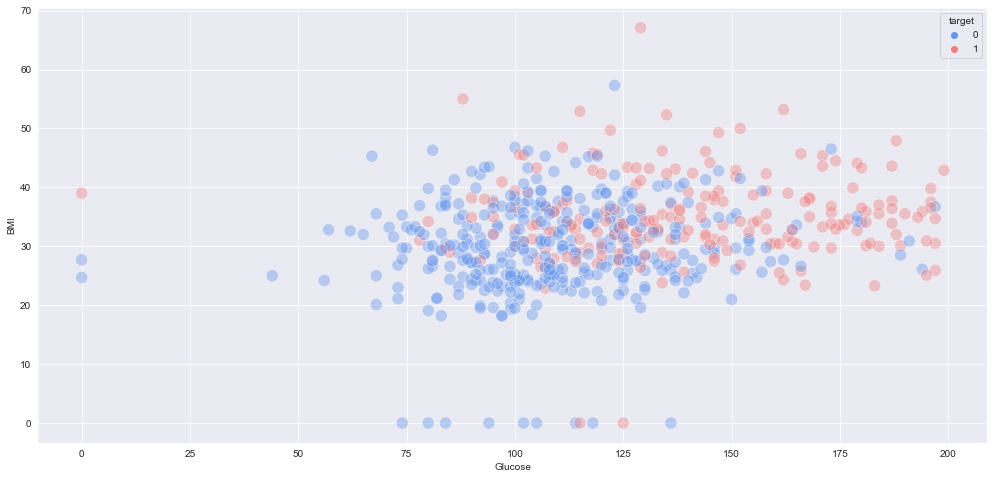

DiabetesPedigreeFunction


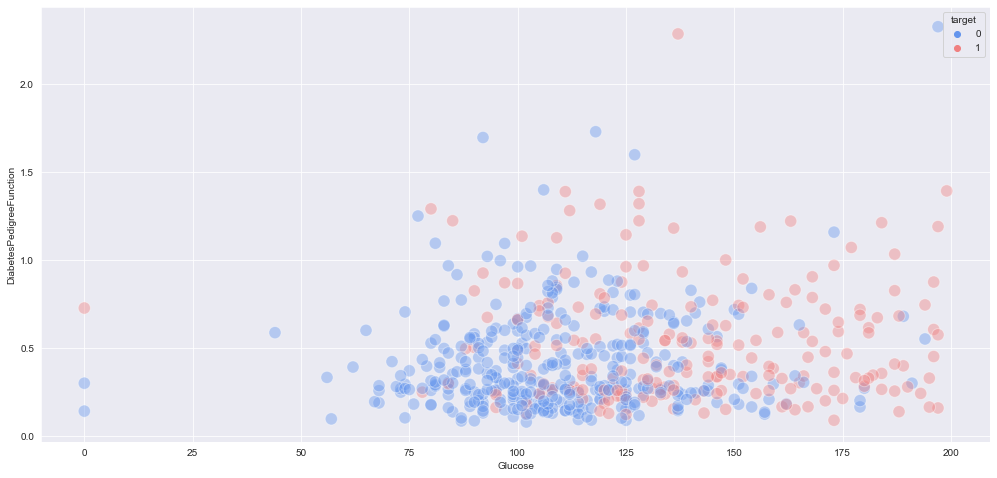

Age


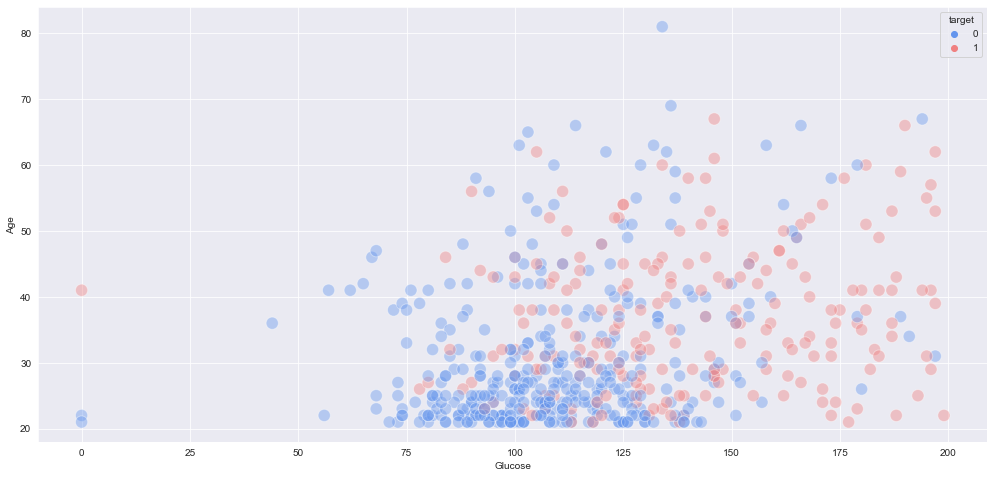

In [57]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Glucose',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Glucose')
    plt.ylabel(col)
    plt.show()

### Observations :

1. From above we can observe there is a slight ositive correlation between 'Insulin' and 'Glucose'
2. And if you 'Glucose' value is above 170 then there is a high chance you will have diabetic

Glucose


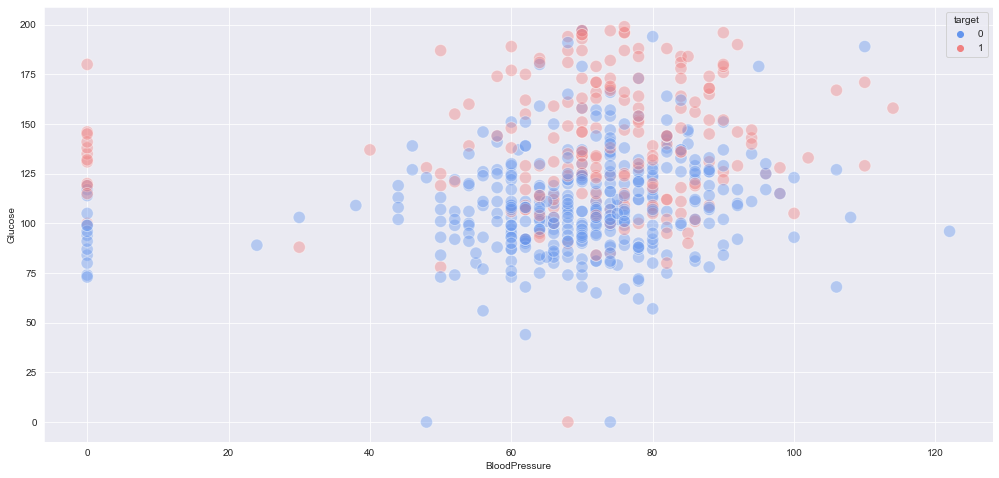

BloodPressure


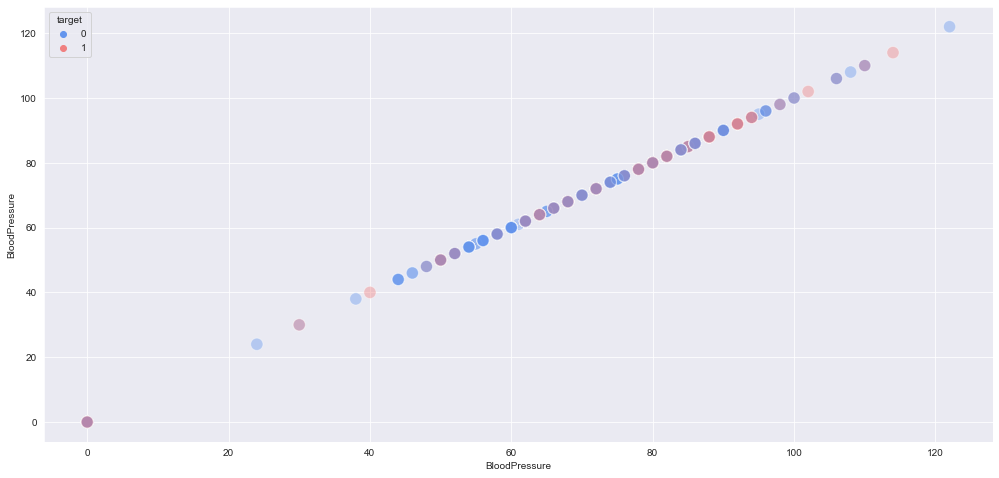

SkinThickness


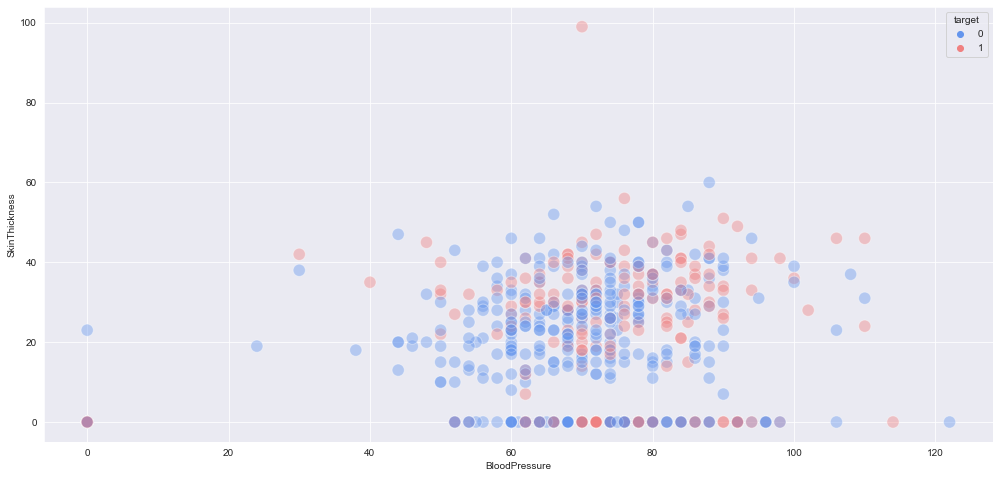

Insulin


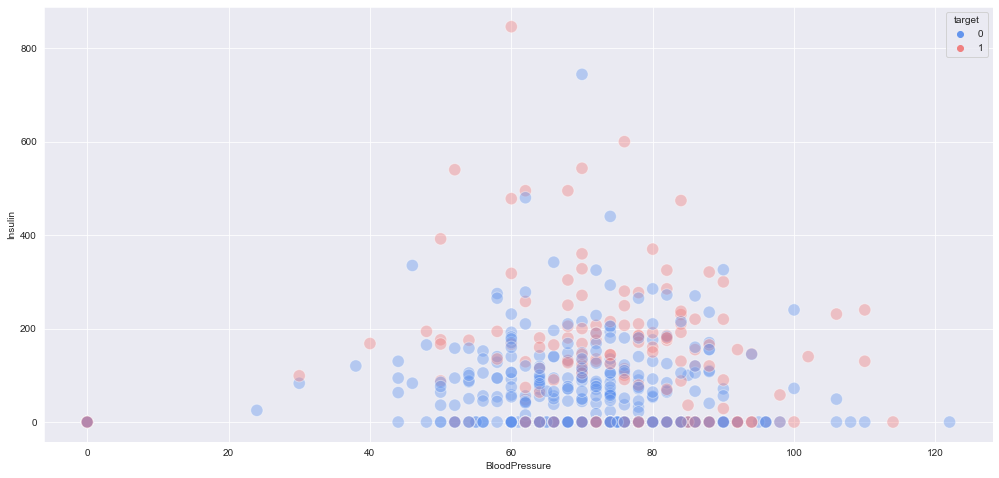

BMI


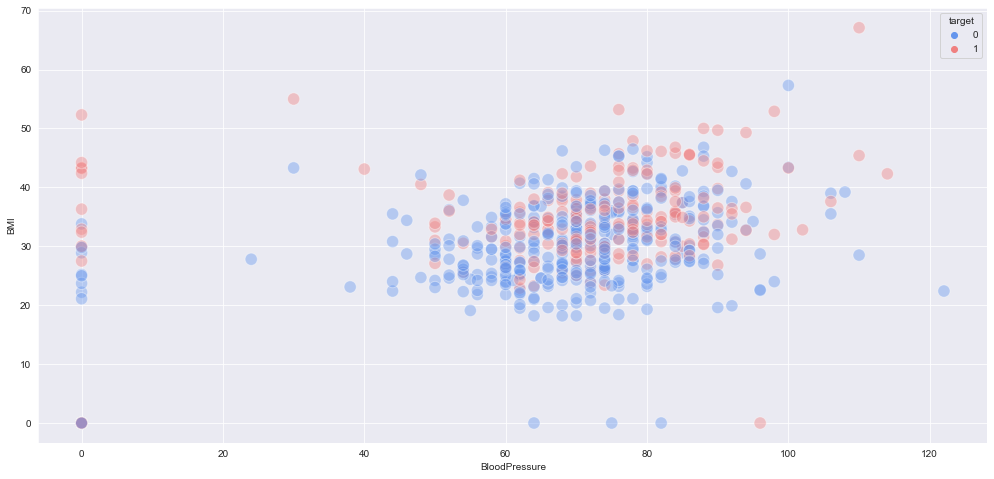

DiabetesPedigreeFunction


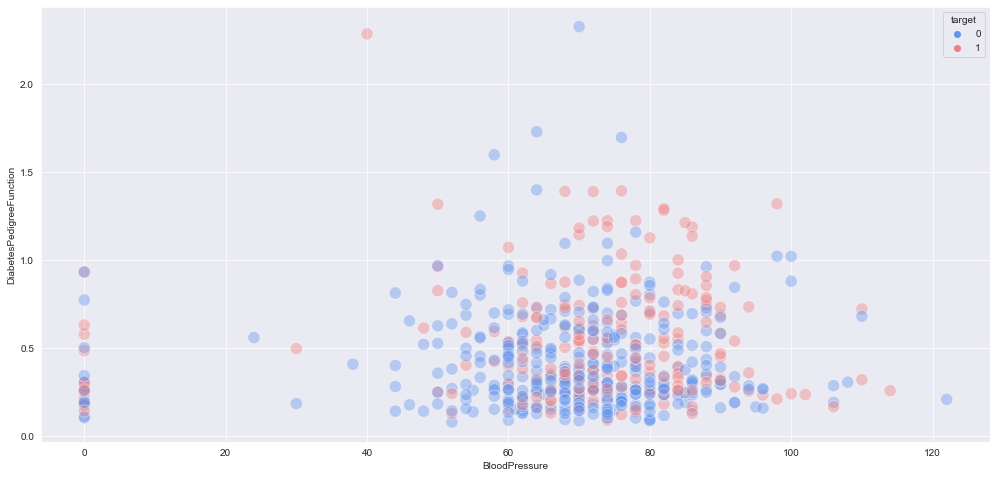

Age


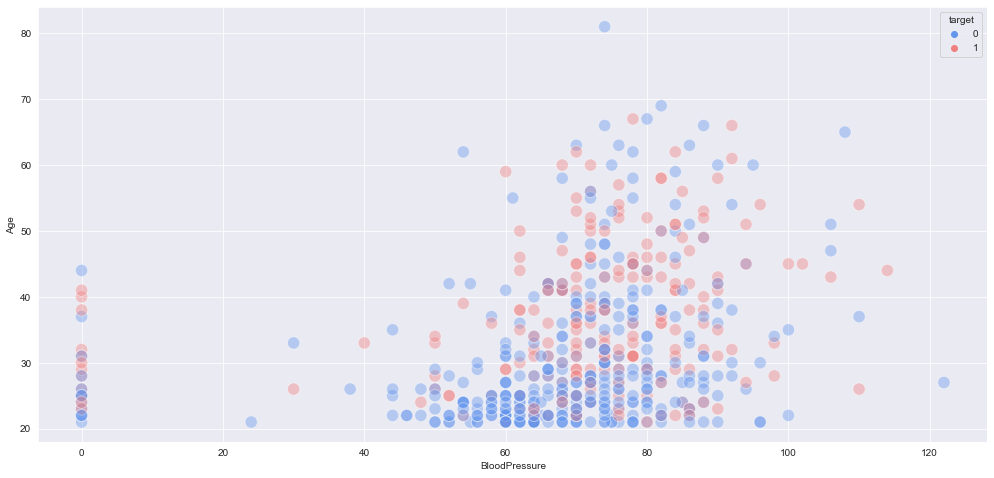

In [58]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='BloodPressure',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('BloodPressure')
    plt.ylabel(col)
    plt.show()

Glucose


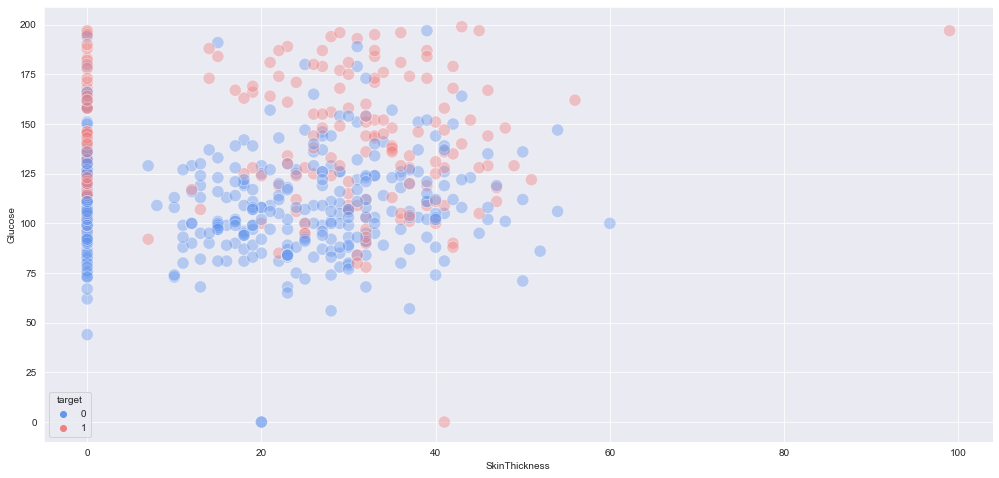

BloodPressure


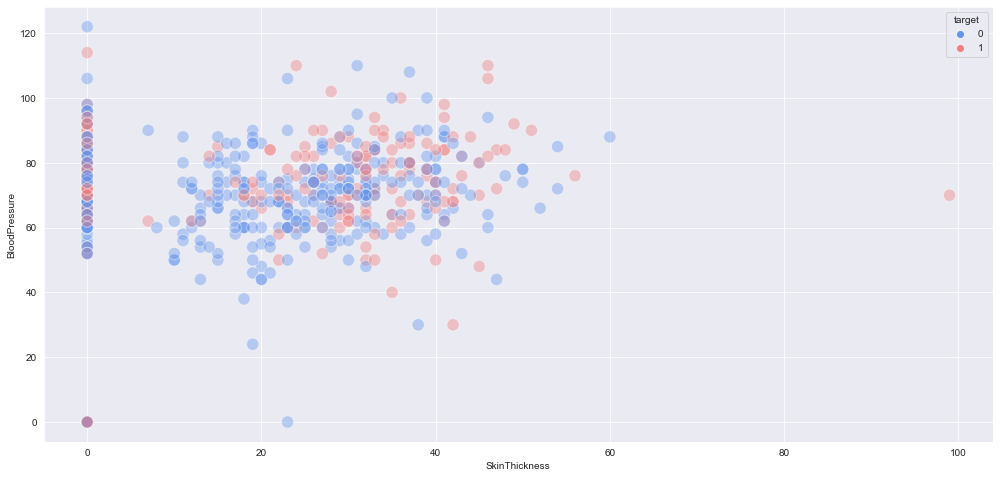

SkinThickness


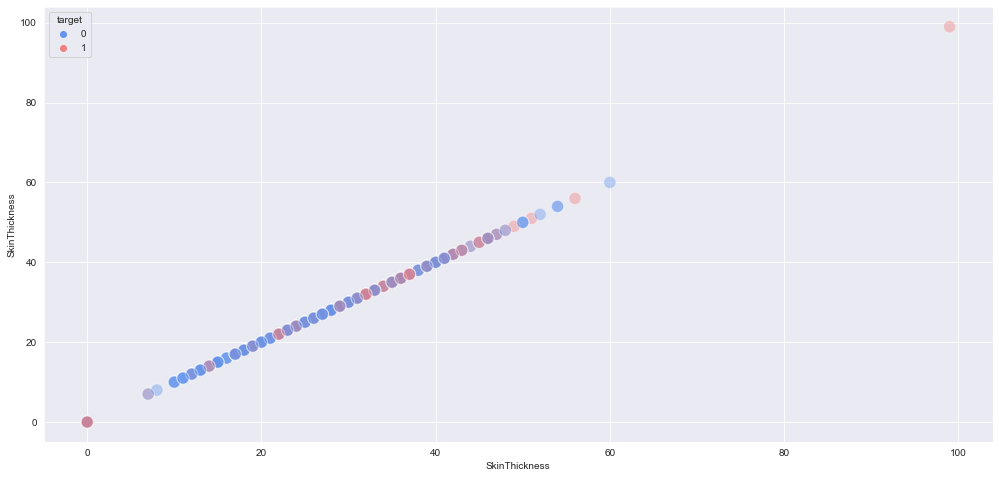

Insulin


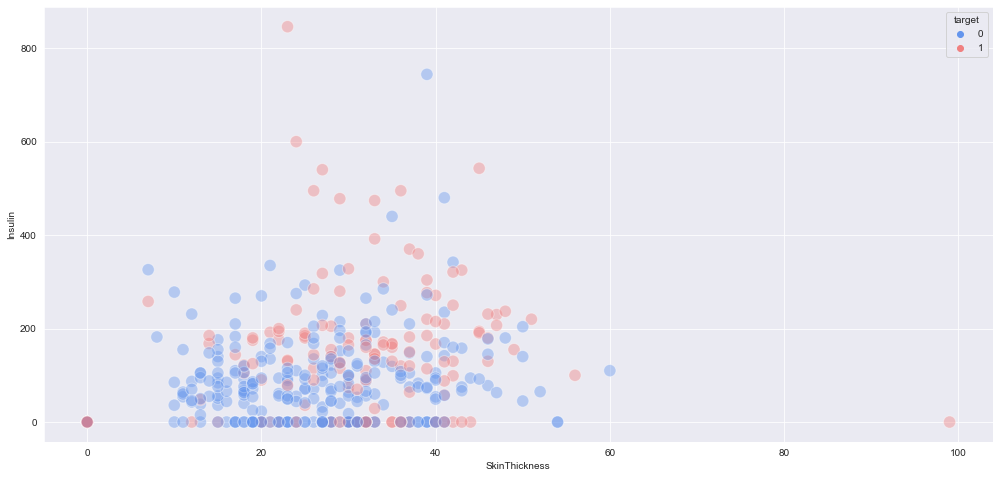

BMI


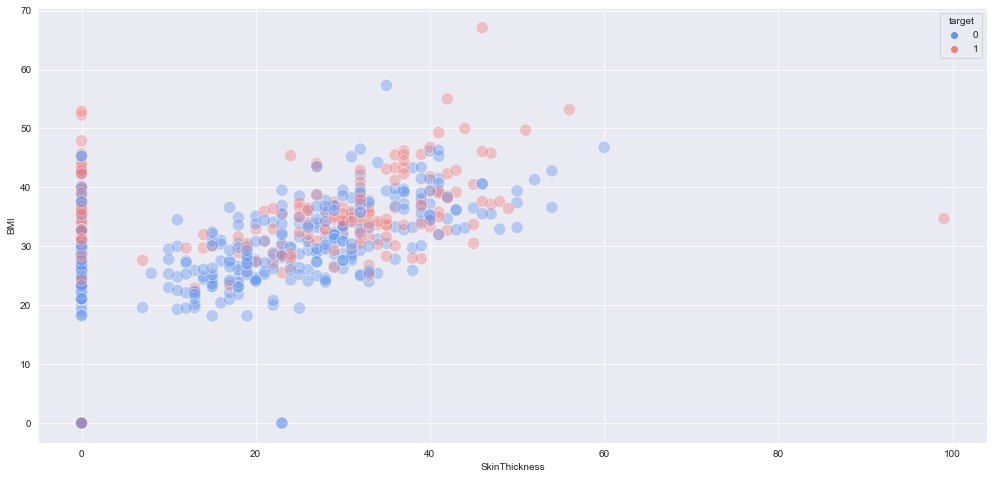

DiabetesPedigreeFunction


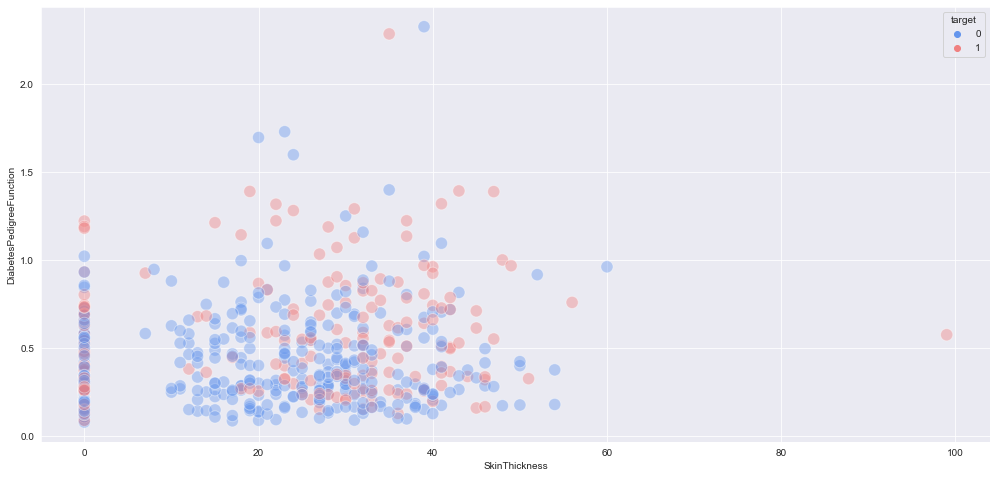

Age


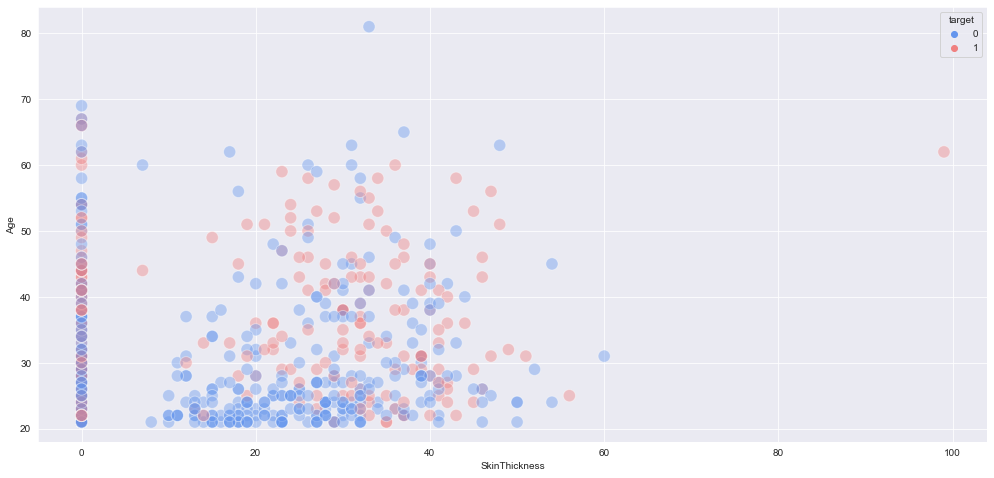

In [59]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='SkinThickness',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('SkinThickness')
    plt.ylabel(col)
    plt.show()

1. There is positive relationship between 'BMI' and 'SkinThickness'

Glucose


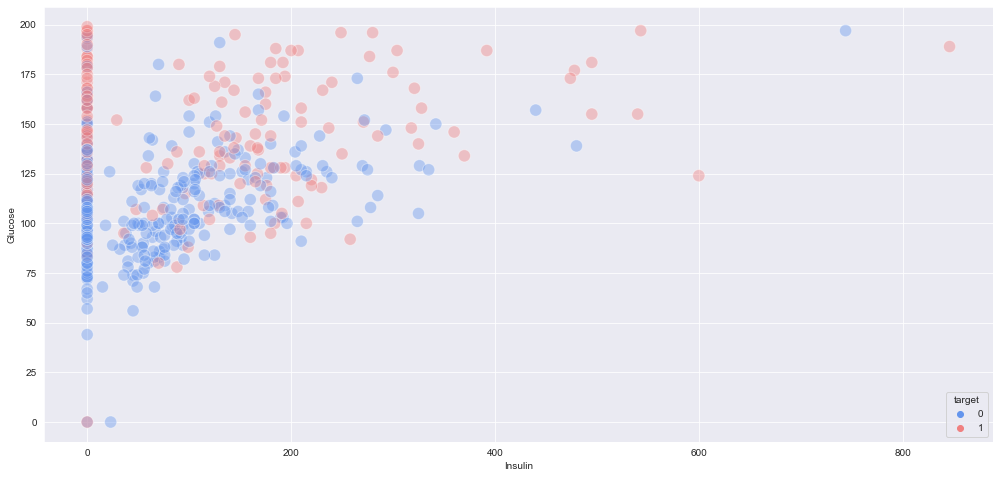

BloodPressure


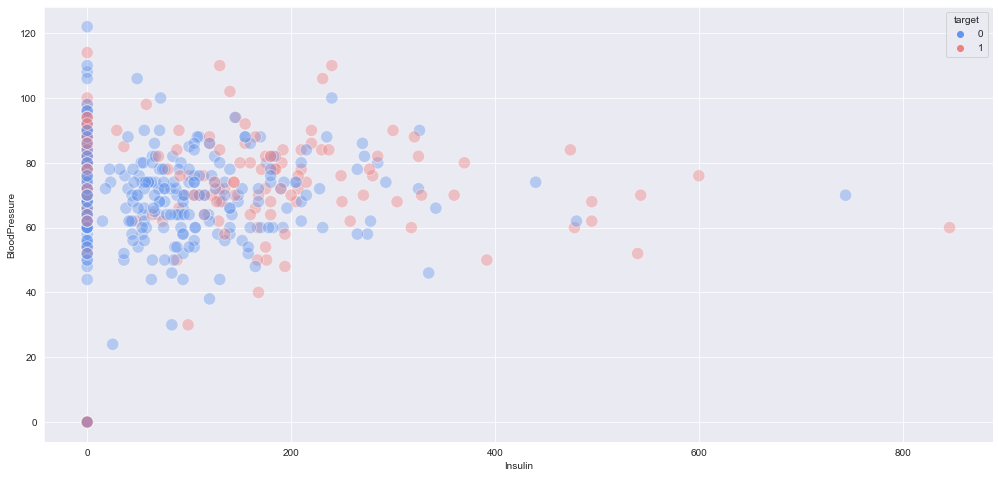

SkinThickness


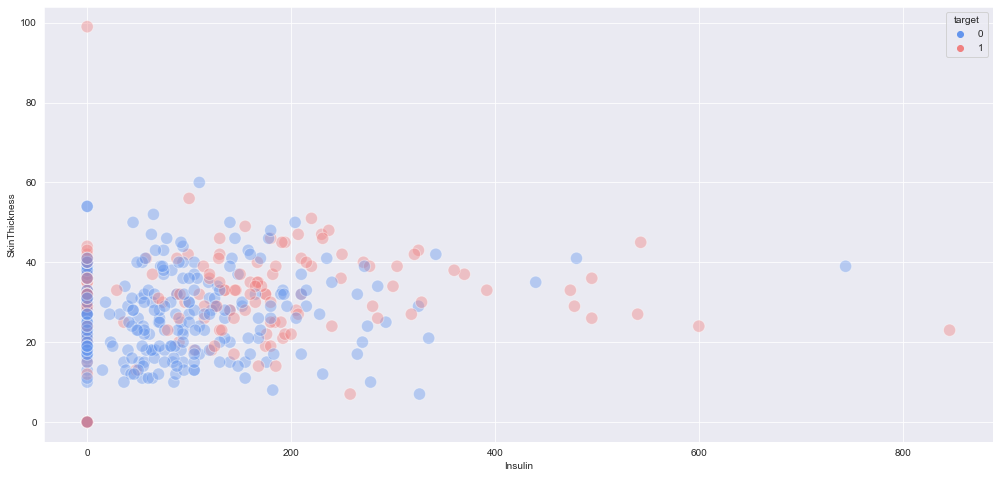

Insulin


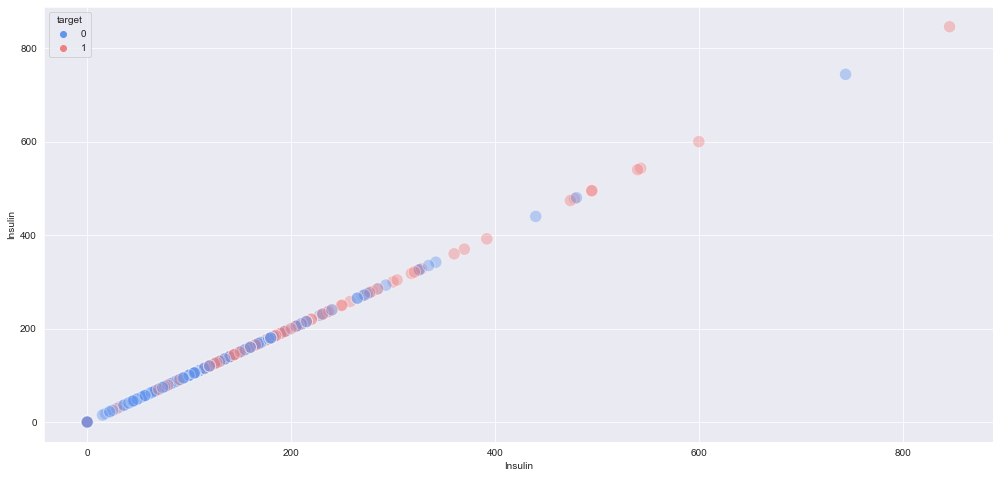

BMI


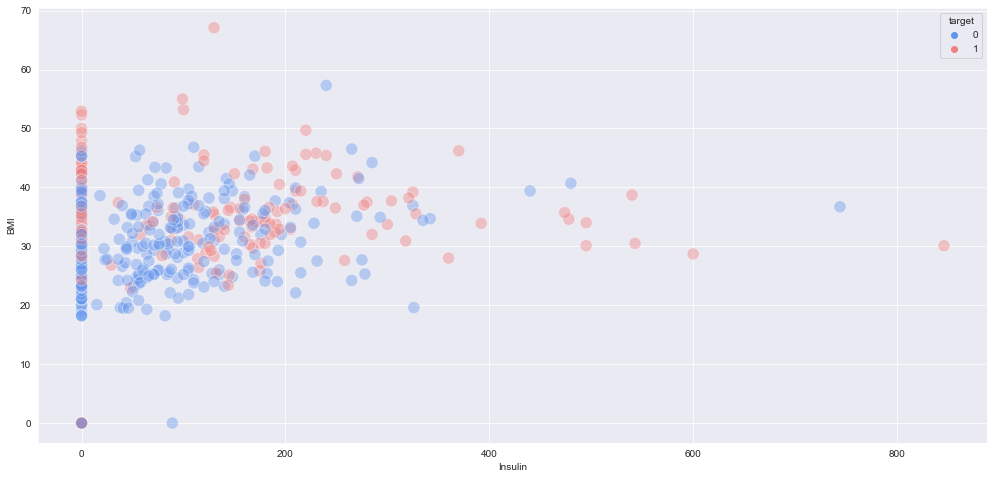

DiabetesPedigreeFunction


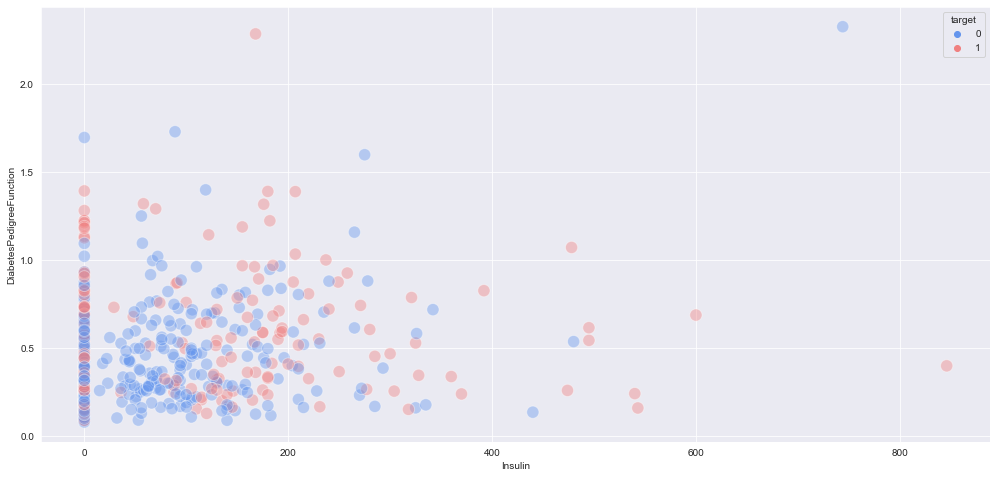

Age


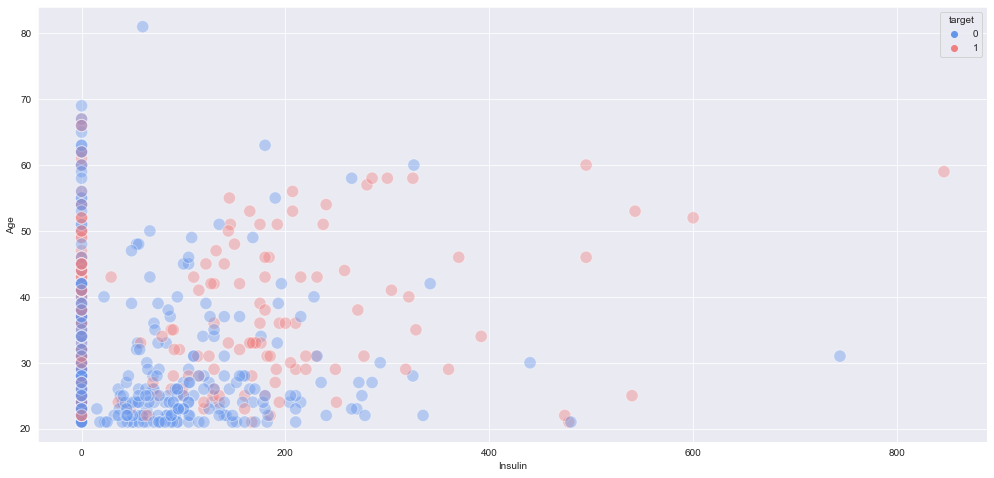

In [60]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Insulin',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Insulin')
    plt.ylabel(col)
    plt.show()

Glucose


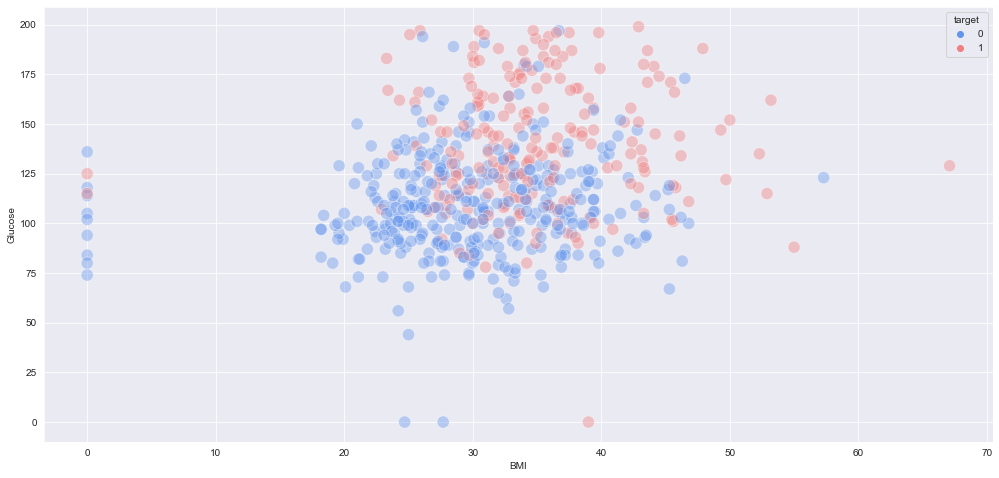

BloodPressure


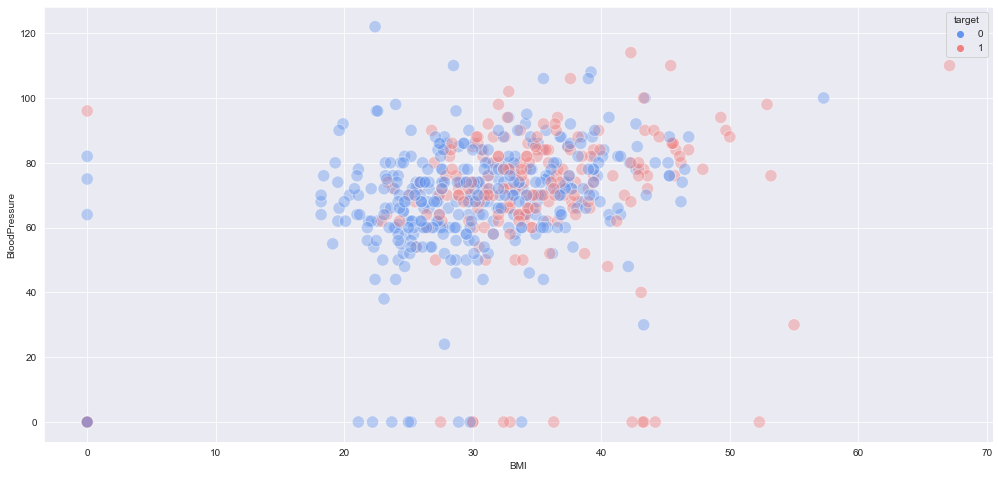

SkinThickness


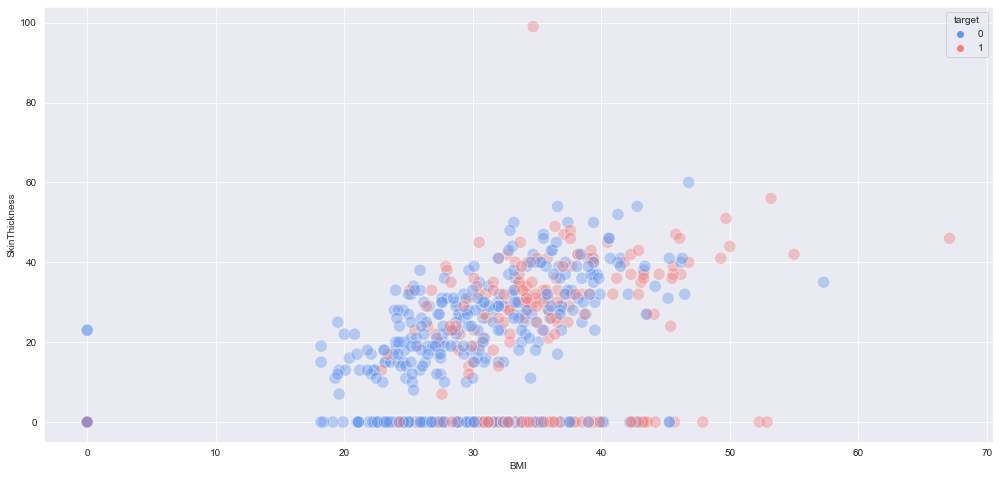

Insulin


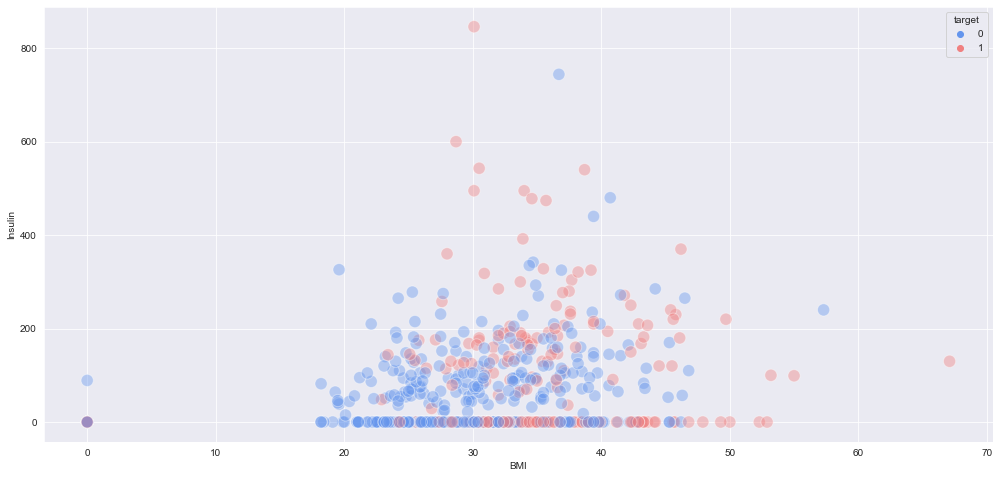

BMI


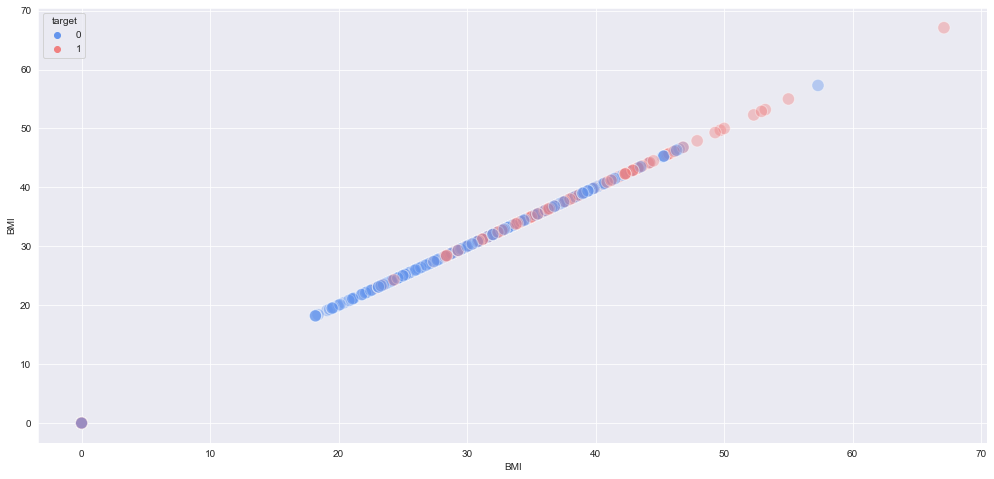

DiabetesPedigreeFunction


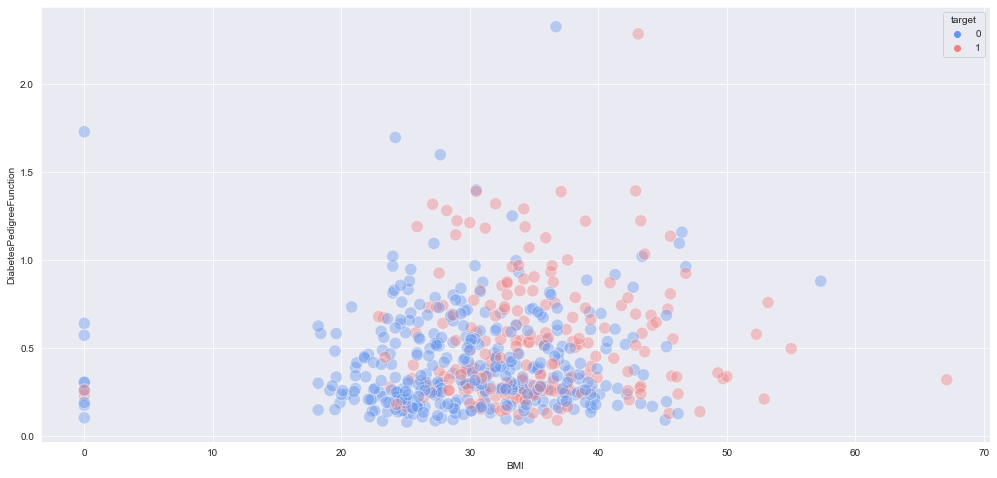

Age


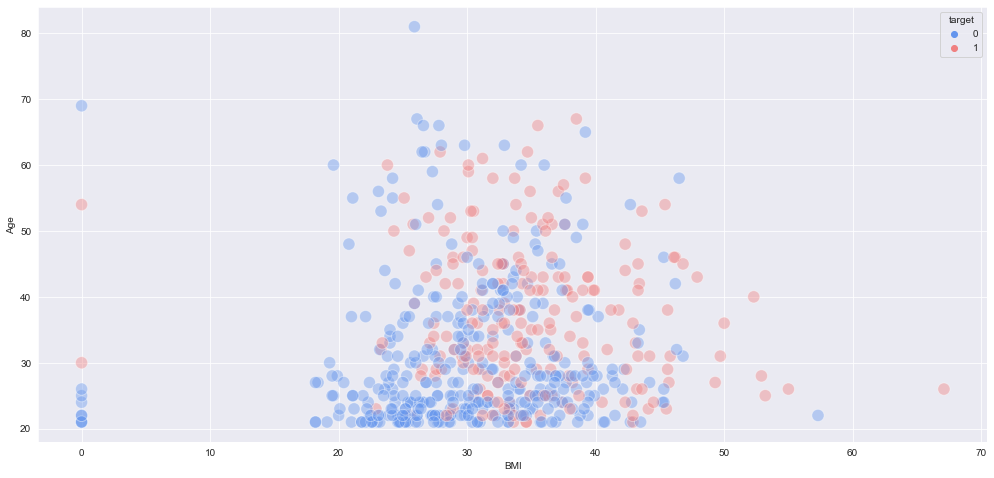

In [61]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='BMI',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('BMI')
    plt.ylabel(col)
    plt.show()

Glucose


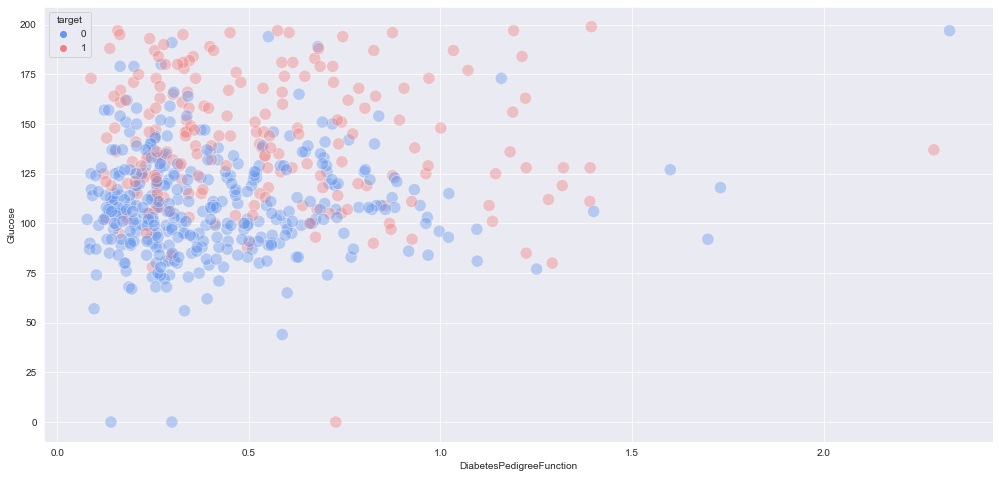

BloodPressure


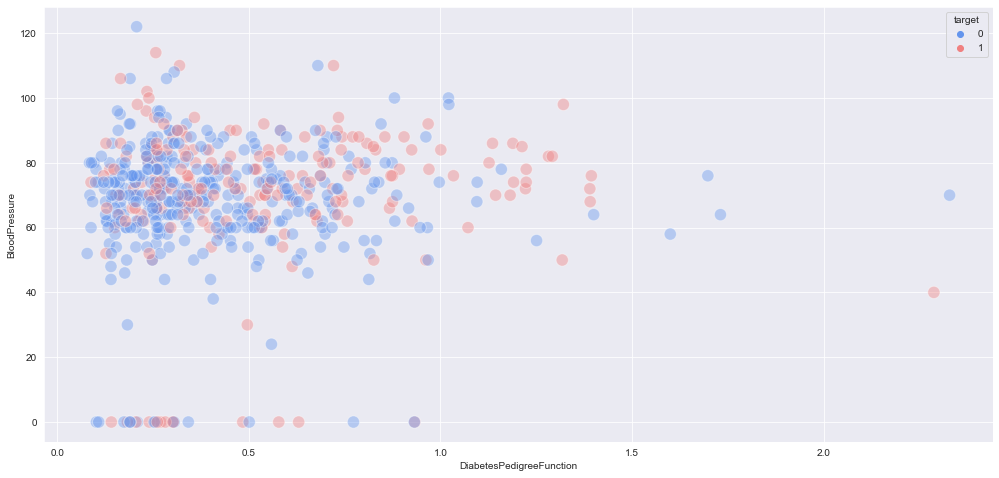

SkinThickness


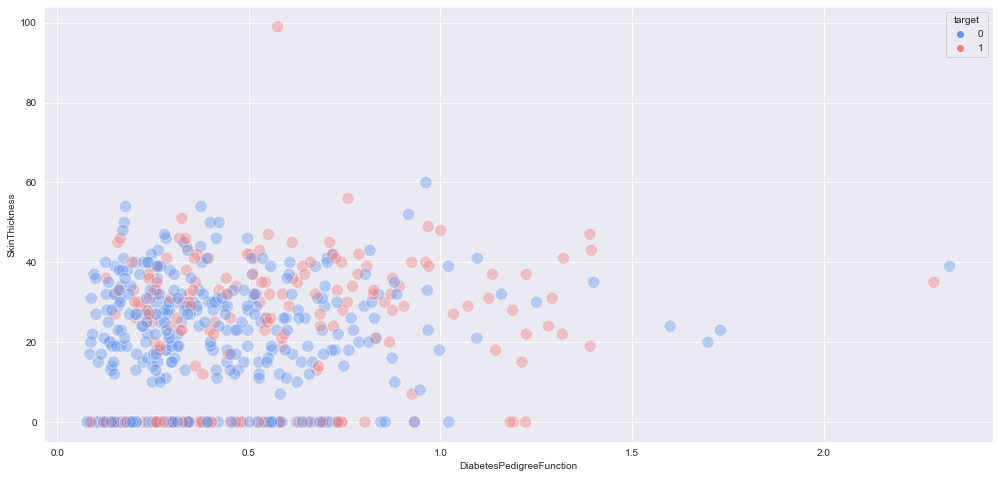

Insulin


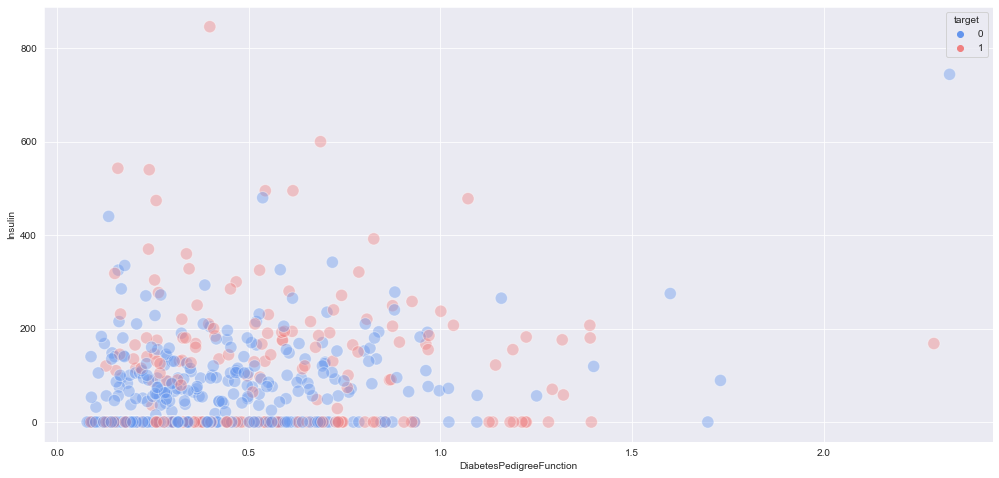

BMI


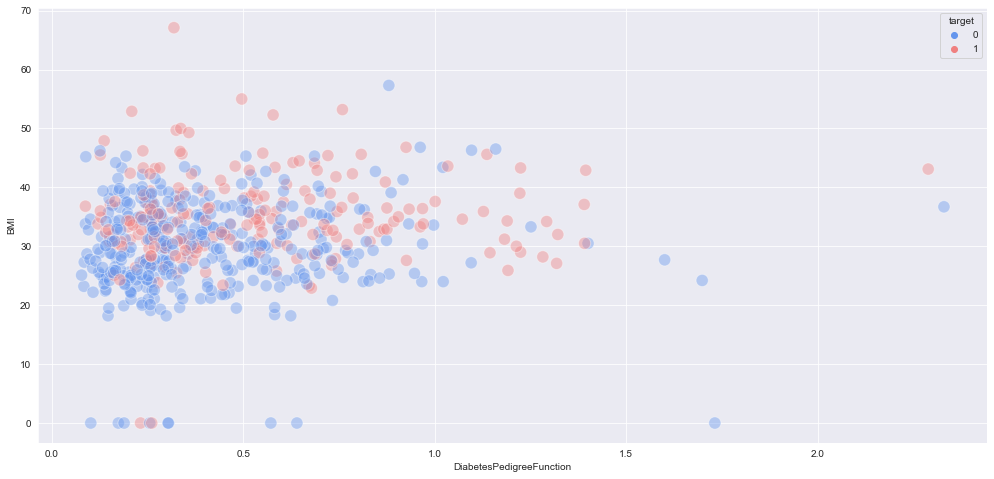

DiabetesPedigreeFunction


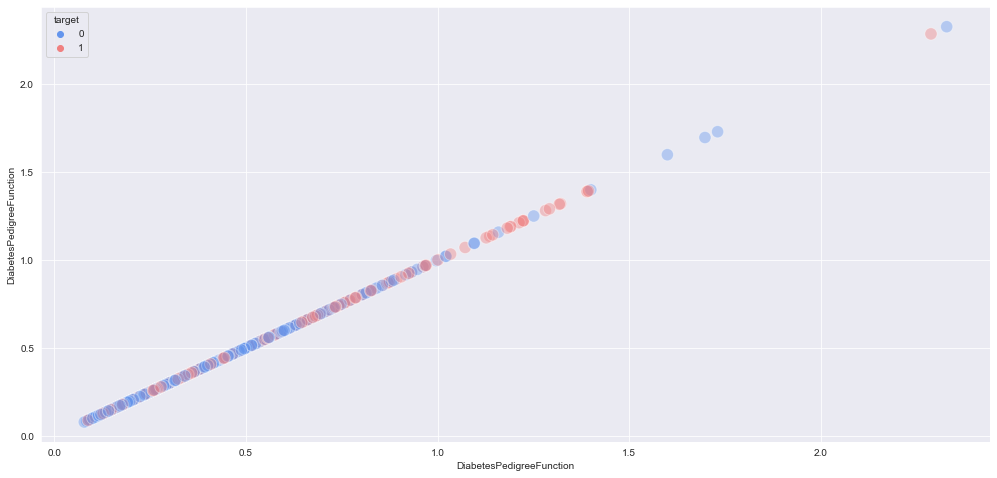

Age


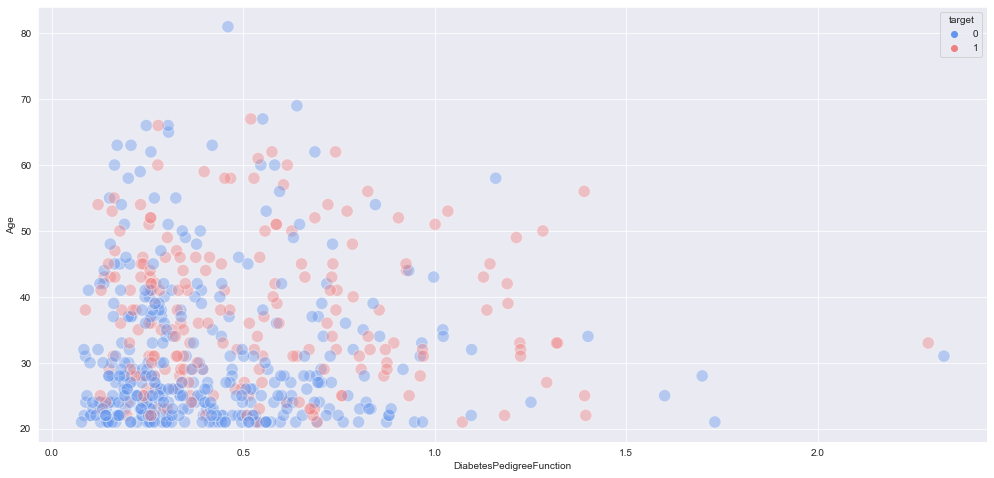

In [62]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='DiabetesPedigreeFunction',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('DiabetesPedigreeFunction')
    plt.ylabel(col)
    plt.show()

Glucose


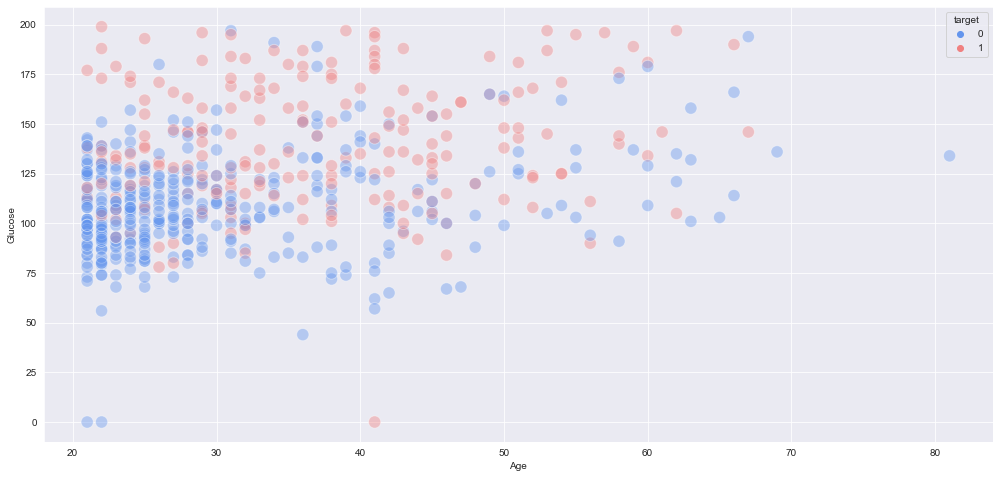

BloodPressure


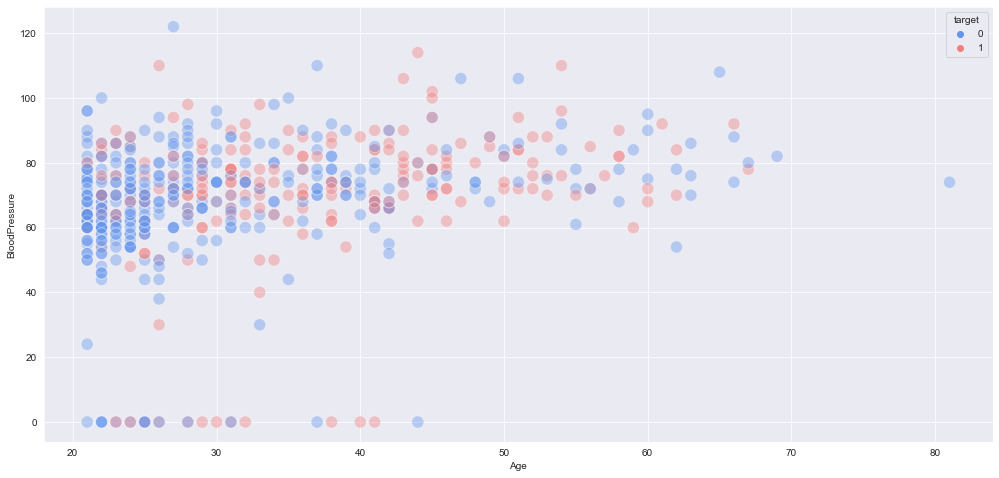

SkinThickness


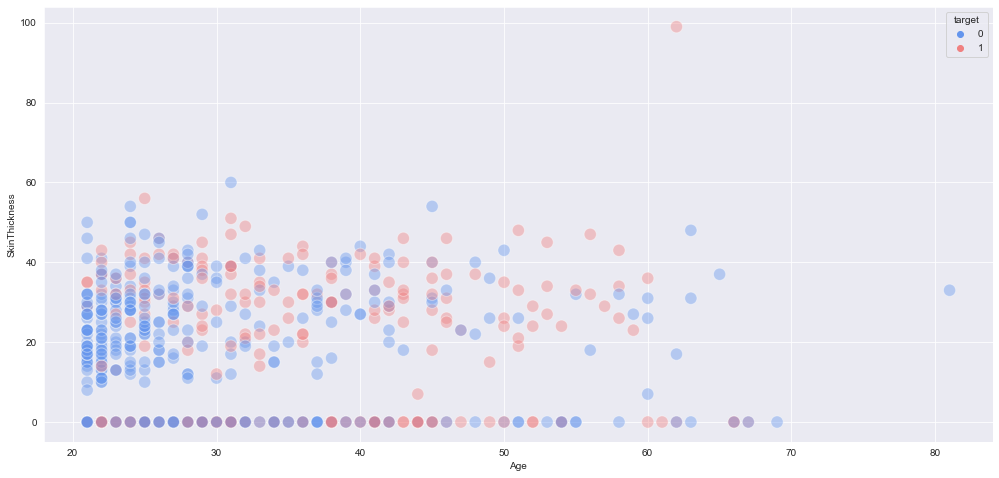

Insulin


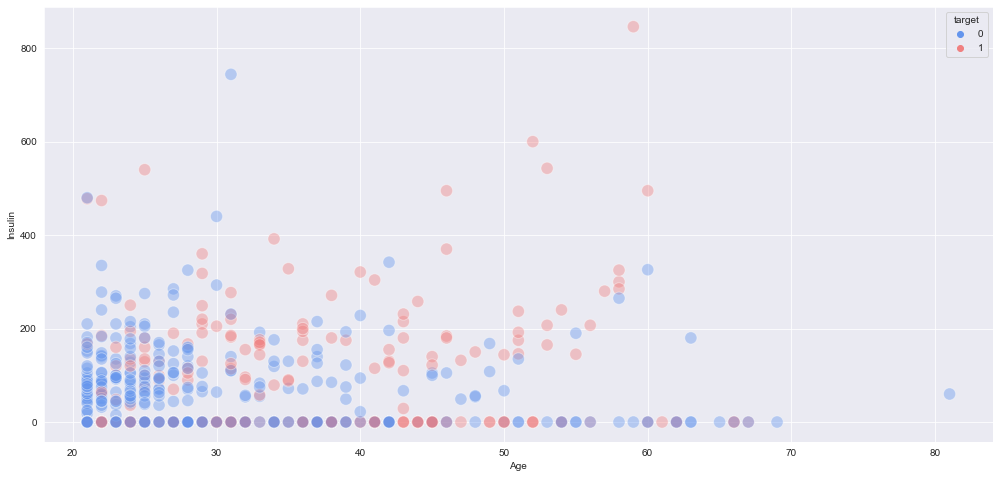

BMI


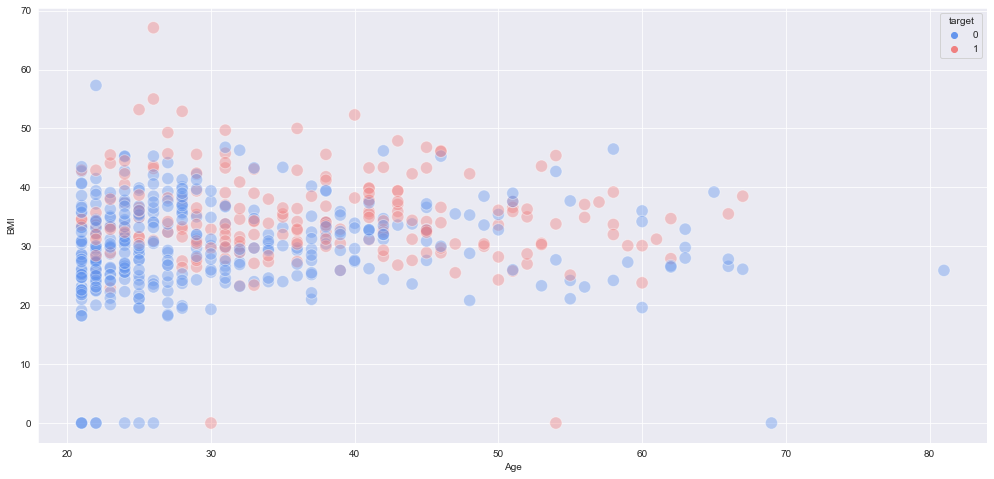

DiabetesPedigreeFunction


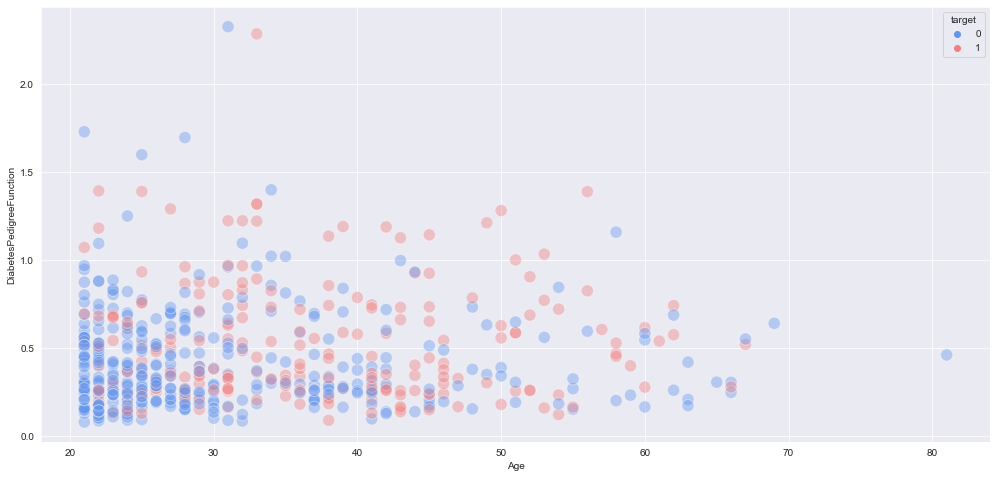

Age


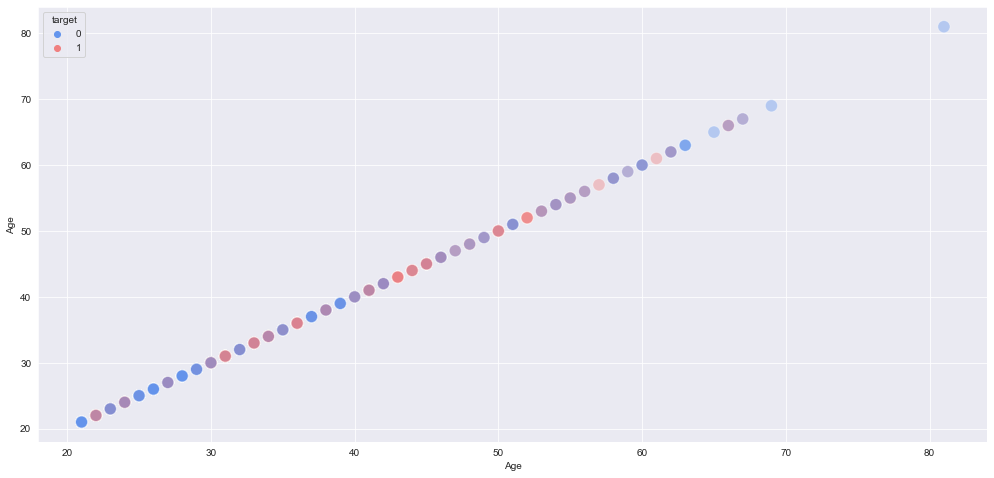

In [63]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Age',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Age')
    plt.ylabel(col)
    plt.show()

In [64]:
train_df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'target'],
      dtype='object')

In [65]:
fig = px.scatter_3d(train_df, x="Glucose", y="Insulin", z="BMI", color="target")
fig.show()

### Discrete_features

### Univariate/Bivariate analysis

In [66]:
train_df[discrete_features].nunique().sort_values(ascending=False)

Pregnancies    16
target          2
dtype: int64

In [67]:
discrete_features

['Pregnancies', 'target']

In [68]:
discrete_features = ['Pregnancies']

discrete_features

['Pregnancies']

Pregnancies


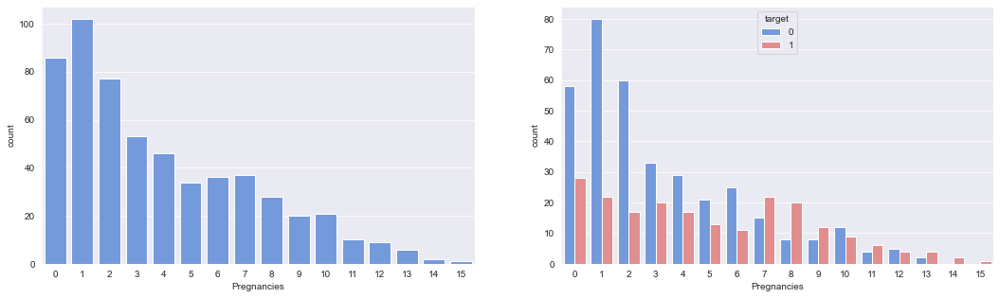

In [69]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=train_df, x=col,color='cornflowerblue',order=train_df['Pregnancies'].value_counts().sort_index().index)
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=train_df, x=col, hue="target",palette=['cornflowerblue','lightcoral'],order=train_df['Pregnancies'].value_counts().sort_index().index)
    plt.show()

Pregnancies


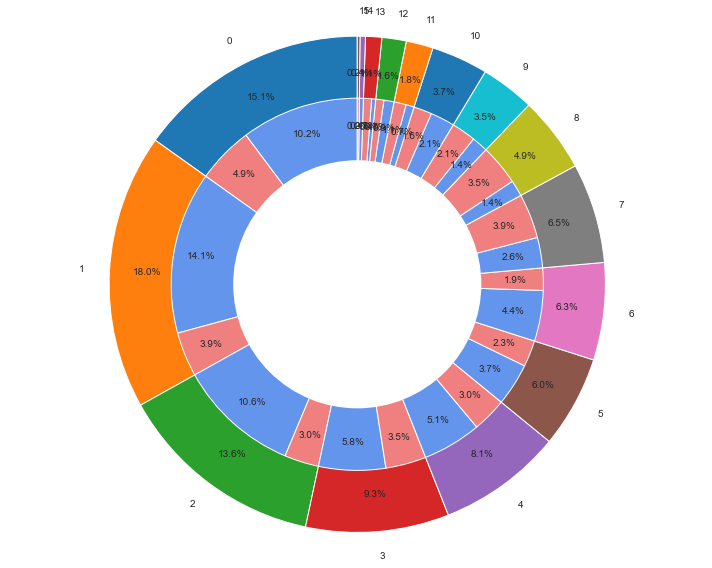

In [70]:
print('Pregnancies')
labels = train_df['Pregnancies'].value_counts().sort_index().index
sizes = train_df['Pregnancies'].value_counts().sort_index().values
labels_gender = [0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1]
sizes_gender = train_df.groupby(['Pregnancies','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

### Observation :

1. From above we can clearly observe that the chances of getting diabetic is more as the no.of pregencies increasing

In [71]:
discrete_features

['Pregnancies']

In [72]:
continuous_features

['Glucose',
 'BloodPressure',
 'SkinThickness',
 'Insulin',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age']

In [73]:
from num2words import num2words

In [74]:
data = train_df.copy()

In [75]:
data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
563,1,106,76,0,0,37.5,0.197,26,0
564,6,190,92,0,0,35.5,0.278,66,1
565,10,101,76,48,180,32.9,0.171,63,0
566,2,122,70,27,0,36.8,0.340,27,0


In [76]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568 entries, 0 to 567
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               568 non-null    int64  
 1   Glucose                   568 non-null    int64  
 2   BloodPressure             568 non-null    int64  
 3   SkinThickness             568 non-null    int64  
 4   Insulin                   568 non-null    int64  
 5   BMI                       568 non-null    float64
 6   DiabetesPedigreeFunction  568 non-null    float64
 7   Age                       568 non-null    int64  
 8   target                    568 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 40.1 KB


In [77]:
for col in discrete_features:
    data[col] = data[col].apply(lambda x: num2words(x))

In [78]:
data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,six,148,72,35,0,33.6,0.627,50,1
1,one,85,66,29,0,26.6,0.351,31,0
2,eight,183,64,0,0,23.3,0.672,32,1
3,one,89,66,23,94,28.1,0.167,21,0
4,zero,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
563,one,106,76,0,0,37.5,0.197,26,0
564,six,190,92,0,0,35.5,0.278,66,1
565,ten,101,76,48,180,32.9,0.171,63,0
566,two,122,70,27,0,36.8,0.340,27,0


In [79]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568 entries, 0 to 567
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               568 non-null    object 
 1   Glucose                   568 non-null    int64  
 2   BloodPressure             568 non-null    int64  
 3   SkinThickness             568 non-null    int64  
 4   Insulin                   568 non-null    int64  
 5   BMI                       568 non-null    float64
 6   DiabetesPedigreeFunction  568 non-null    float64
 7   Age                       568 non-null    int64  
 8   target                    568 non-null    int64  
dtypes: float64(2), int64(6), object(1)
memory usage: 40.1+ KB


In [80]:
discrete_features

['Pregnancies']

In [81]:
train_df[discrete_features].nunique()

Pregnancies    16
dtype: int64

In [82]:
data['Pregnancies'].unique()

array(['six', 'one', 'eight', 'zero', 'five', 'three', 'two', 'four',
       'ten', 'seven', 'eleven', 'nine', 'thirteen', 'fifteen', 'twelve',
       'fourteen'], dtype=object)

Glucose


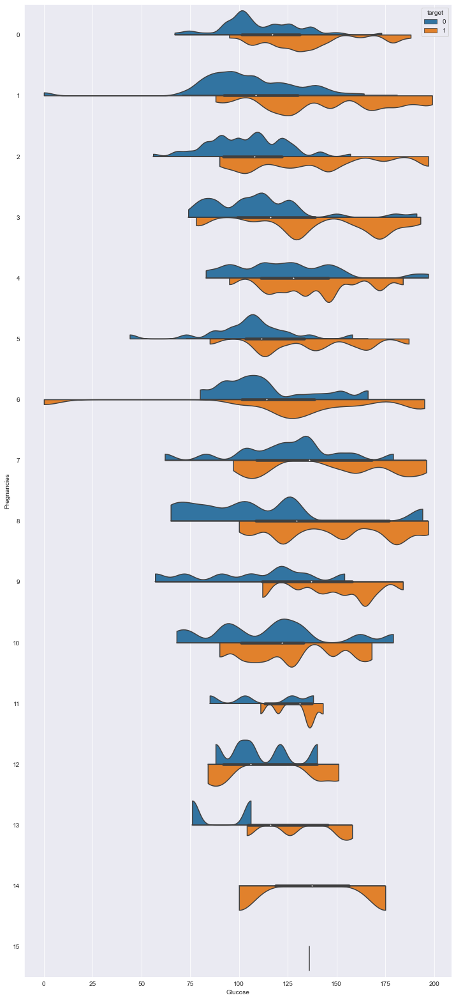

BloodPressure


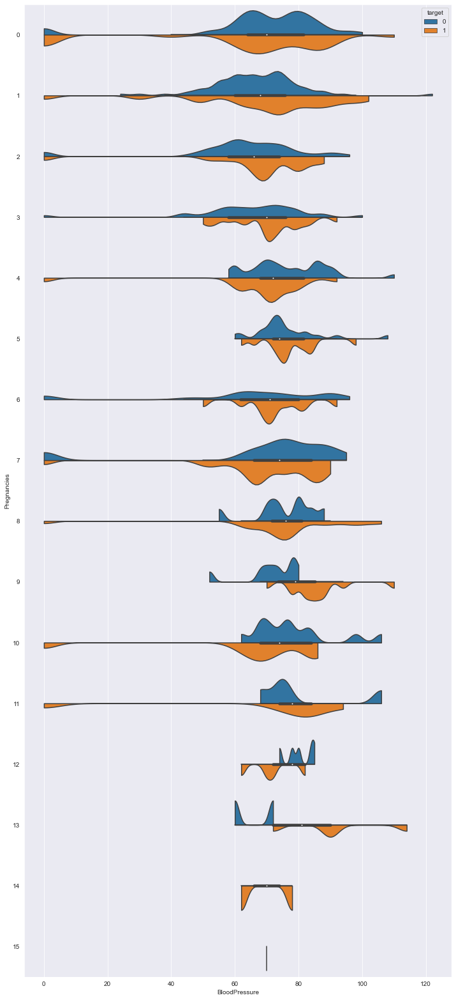

SkinThickness


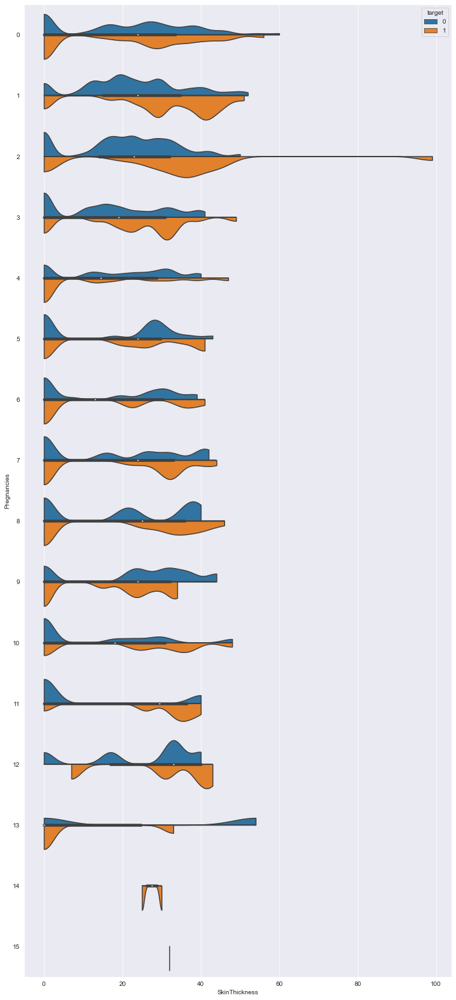

Insulin


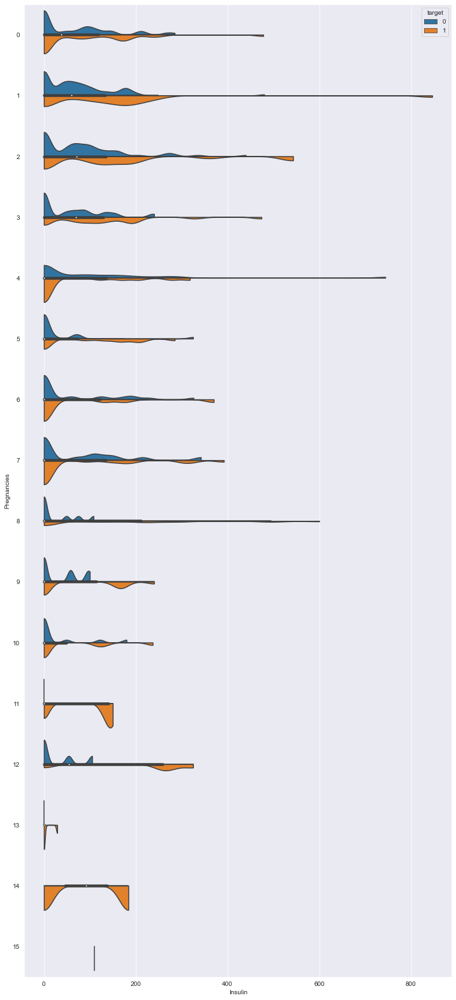

BMI


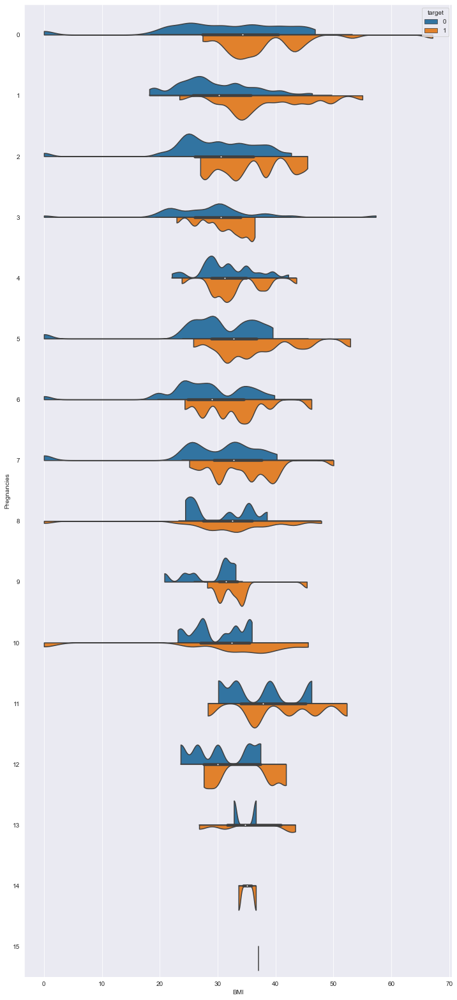

DiabetesPedigreeFunction


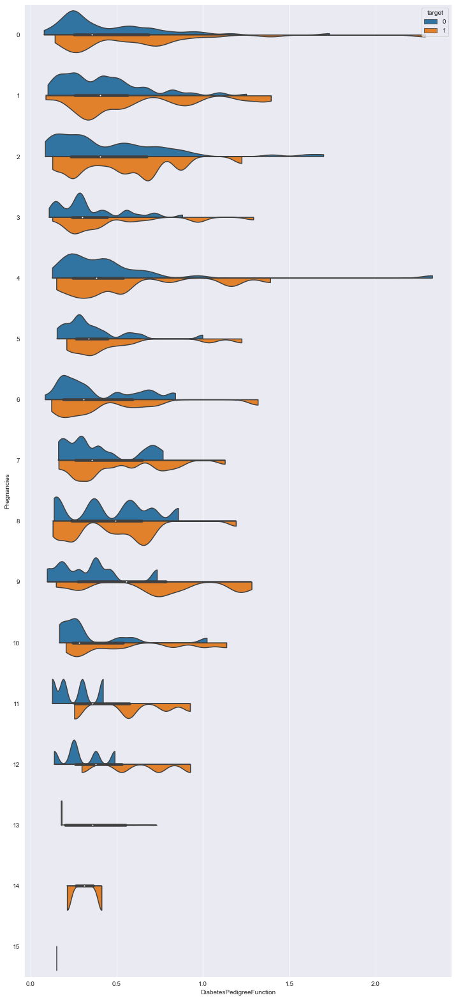

Age


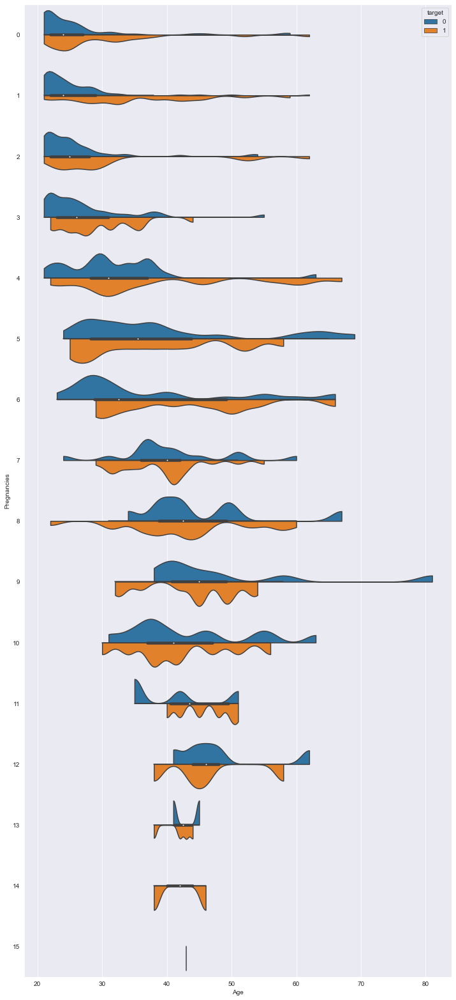

In [83]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,28))
    sns.violinplot(data=train_df, x=col, y="Pregnancies", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('Pregnancies')
    plt.show()

### Observation :

1. From above we can observe that as the no.of pregnencies increasing [Glucose,Insulin,BMI,DiabetesPedigreeFunction] values are more

In [84]:
numerical_features

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'target'],
      dtype='object')

In [85]:
categorical_features

Index([], dtype='object')

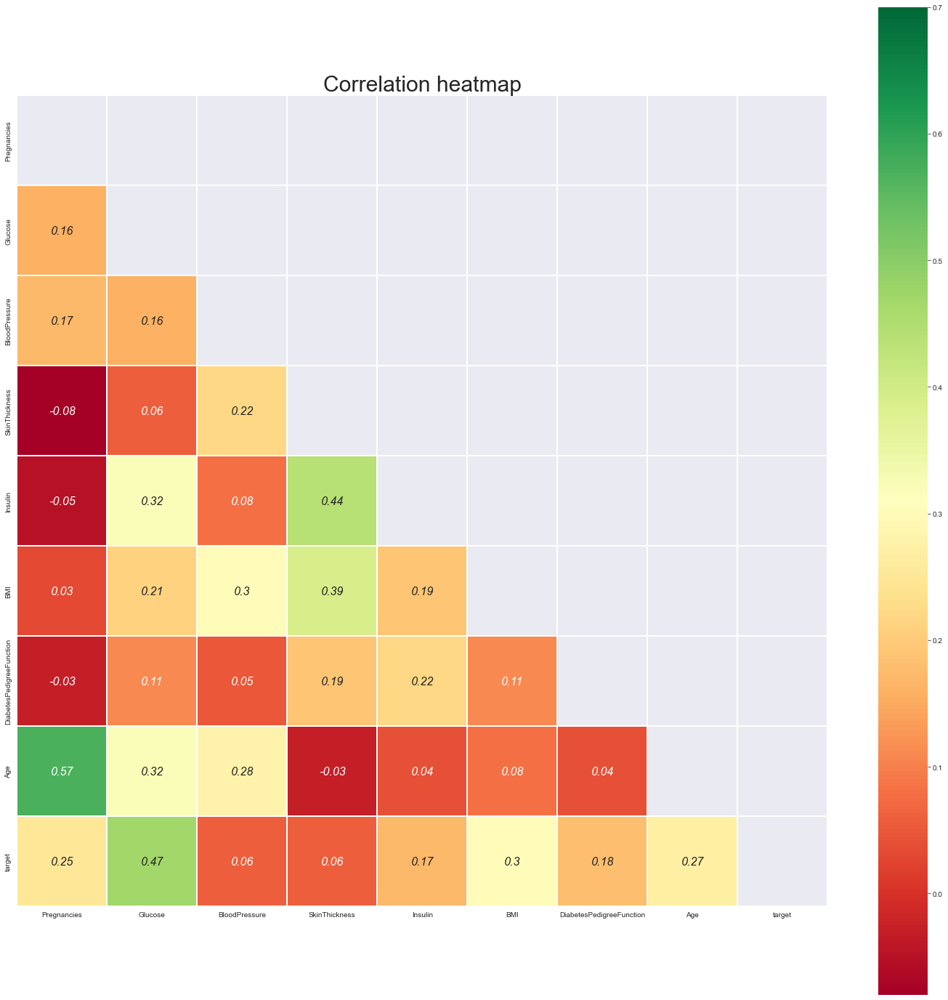

In [86]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(train_df[numerical_features].corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(train_df[numerical_features].corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

### Observation :

1. We can see there is positive correlation between 'Glucose' and 'target'
2. follwed by a moderate correlation with 'Age'  and 'BMI'

### Multicollinearity

4. there is clear positive correlation among ('Age','Pregnancies'),('SkinThickness','Insulin'),('BMI','SkinThickness')

#### We need to be very careful with this Multicollinearity when using 'Linear ML Models'

## Categorical_features

In [87]:
# No categorical features

In [96]:
train_df.niiofbid()

AttributeError: 'DataFrame' object has no attribute 'niiofbid'

In [88]:
train_df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
563,1,106,76,0,0,37.5,0.197,26,0
564,6,190,92,0,0,35.5,0.278,66,1
565,10,101,76,48,180,32.9,0.171,63,0
566,2,122,70,27,0,36.8,0.340,27,0


In [89]:
val_df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,0,146,82,0,0,40.5,1.781,44,0
1,13,153,88,37,140,40.6,1.174,39,0
2,4,154,62,31,284,32.8,0.237,23,0
3,2,101,58,35,90,21.8,0.155,22,0
4,3,148,66,25,0,32.5,0.256,22,0
...,...,...,...,...,...,...,...,...,...
95,3,83,58,31,18,34.3,0.336,25,0
96,7,136,90,0,0,29.9,0.210,50,0
97,5,147,75,0,0,29.9,0.434,28,0
98,1,153,82,42,485,40.6,0.687,23,0


In [90]:
test_df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,6,92,62,32,126,32.0,0.085,46,0
1,5,132,80,0,0,26.8,0.186,69,0
2,3,106,72,0,0,25.8,0.207,27,0
3,4,99,68,38,0,32.8,0.145,33,0
4,4,96,56,17,49,20.8,0.340,26,0
...,...,...,...,...,...,...,...,...,...
95,0,167,0,0,0,32.3,0.839,30,1
96,4,183,0,0,0,28.4,0.212,36,1
97,2,155,74,17,96,26.6,0.433,27,1
98,6,85,78,0,0,31.2,0.382,42,0


In [91]:
# writing the final df to a file

train_df.to_csv('../Data/Diabetics/train_df.csv',index=False)

In [92]:
# writing the final df to a file

val_df.to_csv('../Data/Diabetics/val_df.csv',index=False)

In [93]:
# writing the final df to a file

test_df.to_csv('../Data/Diabetics/test_df.csv',index=False)

# Feature Engineering

In [94]:
# Preprocessing imports
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import FunctionTransformer,QuantileTransformer,PowerTransformer
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,LabelEncoder
from sklearn.preprocessing import StandardScaler,RobustScaler,MinMaxScaler

# Models
from sklearn.linear_model import LogisticRegression,SGDClassifier,RidgeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB,BernoulliNB,CategoricalNB,MultinomialNB
from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier,IsolationForest,ExtraTreesClassifier,AdaBoostClassifier
from xgboost import XGBClassifier,XGBRFClassifier

# Cross-validation
from sklearn.model_selection import cross_val_score

# Hyperparameter tuning
from sklearn.model_selection import GridSearchCV

# Pipeline
from sklearn.pipeline import Pipeline,make_pipeline
from sklearn.compose import ColumnTransformer,TransformedTargetRegressor

# Metrics
from sklearn.metrics import accuracy_score,classification_report,precision_score,recall_score,f1_score,precision_recall_curve

from imblearn.over_sampling import SMOTE

# Visualize Pipeline
from sklearn import set_config

# PCA - for dimensionality reduction
from sklearn.decomposition import PCA

# to calculate VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# To calculate the Verinces of each feature
from sklearn.feature_selection import VarianceThreshold

# Mutual Information for classification - For Feature Selection
from sklearn.feature_selection import mutual_info_classif

In [95]:
train_df = pd.read_csv('../Data/Diabetics/train_df.csv')
X_train = train_df.drop('target',axis=1)
y_train = train_df['target']

In [96]:
val_df = pd.read_csv('../Data/Diabetics/val_df.csv')
X_val = val_df.drop('target',axis=1)
y_val = val_df['target']

In [97]:
test_df = pd.read_csv('../Data/Diabetics/test_df.csv')
X_test = test_df.drop('target',axis=1)
y_test = test_df['target']

In [98]:
train_df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
563,1,106,76,0,0,37.5,0.197,26,0
564,6,190,92,0,0,35.5,0.278,66,1
565,10,101,76,48,180,32.9,0.171,63,0
566,2,122,70,27,0,36.8,0.340,27,0


In [100]:
val_df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,0,146,82,0,0,40.5,1.781,44,0
1,13,153,88,37,140,40.6,1.174,39,0
2,4,154,62,31,284,32.8,0.237,23,0
3,2,101,58,35,90,21.8,0.155,22,0
4,3,148,66,25,0,32.5,0.256,22,0
...,...,...,...,...,...,...,...,...,...
95,3,83,58,31,18,34.3,0.336,25,0
96,7,136,90,0,0,29.9,0.210,50,0
97,5,147,75,0,0,29.9,0.434,28,0
98,1,153,82,42,485,40.6,0.687,23,0


In [99]:
test_df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,6,92,62,32,126,32.0,0.085,46,0
1,5,132,80,0,0,26.8,0.186,69,0
2,3,106,72,0,0,25.8,0.207,27,0
3,4,99,68,38,0,32.8,0.145,33,0
4,4,96,56,17,49,20.8,0.340,26,0
...,...,...,...,...,...,...,...,...,...
95,0,167,0,0,0,32.3,0.839,30,1
96,4,183,0,0,0,28.4,0.212,36,1
97,2,155,74,17,96,26.6,0.433,27,1
98,6,85,78,0,0,31.2,0.382,42,0


In [101]:
train_df['target'].value_counts(normalize=True)

0    0.633803
1    0.366197
Name: target, dtype: float64

In [102]:
numerical_features

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'target'],
      dtype='object')

In [103]:
numerical_features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age']
numerical_features

['Pregnancies',
 'Glucose',
 'BloodPressure',
 'SkinThickness',
 'Insulin',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age']

In [104]:
len(numerical_features)

8

In [105]:
len(categorical_features)

0

### Building preprocessing pipeline

In [106]:
numerical_features

['Pregnancies',
 'Glucose',
 'BloodPressure',
 'SkinThickness',
 'Insulin',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age']

In [107]:
categorical_features

Index([], dtype='object')

In [108]:
numeric_processor=Pipeline([("imputation_mean",SimpleImputer(strategy='median',add_indicator=True)),
                           ("quantiletransformer",QuantileTransformer(output_distribution='normal'))])

categorical_processor=Pipeline([("imputation_consatnt",SimpleImputer(fill_value="missing",strategy="constant")),
                                ("onehotencoder",OneHotEncoder(handle_unknown='ignore',sparse_output=False,min_frequency=0.01,max_categories=15))])

preprocessor=ColumnTransformer([("numeric_processor",numeric_processor,numerical_features),
                               ("categorical_processor",categorical_processor,categorical_features)])

final_pipe=Pipeline([("preprocessor",preprocessor),
                     ("scaler",RobustScaler())])

In [109]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['Pregnancies', 'Glucose',
                                                   'BloodPressure',
                                                   'SkinThickness', 'Insulin',
                                                   'BMI',
                                                   'DiabetesPedigreeFunction',
                                                   'Age']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  Index([], dtype='object'))])),
                ('scaler', RobustScaler())])

In [110]:
X_train

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
563,1,106,76,0,0,37.5,0.197,26
564,6,190,92,0,0,35.5,0.278,66
565,10,101,76,48,180,32.9,0.171,63
566,2,122,70,27,0,36.8,0.340,27


In [111]:
y_train

0      1
1      0
2      1
3      0
4      1
      ..
563    0
564    1
565    0
566    0
567    0
Name: target, Length: 568, dtype: int64

In [112]:
X_train_FE = pd.DataFrame(final_pipe.fit_transform(X_train),columns=final_pipe.get_feature_names_out(X_train.columns))

In [113]:
X_train_FE

,numeric_processor__Pregnancies,numeric_processor__Glucose,numeric_processor__BloodPressure,numeric_processor__SkinThickness,numeric_processor__Insulin,numeric_processor__BMI,numeric_processor__DiabetesPedigreeFunction,numeric_processor__Age
0,0.443810,0.683836,0.000000,0.144495,-0.883052,0.182600,0.534971,0.973951
1,-0.556190,-0.993572,-0.343339,0.062072,-0.883052,-0.545645,-0.012271,0.116229
2,0.774672,1.275808,-0.441183,-0.892868,-0.883052,-0.984061,0.600919,0.179416
3,-0.556190,-0.870685,-0.343339,0.000000,0.070488,-0.375490,-0.904283,-3.940360
4,-3.948347,0.474967,-1.169001,0.144495,0.162889,1.074856,2.158664,0.228002
...,...,...,...,...,...,...,...,...
563,-0.556190,-0.301656,0.248423,-0.892868,-0.883052,0.611513,-0.730036,-0.237773
564,0.443810,1.488137,1.121479,-0.892868,-0.883052,0.396653,-0.268298,1.842571
565,1.100514,-0.457286,0.248423,0.345896,0.181089,0.108794,-0.883948,1.641811
566,-0.218952,0.113293,-0.124882,0.037822,-0.883052,0.542109,-0.049936,-0.160984


In [114]:
y_train.value_counts()

0    360
1    208
Name: target, dtype: int64

In [115]:
X_val

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0,146,82,0,0,40.5,1.781,44
1,13,153,88,37,140,40.6,1.174,39
2,4,154,62,31,284,32.8,0.237,23
3,2,101,58,35,90,21.8,0.155,22
4,3,148,66,25,0,32.5,0.256,22
...,...,...,...,...,...,...,...,...
95,3,83,58,31,18,34.3,0.336,25
96,7,136,90,0,0,29.9,0.210,50
97,5,147,75,0,0,29.9,0.434,28
98,1,153,82,42,485,40.6,0.687,23


In [116]:
y_val

0     0
1     0
2     0
3     0
4     0
     ..
95    0
96    0
97    0
98    0
99    0
Name: target, Length: 100, dtype: int64

In [117]:
X_val_FE = pd.DataFrame(final_pipe.transform(X_val),columns=final_pipe.get_feature_names_out(X_val.columns))

In [118]:
X_val_FE

,numeric_processor__Pregnancies,numeric_processor__Glucose,numeric_processor__BloodPressure,numeric_processor__SkinThickness,numeric_processor__Insulin,numeric_processor__BMI,numeric_processor__DiabetesPedigreeFunction,numeric_processor__Age
0,-3.948347,0.639219,0.554075,-0.892868,-0.883052,0.891165,2.004651,0.734466
1,1.738997,0.755626,0.881848,0.168597,0.129160,0.901507,1.331871,0.492379
2,0.167181,0.766847,-0.541617,0.089931,0.285555,0.087240,-0.538735,-0.617023
3,-0.218952,-0.457286,-0.770802,0.144495,0.063184,-1.179534,-1.023741,-0.831398
4,0.000000,0.683836,-0.343339,0.017818,-0.883052,0.060819,-0.433221,-0.831398
...,...,...,...,...,...,...,...,...
95,0.000000,-1.090805,-0.770802,0.089931,-0.008073,0.275926,-0.067989,-0.337578
96,0.602474,0.446476,1.016560,-0.892868,-0.883052,-0.205806,-0.633439,0.973951
97,0.309170,0.666210,0.193663,-0.892868,-0.883052,-0.205806,0.152424,-0.079140
98,-0.556190,0.755626,0.554075,0.256697,0.384409,0.901507,0.642875,-0.617023


In [119]:
X_test

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,92,62,32,126,32.0,0.085,46
1,5,132,80,0,0,26.8,0.186,69
2,3,106,72,0,0,25.8,0.207,27
3,4,99,68,38,0,32.8,0.145,33
4,4,96,56,17,49,20.8,0.340,26
...,...,...,...,...,...,...,...,...
95,0,167,0,0,0,32.3,0.839,30
96,4,183,0,0,0,28.4,0.212,36
97,2,155,74,17,96,26.6,0.433,27
98,6,85,78,0,0,31.2,0.382,42


In [120]:
y_test

0     0
1     0
2     0
3     0
4     0
     ..
95    1
96    1
97    1
98    0
99    0
Name: target, Length: 100, dtype: int64

In [121]:
X_test_FE = pd.DataFrame(final_pipe.transform(X_test),columns=final_pipe.get_feature_names_out(X_test.columns))

In [122]:
X_test_FE

,numeric_processor__Pregnancies,numeric_processor__Glucose,numeric_processor__BloodPressure,numeric_processor__SkinThickness,numeric_processor__Insulin,numeric_processor__BMI,numeric_processor__DiabetesPedigreeFunction,numeric_processor__Age
0,0.443810,-0.755932,-0.541617,0.107132,0.110369,0.009847,-1.994986,0.848458
1,0.309170,0.370201,0.458383,-0.892868,-0.883052,-0.526626,-0.792435,2.226861
2,0.000000,-0.301656,0.000000,-0.892868,-0.883052,-0.649104,-0.651706,-0.160984
3,0.167181,-0.553113,-0.249585,0.180338,-0.883052,0.087240,-1.125159,0.228002
4,0.167181,-0.627505,-0.824400,-0.052788,0.009577,-1.274102,-0.049936,-0.237773
...,...,...,...,...,...,...,...,...
95,-3.948347,0.972865,-3.692650,-0.892868,-0.883052,0.034486,0.938141,0.055450
96,0.167181,1.275808,-3.692650,-0.892868,-0.883052,-0.355223,-0.630302,0.342879
97,-0.218952,0.784002,0.119450,-0.052788,0.075430,-0.545645,0.151588,-0.160984
98,0.443810,-0.993572,0.349179,-0.892868,-0.883052,-0.052542,0.048300,0.644288


In [123]:
models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [125]:
results = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results = results.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.80      0.87      0.83       360
           1       0.73      0.62      0.67       208

    accuracy                           0.77       568
   macro avg       0.76      0.74      0.75       568
weighted avg       0.77      0.77      0.77       568

              precision    recall  f1-score   support

           0       0.86      0.80      0.83        71
           1       0.59      0.69      0.63        29

    accuracy                           0.77       100
   macro avg       0.73      0.75      0.73       100
weighted avg       0.78      0.77      0.77       100

train_score :  0.7746478873239436
val_score :  0.77
RidgeClassifier
              precision    recall  f1-score   support

           0       0.80      0.88      0.84       360
           1       0.75      0.62      0.68       208

    accuracy                           0.78       568
   macro avg       0.77      0.75      0.

XGBClassifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       360
           1       1.00      1.00      1.00       208

    accuracy                           1.00       568
   macro avg       1.00      1.00      1.00       568
weighted avg       1.00      1.00      1.00       568

              precision    recall  f1-score   support

           0       0.81      0.70      0.75        71
           1       0.45      0.59      0.51        29

    accuracy                           0.67       100
   macro avg       0.63      0.65      0.63       100
weighted avg       0.70      0.67      0.68       100

train_score :  1.0
val_score :  0.67


In [126]:
results.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.741855,0.774648,0.761596,0.741026,0.748227,0.770000
1,RidgeClassifier,0.742196,0.783451,0.773513,0.747970,0.756489,0.770000
2,SGDClassifier,0.719222,0.744718,0.724846,0.722489,0.723601,0.750000
3,SVC,0.718912,0.804577,0.799506,0.769712,0.779663,0.740000
4,GaussianNB,0.736869,0.760563,0.748101,0.763408,0.751233,0.740000
5,KNeighborsClassifier,0.707112,0.815141,0.805638,0.789209,0.795753,0.760000
6,DecisionTreeClassifier,0.671682,1.000000,1.000000,1.000000,1.000000,0.730000
7,RandomForestClassifier,0.730201,1.000000,1.000000,1.000000,1.000000,0.760000
8,AdaBoostClassifier,0.705738,0.829225,0.819116,0.808440,0.813066,0.730000
9,ExtraTreesClassifier,0.717890,1.000000,1.000000,1.000000,1.000000,0.700000


In [127]:
results.sort_values(by=['cv_results'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
1,RidgeClassifier,0.742196,0.783451,0.773513,0.74797,0.756489,0.77
0,LogisticRegression,0.741855,0.774648,0.761596,0.741026,0.748227,0.77
4,GaussianNB,0.736869,0.760563,0.748101,0.763408,0.751233,0.74
7,RandomForestClassifier,0.730201,1.0,1.0,1.0,1.0,0.76
2,SGDClassifier,0.719222,0.744718,0.724846,0.722489,0.723601,0.75
10,GradientBoostingClassifier,0.719063,0.926056,0.928739,0.911218,0.918781,0.71
3,SVC,0.718912,0.804577,0.799506,0.769712,0.779663,0.74
9,ExtraTreesClassifier,0.71789,1.0,1.0,1.0,1.0,0.7
5,KNeighborsClassifier,0.707112,0.815141,0.805638,0.789209,0.795753,0.76
8,AdaBoostClassifier,0.705738,0.829225,0.819116,0.80844,0.813066,0.73


In [128]:
results.sort_values(by=['Val_Accuracy'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.741855,0.774648,0.761596,0.741026,0.748227,0.77
1,RidgeClassifier,0.742196,0.783451,0.773513,0.74797,0.756489,0.77
5,KNeighborsClassifier,0.707112,0.815141,0.805638,0.789209,0.795753,0.76
7,RandomForestClassifier,0.730201,1.0,1.0,1.0,1.0,0.76
2,SGDClassifier,0.719222,0.744718,0.724846,0.722489,0.723601,0.75
3,SVC,0.718912,0.804577,0.799506,0.769712,0.779663,0.74
4,GaussianNB,0.736869,0.760563,0.748101,0.763408,0.751233,0.74
6,DecisionTreeClassifier,0.671682,1.0,1.0,1.0,1.0,0.73
8,AdaBoostClassifier,0.705738,0.829225,0.819116,0.80844,0.813066,0.73
10,GradientBoostingClassifier,0.719063,0.926056,0.928739,0.911218,0.918781,0.71


In [129]:
# writing results to a file

results.to_csv('../Data/Diabetics/results.csv',index=False)

## Handling Imbalanced dataset

In [130]:
X_train_FE

,numeric_processor__Pregnancies,numeric_processor__Glucose,numeric_processor__BloodPressure,numeric_processor__SkinThickness,numeric_processor__Insulin,numeric_processor__BMI,numeric_processor__DiabetesPedigreeFunction,numeric_processor__Age
0,0.443810,0.683836,0.000000,0.144495,-0.883052,0.182600,0.534971,0.973951
1,-0.556190,-0.993572,-0.343339,0.062072,-0.883052,-0.545645,-0.012271,0.116229
2,0.774672,1.275808,-0.441183,-0.892868,-0.883052,-0.984061,0.600919,0.179416
3,-0.556190,-0.870685,-0.343339,0.000000,0.070488,-0.375490,-0.904283,-3.940360
4,-3.948347,0.474967,-1.169001,0.144495,0.162889,1.074856,2.158664,0.228002
...,...,...,...,...,...,...,...,...
563,-0.556190,-0.301656,0.248423,-0.892868,-0.883052,0.611513,-0.730036,-0.237773
564,0.443810,1.488137,1.121479,-0.892868,-0.883052,0.396653,-0.268298,1.842571
565,1.100514,-0.457286,0.248423,0.345896,0.181089,0.108794,-0.883948,1.641811
566,-0.218952,0.113293,-0.124882,0.037822,-0.883052,0.542109,-0.049936,-0.160984


In [131]:
y_train

0      1
1      0
2      1
3      0
4      1
      ..
563    0
564    1
565    0
566    0
567    0
Name: target, Length: 568, dtype: int64

In [132]:
y_train.value_counts()

0    360
1    208
Name: target, dtype: int64

In [133]:
y_train.value_counts(normalize=True)

0    0.633803
1    0.366197
Name: target, dtype: float64

In [134]:
smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train_FE, y_train)

In [135]:
X_train_balanced

,numeric_processor__Pregnancies,numeric_processor__Glucose,numeric_processor__BloodPressure,numeric_processor__SkinThickness,numeric_processor__Insulin,numeric_processor__BMI,numeric_processor__DiabetesPedigreeFunction,numeric_processor__Age
0,0.443810,0.683836,0.000000,0.144495,-0.883052,0.182600,0.534971,0.973951
1,-0.556190,-0.993572,-0.343339,0.062072,-0.883052,-0.545645,-0.012271,0.116229
2,0.774672,1.275808,-0.441183,-0.892868,-0.883052,-0.984061,0.600919,0.179416
3,-0.556190,-0.870685,-0.343339,0.000000,0.070488,-0.375490,-0.904283,-3.940360
4,-3.948347,0.474967,-1.169001,0.144495,0.162889,1.074856,2.158664,0.228002
...,...,...,...,...,...,...,...,...
715,-0.344539,0.875067,0.102166,-0.892868,-0.883052,0.560726,1.250646,0.195298
716,1.017026,0.651746,0.758472,0.244200,0.203598,0.244947,1.009867,1.061232
717,0.316234,0.072469,0.000000,-0.892868,-0.883052,-0.374484,0.024730,0.391291
718,0.914779,0.811397,0.765683,0.047202,0.148136,0.282889,1.316820,0.660153


In [136]:
y_train_balanced

0      1
1      0
2      1
3      0
4      1
      ..
715    1
716    1
717    1
718    1
719    1
Name: target, Length: 720, dtype: int64

In [138]:
y_train_balanced.value_counts()

1    360
0    360
Name: target, dtype: int64

In [139]:
results2 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_balanced, y_train_balanced, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_balanced, y_train_balanced)
    y_train_pred = model.predict(X_train_balanced)
    train_score = accuracy_score(y_train_balanced,y_train_pred)
    
    precision = precision_score(y_train_balanced,y_train_pred,average='macro')
    recall = recall_score(y_train_balanced,y_train_pred,average='macro')
    f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train_balanced,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results2 = results2.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.78      0.76      0.77       360
           1       0.77      0.78      0.77       360

    accuracy                           0.77       720
   macro avg       0.77      0.77      0.77       720
weighted avg       0.77      0.77      0.77       720

              precision    recall  f1-score   support

           0       0.90      0.62      0.73        71
           1       0.47      0.83      0.60        29

    accuracy                           0.68       100
   macro avg       0.68      0.72      0.67       100
weighted avg       0.77      0.68      0.69       100

train_score :  0.7722222222222223
val_score :  0.68
RidgeClassifier
              precision    recall  f1-score   support

           0       0.78      0.75      0.76       360
           1       0.76      0.78      0.77       360

    accuracy                           0.77       720
   macro avg       0.77      0.77      0.

XGBClassifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       360
           1       1.00      1.00      1.00       360

    accuracy                           1.00       720
   macro avg       1.00      1.00      1.00       720
weighted avg       1.00      1.00      1.00       720

              precision    recall  f1-score   support

           0       0.85      0.75      0.80        71
           1       0.53      0.69      0.60        29

    accuracy                           0.73       100
   macro avg       0.69      0.72      0.70       100
weighted avg       0.76      0.73      0.74       100

train_score :  1.0
val_score :  0.73


In [140]:
results2.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.754059,0.772222,0.772357,0.772222,0.772194,0.680000
1,RidgeClassifier,0.765072,0.765278,0.765624,0.765278,0.765201,0.680000
2,SGDClassifier,0.711328,0.733333,0.742502,0.733333,0.730789,0.670000
3,SVC,0.755361,0.813889,0.814676,0.813889,0.813772,0.730000
4,GaussianNB,0.757088,0.765278,0.777996,0.765278,0.762562,0.630000
5,KNeighborsClassifier,0.750016,0.841667,0.847338,0.841667,0.841018,0.670000
6,DecisionTreeClassifier,0.718842,1.000000,1.000000,1.000000,1.000000,0.690000
7,RandomForestClassifier,0.801091,1.000000,1.000000,1.000000,1.000000,0.730000
8,AdaBoostClassifier,0.755450,0.827778,0.827818,0.827778,0.827772,0.690000
9,ExtraTreesClassifier,0.813287,1.000000,1.000000,1.000000,1.000000,0.730000


In [141]:
results2.sort_values(by='cv_results',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
9,ExtraTreesClassifier,0.813287,1.0,1.0,1.0,1.0,0.73
7,RandomForestClassifier,0.801091,1.0,1.0,1.0,1.0,0.73
10,GradientBoostingClassifier,0.801075,0.930556,0.930768,0.930556,0.930547,0.71
11,XGBClassifier,0.797901,1.0,1.0,1.0,1.0,0.73
1,RidgeClassifier,0.765072,0.765278,0.765624,0.765278,0.765201,0.68
4,GaussianNB,0.757088,0.765278,0.777996,0.765278,0.762562,0.63
8,AdaBoostClassifier,0.75545,0.827778,0.827818,0.827778,0.827772,0.69
3,SVC,0.755361,0.813889,0.814676,0.813889,0.813772,0.73
0,LogisticRegression,0.754059,0.772222,0.772357,0.772222,0.772194,0.68
5,KNeighborsClassifier,0.750016,0.841667,0.847338,0.841667,0.841018,0.67


In [142]:
results2.sort_values(by='Val_Accuracy',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
3,SVC,0.755361,0.813889,0.814676,0.813889,0.813772,0.73
7,RandomForestClassifier,0.801091,1.0,1.0,1.0,1.0,0.73
9,ExtraTreesClassifier,0.813287,1.0,1.0,1.0,1.0,0.73
11,XGBClassifier,0.797901,1.0,1.0,1.0,1.0,0.73
10,GradientBoostingClassifier,0.801075,0.930556,0.930768,0.930556,0.930547,0.71
6,DecisionTreeClassifier,0.718842,1.0,1.0,1.0,1.0,0.69
8,AdaBoostClassifier,0.75545,0.827778,0.827818,0.827778,0.827772,0.69
0,LogisticRegression,0.754059,0.772222,0.772357,0.772222,0.772194,0.68
1,RidgeClassifier,0.765072,0.765278,0.765624,0.765278,0.765201,0.68
2,SGDClassifier,0.711328,0.733333,0.742502,0.733333,0.730789,0.67


In [143]:
# writing results to a file

results2.to_csv('../Data/Diabetics/results2.csv',index=False)

## Hyperparameter Tuning

In [144]:
model_params = {
    'svc': {
        'model': SVC(),
        'params' : {
            'C': [1,5,10,15,20,25],
            'kernel': ['rbf','linear','poly','sigmoid'],
            'gamma':['scale','auto']
        }  
    },
    'random_forest': {
        'model': RandomForestClassifier(bootstrap=True,oob_score=True,n_jobs=-1),
        'params' : {
            'n_estimators': [200,400,600,800,1000],
            'max_depth':[20,25,30,35]
        }
    },
    'GB_clf': {
        'model': GradientBoostingClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'XGB_clf': {
        'model': XGBClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'AdaBoost_clf': {
        'model': AdaBoostClassifier(),
        'params' : {
            'n_estimators': [300,350,400,500,600],
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
        }  
    },
    'ExtraTrees_clf': {
        'model': ExtraTreesClassifier(),
        'params' : {
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

In [148]:
model_params = {
    'logistic_reg': {
        'model': LogisticRegression(),
        'params' : {
            'C': [100, 10, 1.0, 0.1, 0.01],
            'solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
            'penalty':['l2',None]
        }  
    },
    'ridge_clf': {
        'model': RidgeClassifier(),
        'params' : {
            'alpha': [0.1,0.3,0.5,0.7,0.9],
            'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga', 'lbfgs']
        }  
    },
    'random_forest': {
        'model': RandomForestClassifier(bootstrap=True,oob_score=True,n_jobs=-1),
        'params' : {
            'n_estimators': [200,400,600,800,1000],
            'max_depth':[20,25,30,35]
        }
    },
    'ExtraTrees_clf': {
        'model': ExtraTreesClassifier(),
        'params' : {
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'XGB_clf': {
        'model': XGBClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

In [149]:
results3 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for model_name, mp in model_params.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=3,scoring='f1_macro',n_jobs=-1)
    clf.fit(X_train_balanced, y_train_balanced)
    
    print(model_name+' - '+str(np.round(clf.best_score_,6)))
    print(clf.best_params_)
    
    y_train_pred = clf.predict(X_train_balanced)
    train_score = accuracy_score(y_train_balanced,y_train_pred)
    
    precision = precision_score(y_train_balanced,y_train_pred,average='macro')
    recall = recall_score(y_train_balanced,y_train_pred,average='macro')
    f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    print(classification_report(y_train_balanced,y_train_pred))

    y_val_pred = clf.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print('train_score - ',train_score)
    print('val_score - ',val_score)
    
    print(classification_report(y_val,y_val_pred))
    
    print("============================================")
    
    results3 = results3.append(pd.Series({'Model':model_name,'cv_results':clf.best_score_,'Train_Accuracy':train_score,'Precision':precision,
                                        'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

logistic_reg - 0.756781
{'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}
              precision    recall  f1-score   support

           0       0.76      0.73      0.75       360
           1       0.74      0.78      0.76       360

    accuracy                           0.75       720
   macro avg       0.75      0.75      0.75       720
weighted avg       0.75      0.75      0.75       720

train_score -  0.7527777777777778
val_score -  0.68
              precision    recall  f1-score   support

           0       0.90      0.62      0.73        71
           1       0.47      0.83      0.60        29

    accuracy                           0.68       100
   macro avg       0.68      0.72      0.67       100
weighted avg       0.77      0.68      0.69       100

ridge_clf - 0.765072
{'alpha': 0.1, 'solver': 'auto'}
              precision    recall  f1-score   support

           0       0.78      0.75      0.76       360
           1       0.76      0.78      0.77       360

    a

In [150]:
results3.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,logistic_reg,0.756781,0.752778,0.753278,0.752778,0.752656,0.680000
1,ridge_clf,0.765072,0.765278,0.765624,0.765278,0.765201,0.680000
2,random_forest,0.810679,1.000000,1.000000,1.000000,1.000000,0.710000
3,ExtraTrees_clf,0.813009,1.000000,1.000000,1.000000,1.000000,0.750000
4,XGB_clf,0.817684,1.000000,1.000000,1.000000,1.000000,0.720000


In [151]:
results3.sort_values(by='cv_results',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
4,XGB_clf,0.817684,1.0,1.0,1.0,1.0,0.72
3,ExtraTrees_clf,0.813009,1.0,1.0,1.0,1.0,0.75
2,random_forest,0.810679,1.0,1.0,1.0,1.0,0.71
1,ridge_clf,0.765072,0.765278,0.765624,0.765278,0.765201,0.68
0,logistic_reg,0.756781,0.752778,0.753278,0.752778,0.752656,0.68


In [152]:
results3.sort_values(by='Val_Accuracy',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
3,ExtraTrees_clf,0.813009,1.0,1.0,1.0,1.0,0.75
4,XGB_clf,0.817684,1.0,1.0,1.0,1.0,0.72
2,random_forest,0.810679,1.0,1.0,1.0,1.0,0.71
0,logistic_reg,0.756781,0.752778,0.753278,0.752778,0.752656,0.68
1,ridge_clf,0.765072,0.765278,0.765624,0.765278,0.765201,0.68


In [153]:
# writing results to a file

results3.to_csv('../Data/Diabetics/results3.csv',index=False)

In [154]:
# So the best model is ExtraTreesClassifier('max_depth'=15, 'n_estimators'=1500)

## Feature Importance

In [157]:
X_train_balanced

,numeric_processor__Pregnancies,numeric_processor__Glucose,numeric_processor__BloodPressure,numeric_processor__SkinThickness,numeric_processor__Insulin,numeric_processor__BMI,numeric_processor__DiabetesPedigreeFunction,numeric_processor__Age
0,0.443810,0.683836,0.000000,0.144495,-0.883052,0.182600,0.534971,0.973951
1,-0.556190,-0.993572,-0.343339,0.062072,-0.883052,-0.545645,-0.012271,0.116229
2,0.774672,1.275808,-0.441183,-0.892868,-0.883052,-0.984061,0.600919,0.179416
3,-0.556190,-0.870685,-0.343339,0.000000,0.070488,-0.375490,-0.904283,-3.940360
4,-3.948347,0.474967,-1.169001,0.144495,0.162889,1.074856,2.158664,0.228002
...,...,...,...,...,...,...,...,...
715,-0.344539,0.875067,0.102166,-0.892868,-0.883052,0.560726,1.250646,0.195298
716,1.017026,0.651746,0.758472,0.244200,0.203598,0.244947,1.009867,1.061232
717,0.316234,0.072469,0.000000,-0.892868,-0.883052,-0.374484,0.024730,0.391291
718,0.914779,0.811397,0.765683,0.047202,0.148136,0.282889,1.316820,0.660153


In [158]:
y_train_balanced

0      1
1      0
2      1
3      0
4      1
      ..
715    1
716    1
717    1
718    1
719    1
Name: target, Length: 720, dtype: int64

#### Here we are using ExtraTreesClassifier to get the feature importance values we can use model which have the feature_importance_ attribute. All model more or less gives the similar results.

In [160]:
model = ExtraTreesClassifier(max_depth=15,n_estimators=1500)
model.fit(X_train_balanced,y_train_balanced)

ExtraTreesClassifier(max_depth=15, n_estimators=1500)

In [161]:
model.feature_importances_

array([0.09911272, 0.23720367, 0.09124055, 0.07721775, 0.06827863,
       0.14917718, 0.11583027, 0.16193922])

In [162]:
importances = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'Importance': model.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=True)

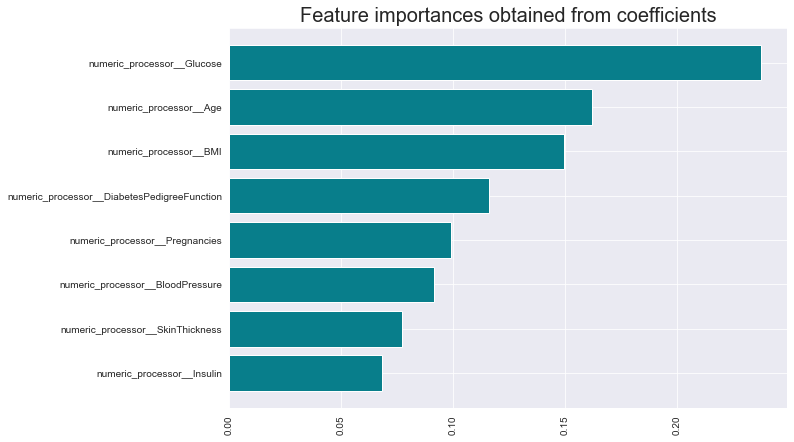

In [164]:
plt.figure(figsize = (10,7))
plt.barh(y=importances['Feature'], width=importances['Importance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [167]:
importances.sort_values(by='Importance', ascending=False)

,Feature,Importance
1,numeric_processor__Glucose,0.237204
7,numeric_processor__Age,0.161939
5,numeric_processor__BMI,0.149177
6,numeric_processor__DiabetesPedigreeFunction,0.115830
0,numeric_processor__Pregnancies,0.099113
2,numeric_processor__BloodPressure,0.091241
3,numeric_processor__SkinThickness,0.077218
4,numeric_processor__Insulin,0.068279


In [165]:
X_train_balanced.nunique().sort_values(ascending=False)

numeric_processor__DiabetesPedigreeFunction    563
numeric_processor__BMI                         371
numeric_processor__Glucose                     282
numeric_processor__Insulin                     235
numeric_processor__Age                         196
numeric_processor__BloodPressure               169
numeric_processor__SkinThickness               147
numeric_processor__Pregnancies                 121
dtype: int64

## Feature Selection

### Techniques for feature selection
1. Mutual Information - to get the feature importance 
2. Multicollinearity - to check and remove any highly correlated independent features
3. VarianceThreshold - To check and remove any low varinace continuous features

## Multicollinearity

### Correlation

In [168]:
train_df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,target
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
563,1,106,76,0,0,37.5,0.197,26,0
564,6,190,92,0,0,35.5,0.278,66,1
565,10,101,76,48,180,32.9,0.171,63,0
566,2,122,70,27,0,36.8,0.340,27,0


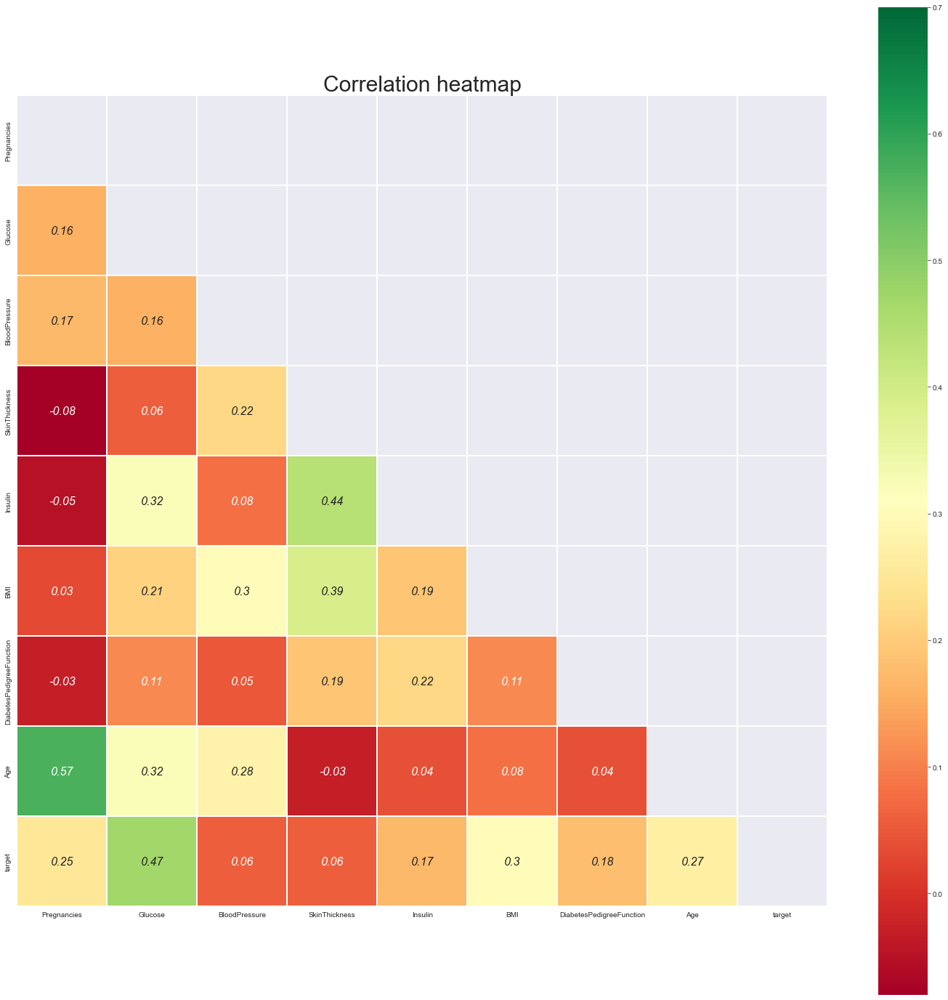

In [169]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(train_df.corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(train_df.corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

In [170]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [171]:
corr_features = correlation(X_train_balanced, 0.8)
print(len(set(corr_features)))
print(corr_features)

0
set()


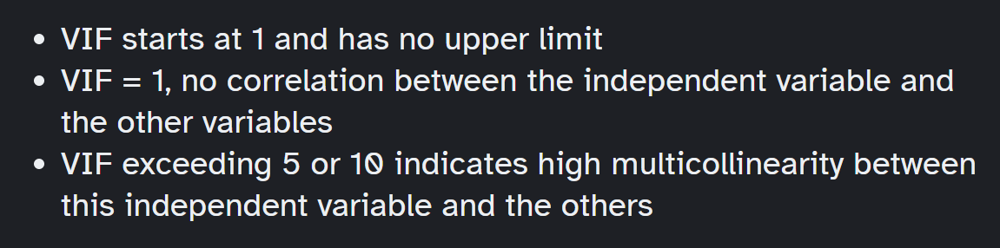

### Variance Inflation Factor (VIF)

https://www.analyticsvidhya.com/blog/2020/03/what-is-multicollinearity/

In [172]:
# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_balanced.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_balanced.values, i) for i in range(len(X_train_balanced.columns))]

vif_data = vif_data.sort_values(by='VIF', ascending=False)
vif_data

,feature,VIF
3,numeric_processor__SkinThickness,2.579728
4,numeric_processor__Insulin,2.363655
7,numeric_processor__Age,1.299275
0,numeric_processor__Pregnancies,1.243559
5,numeric_processor__BMI,1.192642
2,numeric_processor__BloodPressure,1.187293
1,numeric_processor__Glucose,1.140477
6,numeric_processor__DiabetesPedigreeFunction,1.067530


From above we can see VIF value for all features are less

### VarianceThreshold

In [175]:
# In this technique we will find the varince of all the features and we can remove the features which have low variance 
# by setting the threshold parameter

var_thres=VarianceThreshold()
var_thres.fit(X_train_balanced)

VarianceThreshold()

In [176]:
variances = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'variance': var_thres.variances_
})
variances = variances.sort_values(by='variance', ascending=True)

In [177]:
variances

,Feature,variance
3,numeric_processor__SkinThickness,0.213298
4,numeric_processor__Insulin,0.264938
6,numeric_processor__DiabetesPedigreeFunction,0.573403
1,numeric_processor__Glucose,0.626514
5,numeric_processor__BMI,0.712468
2,numeric_processor__BloodPressure,1.103920
7,numeric_processor__Age,1.514548
0,numeric_processor__Pregnancies,2.659238


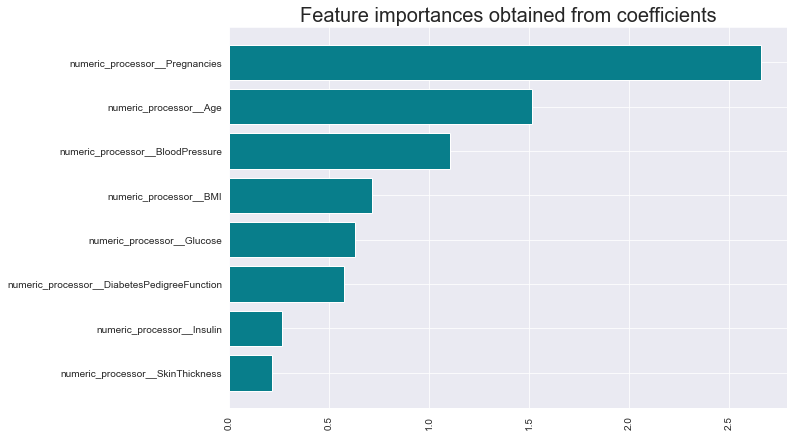

In [179]:
plt.figure(figsize = (10,7))
plt.barh(y=variances['Feature'], width=variances['variance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

### Mutual Information for Classification

In [180]:
mutual_info = mutual_info_classif(X_train_balanced, y_train_balanced)
mutual_info

array([0.14099012, 0.15219991, 0.1035232 , 0.03232048, 0.06499276,
       0.09257691, 0.01731339, 0.12692675])

In [181]:
mutual_info_df = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'MI': mutual_info
})
mutual_info_df = mutual_info_df.sort_values(by='MI', ascending=True)

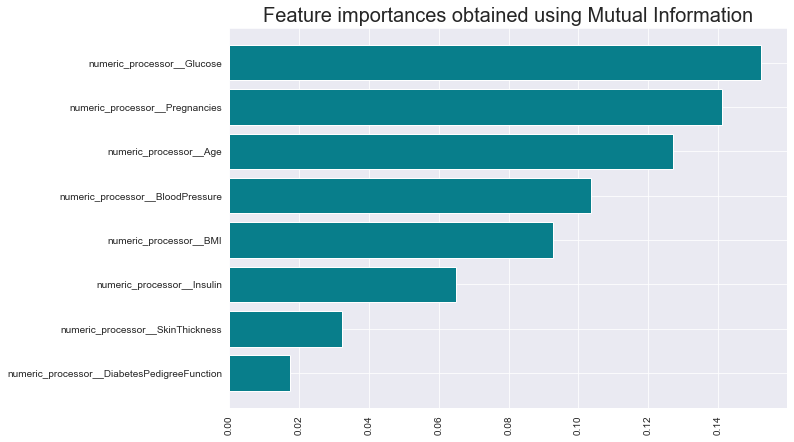

In [183]:
plt.figure(figsize = (10,7))
plt.barh(y=mutual_info_df['Feature'], width=mutual_info_df['MI'], color='#087E8B')
plt.title('Feature importances obtained using Mutual Information', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [185]:
mutual_info_df.sort_values(by='MI')

,Feature,MI
6,numeric_processor__DiabetesPedigreeFunction,0.017313
3,numeric_processor__SkinThickness,0.032320
4,numeric_processor__Insulin,0.064993
5,numeric_processor__BMI,0.092577
2,numeric_processor__BloodPressure,0.103523
7,numeric_processor__Age,0.126927
0,numeric_processor__Pregnancies,0.140990
1,numeric_processor__Glucose,0.152200


## PCA

In [394]:
# We will not do PCA becoz we have few features only only

## Building the final Model

In [186]:
X_train

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
563,1,106,76,0,0,37.5,0.197,26
564,6,190,92,0,0,35.5,0.278,66
565,10,101,76,48,180,32.9,0.171,63
566,2,122,70,27,0,36.8,0.340,27


In [187]:
y_train

0      1
1      0
2      1
3      0
4      1
      ..
563    0
564    1
565    0
566    0
567    0
Name: target, Length: 568, dtype: int64

In [188]:
smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

In [189]:
X_train_balanced

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.600000,0.627000,50
1,1,85,66,29,0,26.600000,0.351000,31
2,8,183,64,0,0,23.300000,0.672000,32
3,1,89,66,23,94,28.100000,0.167000,21
4,0,137,40,35,168,43.100000,2.288000,33
...,...,...,...,...,...,...,...,...
715,8,165,75,0,0,36.507788,0.614829,33
716,4,144,84,40,172,38.430593,0.546637,49
717,6,128,72,0,0,30.044246,0.322805,33
718,8,155,85,28,155,34.186241,1.154114,41


In [190]:
y_train_balanced

0      1
1      0
2      1
3      0
4      1
      ..
715    1
716    1
717    1
718    1
719    1
Name: target, Length: 720, dtype: int64

In [191]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['Pregnancies', 'Glucose',
                                                   'BloodPressure',
                                                   'SkinThickness', 'Insulin',
                                                   'BMI',
                                                   'DiabetesPedigreeFunction',
                                                   'Age']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  Index([], dtype='object'))])),
                ('scaler', RobustScaler())])

In [212]:
model=Pipeline([("final_pipe",final_pipe),
                ("clf",RandomForestClassifier())])

In [213]:
model.fit(X_train_balanced,y_train_balanced)

Pipeline(steps=[('final_pipe',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(transformers=[('numeric_processor',
                                                                   Pipeline(steps=[('imputation_mean',
                                                                                    SimpleImputer(add_indicator=True,
                                                                                                  strategy='median')),
                                                                                   ('quantiletransformer',
                                                                                    QuantileTransformer(output_distribution='normal'))]),
                                                                   ['Pregnancies',
                                                                    'Glucose',
                                                                    'BloodPressure',
                                                                    'SkinThickness',
                                                                    'Insulin',
                                                                    'BMI',
                                                                    'DiabetesPedigreeFunction',
                                                                    'Age']),
                                                                  ('categorical_processor',
                                                                   Pipeline(steps=[('imputation_consatnt',
                                                                                    SimpleImputer(fill_value='missing',
                                                                                                  strategy='constant')),
                                                                                   ('onehotencoder',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  max_categories=15,
                                                                                                  min_frequency=0.01,
                                                                                                  sparse_output=False))]),
                                                                   Index([], dtype='object'))])),
                                 ('scaler', RobustScaler())])),
                ('clf', RandomForestClassifier())])

In [214]:
X_val

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0,146,82,0,0,40.5,1.781,44
1,13,153,88,37,140,40.6,1.174,39
2,4,154,62,31,284,32.8,0.237,23
3,2,101,58,35,90,21.8,0.155,22
4,3,148,66,25,0,32.5,0.256,22
...,...,...,...,...,...,...,...,...
95,3,83,58,31,18,34.3,0.336,25
96,7,136,90,0,0,29.9,0.210,50
97,5,147,75,0,0,29.9,0.434,28
98,1,153,82,42,485,40.6,0.687,23


In [215]:
y_val

0     0
1     0
2     0
3     0
4     0
     ..
95    0
96    0
97    0
98    0
99    0
Name: target, Length: 100, dtype: int64

In [216]:
y_train_pred = model.predict(X_train_balanced)
train_score = accuracy_score(y_train_balanced,y_train_pred)
    
precision = precision_score(y_train_balanced,y_train_pred,average='macro')
recall = recall_score(y_train_balanced,y_train_pred,average='macro')
f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    
print(classification_report(y_train_balanced,y_train_pred))
    
y_val_pred = model.predict(X_val)

print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       360
           1       1.00      1.00      1.00       360

    accuracy                           1.00       720
   macro avg       1.00      1.00      1.00       720
weighted avg       1.00      1.00      1.00       720

              precision    recall  f1-score   support

           0       0.89      0.76      0.82        71
           1       0.56      0.76      0.65        29

    accuracy                           0.76       100
   macro avg       0.72      0.76      0.73       100
weighted avg       0.79      0.76      0.77       100



### Save Trained Model Using joblib

In [217]:
import joblib

In [218]:
joblib.dump(model, '../Models/diabetic_model')

['../Models/diabetic_model']

### Load Saved Model

In [219]:
model = joblib.load('../Models/diabetic_model')

In [220]:
X_test.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [225]:
X_test.head(2)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,92,62,32,126,32.0,0.085,46
1,5,132,80,0,0,26.8,0.186,69


In [222]:
y_test[:2]

0    0
1    0
Name: target, dtype: int64

In [226]:
test = pd.DataFrame(columns=X_test.columns)
test.loc[0] = [6,92,62,32,126,32.0,0.085,46]
test

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6.0,92.0,62.0,32.0,126.0,32.0,0.085,46.0


In [227]:
model.predict(test)

array([0], dtype=int64)

In [228]:
model.predict(X_test.head(5))

array([0, 0, 0, 0, 0], dtype=int64)

In [229]:
y_test[:5]

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

In [ ]:
# The below is the sample code to deploy this model using Gradio. you can tweek the below code for this project needs as deploy it.

In [209]:
X_train.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [ ]:
1. num_preg - Number of times pregnant
2. glucose_conc - Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. diastolic_bp - Diastolic blood pressure (mm Hg)
4. thickness - Triceps skin fold thickness (mm)
5. insulin - 2-Hour serum insulin (mu U/ml)
6. bmi - Body mass index (weight in kg/(height in m)^2)
7. diab_pred - Diabetes pedigree function
8. age - Age (years)
9. skin - 
10. target - class

In [ ]:
train_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']].describe().T

## Gradio deployment

In [ ]:
import gradio as gr
import random
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from datasets import load_dataset


matplotlib.use("Agg")
df = pd.read_csv('train_df.csv')
X_train = df.drop('target',axis=1)
y_train = df['target']



def predict(*args):
    df = pd.DataFrame([args], columns=X_train.columns)
    result = pipe_xgb.predict(final_pipe.transform(df))
    output = 'diabetic' if result[0]==1 else 'no diabetic' 
    return output



with gr.Blocks() as demo:
    gr.Markdown("""
    **Indian Loan Default Prediction **:  This demo uses an Random Forest classifier predicts loan default based on demographic factors.
    """)
    with gr.Row():
        with gr.Column():
            Pregnancies = gr.Slider(label="No.of Pregnensis", minimum=0, maximum=20, step=1, randomize=True)
            Glucose = gr.Slider(label="Glucose", minimum=0, maximum=400, step=1, randomize=True)
            BloodPressure = gr.Slider(label="blood pressure (mm Hg)", minimum=0, maximum=200, step=1, randomize=True)
            SkinThickness = gr.Slider(label="Triceps skin fold thickness (mm)", minimum=0, maximum=100, step=1, randomize=True)
            Insulin = gr.Slider(label="2-Hour serum insulin (mu U/ml)", minimum=0, maximum=1000, step=1, randomize=True)
            BMI = gr.Slider(label="Body mass index", minimum=0, maximum=100, step=0.5, randomize=True)
            DiabetesPedigreeFunction = gr.Slider(label="Diabetes pedigree function", minimum=0, maximum=10, step=0.5, randomize=True)
            Age = gr.Slider(label="Age", minimum=0, maximum=150, step=1, randomize=True)
            
            
        with gr.Column():
            label = gr.Label()
            with gr.Row():
                predict_btn = gr.Button(value="Predict")
            predict_btn.click(
                predict,
                inputs=[
                    Pregnancies,
                    Glucose,
                    BloodPressure,
                    SkinThickness,
                    Insulin,
                    BMI,
                    DiabetesPedigreeFunction,
                    Age,
                ],
                outputs=[label],
            )

demo.launch()

In [ ]:
demo.close()

In [ ]:
# The below is the sample code to deploy this model using Gradio. you can tweek the below code for this project needs as deploy it.

In [209]:
X_train.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [ ]:
1. num_preg - Number of times pregnant
2. glucose_conc - Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. diastolic_bp - Diastolic blood pressure (mm Hg)
4. thickness - Triceps skin fold thickness (mm)
5. insulin - 2-Hour serum insulin (mu U/ml)
6. bmi - Body mass index (weight in kg/(height in m)^2)
7. diab_pred - Diabetes pedigree function
8. age - Age (years)
9. skin - 
10. target - class

In [ ]:
train_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']].describe().T

## Gradio deployment

In [ ]:
import gradio as gr
import random
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from datasets import load_dataset


matplotlib.use("Agg")
df = pd.read_csv('train_df.csv')
X_train = df.drop('target',axis=1)
y_train = df['target']



def predict(*args):
    df = pd.DataFrame([args], columns=X_train.columns)
    result = pipe_xgb.predict(final_pipe.transform(df))
    output = 'diabetic' if result[0]==1 else 'no diabetic' 
    return output



with gr.Blocks() as demo:
    gr.Markdown("""
    **Indian Loan Default Prediction **:  This demo uses an Random Forest classifier predicts loan default based on demographic factors.
    """)
    with gr.Row():
        with gr.Column():
            Pregnancies = gr.Slider(label="No.of Pregnensis", minimum=0, maximum=20, step=1, randomize=True)
            Glucose = gr.Slider(label="Glucose", minimum=0, maximum=400, step=1, randomize=True)
            BloodPressure = gr.Slider(label="blood pressure (mm Hg)", minimum=0, maximum=200, step=1, randomize=True)
            SkinThickness = gr.Slider(label="Triceps skin fold thickness (mm)", minimum=0, maximum=100, step=1, randomize=True)
            Insulin = gr.Slider(label="2-Hour serum insulin (mu U/ml)", minimum=0, maximum=1000, step=1, randomize=True)
            BMI = gr.Slider(label="Body mass index", minimum=0, maximum=100, step=0.5, randomize=True)
            DiabetesPedigreeFunction = gr.Slider(label="Diabetes pedigree function", minimum=0, maximum=10, step=0.5, randomize=True)
            Age = gr.Slider(label="Age", minimum=0, maximum=150, step=1, randomize=True)
            
            
        with gr.Column():
            label = gr.Label()
            with gr.Row():
                predict_btn = gr.Button(value="Predict")
            predict_btn.click(
                predict,
                inputs=[
                    Pregnancies,
                    Glucose,
                    BloodPressure,
                    SkinThickness,
                    Insulin,
                    BMI,
                    DiabetesPedigreeFunction,
                    Age,
                ],
                outputs=[label],
            )

demo.launch()

In [ ]:
demo.close()

In [211]:
X_train

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
663,9,89,62,0,0,22.5,0.142,33
664,10,101,76,48,180,32.9,0.171,63
665,2,122,70,27,0,36.8,0.340,27
666,1,126,60,0,0,30.1,0.349,47


In [213]:
zeros_count = {}

for col in X_train.columns:
    if col == 'target':
        continue
    count = (X_train[col] == 0).sum()
    zeros_count[col]=count
df_zeros = pd.DataFrame.from_dict(zeros_count,orient='index',columns=['zeros'])
df_zeros['Percent'] = (df_zeros['zeros']/len(X_train))*100
df_zeros.sort_values(by=['zeros'],ascending=False)

,zeros,Percent
Insulin,316,47.305389
SkinThickness,194,29.041916
Pregnancies,97,14.520958
BloodPressure,31,4.640719
BMI,11,1.646707
Glucose,3,0.449102
DiabetesPedigreeFunction,0,0.000000
Age,0,0.000000


In [216]:
X_train[['Glucose','BloodPressure','SkinThickness','BMI','Age']] = X_train[['Glucose','BloodPressure','SkinThickness','BMI','Age']].replace({0:np.nan})

In [217]:
zeros_count = {}

for col in X_train.columns:
    if col == 'target':
        continue
    count = (X_train[col] == 0).sum()
    zeros_count[col]=count
df_zeros = pd.DataFrame.from_dict(zeros_count,orient='index',columns=['zeros'])
df_zeros['Percent'] = (df_zeros['zeros']/len(X_train))*100
df_zeros.sort_values(by=['zeros'],ascending=False)

,zeros,Percent
Insulin,316,47.305389
Pregnancies,97,14.520958
Glucose,0,0.000000
BloodPressure,0,0.000000
SkinThickness,0,0.000000
BMI,0,0.000000
DiabetesPedigreeFunction,0,0.000000
Age,0,0.000000


In [218]:
X_train.isna().sum()

Pregnancies                   0
Glucose                       3
BloodPressure                31
SkinThickness               194
Insulin                       0
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
dtype: int64

In [219]:
X_train

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.0,0,33.6,0.627,50
1,1,85.0,66.0,29.0,0,26.6,0.351,31
2,8,183.0,64.0,NaN,0,23.3,0.672,32
3,1,89.0,66.0,23.0,94,28.1,0.167,21
4,0,137.0,40.0,35.0,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
663,9,89.0,62.0,NaN,0,22.5,0.142,33
664,10,101.0,76.0,48.0,180,32.9,0.171,63
665,2,122.0,70.0,27.0,0,36.8,0.340,27
666,1,126.0,60.0,NaN,0,30.1,0.349,47


In [220]:
y_train

0      1
1      0
2      1
3      0
4      1
      ..
663    0
664    0
665    0
666    1
667    0
Name: target, Length: 668, dtype: int64

In [221]:
smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_res, y_res = smote.fit_resample(X_train, y_train)

ValueError: Input X contains NaN.
SMOTE does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values